In [1]:
import pygco
import numpy as np
import cv2
from PIL import Image
from pylab import *
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

SOURCE_COLOR = np.array([0,0,255])
SINK_COLOR = np.array([245,210,110])
nLabels = 2 # binary cut

In [2]:
def getDist(d, Tx):
    # d is the RGB value of a certain position
    # Tx is source or sink labels that are already tranformed by T(x) to the RGB domain
    return np.linalg.norm(d-Tx)

In [3]:
vec = np.array([0,0,255])
print(getDist(vec, SOURCE_COLOR))
print(getDist(vec, SINK_COLOR))

0.0
353.7654590261746


In [4]:
# def getPriorTermAndValue(x1, x2):
#     return np.array([x1, x2]), 1

In [5]:
# # Testing block:
# x = np.array([1,1])
# d = np.array([2,1])
# getDataTermValue(x, d)

In [6]:
def buildGraphFromImage(img, nLabels):
    imgHeight = img.shape[0] # range of vertical rows
    imgWidth = img.shape[1] # range of horizontal columns

    nNodes = imgHeight*imgWidth
    nEdges = (2*imgHeight*imgWidth-imgHeight-imgWidth)
    
    edges = np.zeros((nEdges, 2))
    edgeWeights = np.ones((nEdges))
    unaryCosts = np.zeros((nNodes, nLabels))
    
    # r for row and c for column of a image
    edgeIndex = 0;
    for r in range(0, imgHeight):
        for c in range(0, imgWidth):
            # get edges and weights from current node to right next node and bottom next node:
            nodeNo = r*imgWidth+c
            rightNodeNo = nodeNo+1
            bottomNodeNo = nodeNo+imgWidth
            if(rightNodeNo < nNodes and c < imgWidth-1):
                edges[edgeIndex,:] = np.array([nodeNo, rightNodeNo])
                edgeIndex+=1
            if(bottomNodeNo < nNodes and r < imgHeight-1):
                edges[edgeIndex,:] = np.array([nodeNo, bottomNodeNo])
                edgeIndex+=1
            # get unary costs/ data term array:
            nodeRGB = img[r][c]
            print(nodeRGB)
            sWeight = getDist(nodeRGB, SOURCE_COLOR)
            tWeight = getDist(nodeRGB, SINK_COLOR)
#             print(sWeight)
#             print(tWeight)
#             print('---')
            unaryCosts[nodeNo,:] = np.array([sWeight, tWeight])

    return edges, edgeWeights, unaryCosts

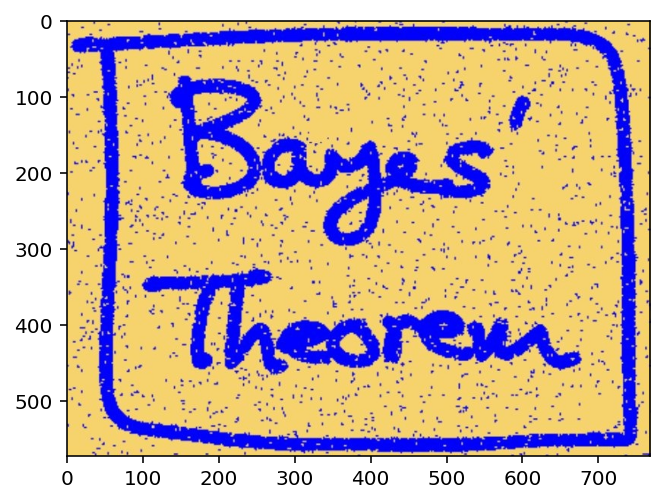

[212 174  93]
[200 162  79]
[193 155  72]
[204 167  79]
[228 191 102]
[246 210 116]
[248 212 115]
[243 208 106]
[246 211 109]
[246 211 107]
[246 212 105]
[246 212 105]
[246 211 107]
[246 211 107]
[246 211 107]
[248 210 109]
[247 204 110]
[251 208 113]
[252 213 110]
[248 214 104]
[243 212  95]
[241 212  94]
[245 212  97]
[251 215 105]
[249 210 107]
[251 209 111]
[252 208 113]
[251 208 114]
[249 209 113]
[246 210 113]
[245 211 111]
[242 211 118]
[241 212 132]
[230 202 154]
[202 173 175]
[124  99 120]
[134 110 123]
[211 189 176]
[230 205 151]
[240 211 135]
[246 208 125]
[249 208 118]
[251 209 111]
[249 211 104]
[248 212  98]
[246 212 102]
[246 209 118]
[248 208 121]
[245 205 110]
[246 206 110]
[250 211 116]
[248 213 119]
[243 210 113]
[241 213 114]
[243 215 118]
[237 211 116]
[242 215 124]
[237 211 118]
[241 212 112]
[245 214 108]
[243 211 102]
[247 210 104]
[252 211 119]
[250 209 117]
[248 210 113]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 2

[239 213 156]
[222 194 182]
[157 126 134]
[128  94  95]
[202 167 139]
[245 209 131]
[253 215 116]
[253 212 120]
[247 206 114]
[243 208 108]
[246 213 110]
[250 215 115]
[249 214 120]
[246 208 125]
[246 208 127]
[246 209 118]
[243 205 108]
[246 208 107]
[251 213 112]
[247 209 108]
[247 212 110]
[249 215 115]
[239 206 113]
[243 208 127]
[246 210 136]
[240 204 130]
[238 201 120]
[242 209 106]
[248 216 105]
[246 213 106]
[247 213 113]
[249 215 118]
[250 213 122]
[250 211 120]
[247 209 110]
[243 207  95]
[239 206  93]
[245 211 113]
[244 211 116]
[245 212 115]
[244 214 116]
[244 214 118]
[245 212 117]
[245 211 114]
[245 211 113]
[239 203 106]
[249 214 114]
[253 215 118]
[245 207 110]
[244 206 109]
[248 212 116]
[248 213 119]
[238 207 116]
[228 201 112]
[237 210 129]
[234 205 137]
[241 211 149]
[243 209 148]
[238 204 133]
[244 208 120]
[237 201 104]
[246 211 109]
[245 211 111]
[245 211 114]
[244 211 116]
[244 211 114]
[242 212 114]
[242 212 114]
[241 213 116]
[241 212 118]
[242 213 119]
[238 2

[238 212 102]
[238 211  98]
[244 217 102]
[241 216 100]
[241 215 104]
[242 214 107]
[242 213 111]
[245 211 113]
[245 211 111]
[246 212 105]
[246 212 104]
[245 212 109]
[245 211 111]
[245 211 111]
[245 212 109]
[245 212 109]
[245 212 109]
[245 211 111]
[245 211 111]
[245 211 113]
[245 211 114]
[245 210 116]
[245 210 116]
[245 211 114]
[245 211 113]
[245 211 113]
[245 211 111]
[248 210 111]
[248 210 109]
[246 211 109]
[245 211 111]
[245 211 114]
[244 212 111]
[245 213 104]
[245 213 104]
[246 210 113]
[248 209 116]
[248 209 114]
[248 210 113]
[248 210 113]
[246 211 111]
[245 212 109]
[245 211 111]
[244 212 113]
[244 211 114]
[245 210 118]
[245 210 118]
[246 210 114]
[246 210 113]
[246 210 116]
[245 210 120]
[241 206 122]
[245 210 128]
[244 211 130]
[243 210 133]
[245 208 137]
[246 210 136]
[246 209 128]
[241 206 122]
[239 206 129]
[237 208 132]
[238 211 130]
[237 211 137]
[233 208 154]
[229 203 166]
[227 200 171]
[228 198 174]
[227 195 172]
[230 196 169]
[226 191 161]
[237 203 158]
[243 2

[176 152 212]
[ 71  41 139]
[ 98  68 168]
[169 144 212]
[198 177 218]
[199 178 197]
[204 185 191]
[201 178 184]
[207 184 192]
[214 185 203]
[208 179 199]
[215 184 200]
[208 179 181]
[221 195 172]
[239 213 180]
[221 193 169]
[208 181 152]
[229 202 159]
[232 207 167]
[215 186 172]
[214 184 182]
[215 187 184]
[210 181 185]
[215 187 202]
[205 178 211]
[198 175 229]
[115  93 165]
[ 51  27 113]
[132 110 185]
[191 175 212]
[190 177 194]
[197 180 196]
[200 183 193]
[212 191 198]
[206 185 180]
[212 192 167]
[236 215 188]
[216 192 180]
[208 181 186]
[213 184 206]
[179 154 212]
[ 71  57 170]
[ 18   8 156]
[ 25  10 173]
[ 33  17 176]
[ 15   1 138]
[101  92 207]
[175 169 255]
[ 89  84 187]
[ 21  12 155]
[ 25  12 180]
[ 22   8 191]
[ 10   0 170]
[ 73  65 202]
[149 144 255]
[110 102 221]
[ 30  24 146]
[ 18  18 148]
[ 15  13 158]
[ 23  15 180]
[ 24   9 190]
[ 29   6 202]
[ 75  51 227]
[146 127 252]
[189 174 255]
[186 176 247]
[110 101 184]
[ 34  19 146]
[ 21   4 160]
[ 27   9 179]
[ 20   3 180]
[ 21  

[  6   2 249]
[  7   6 248]
[  1   4 241]
[  0   2 240]
[  0   5 251]
[  1   5 254]
[  2   0 247]
[  6   2 247]
[  4   0 245]
[  4   2 249]
[  0   1 251]
[  0   3 253]
[  0   5 255]
[  0   0 251]
[  0   0 245]
[  9   5 252]
[  0   1 251]
[  0   2 251]
[  0   2 249]
[  0   2 245]
[  0   3 242]
[  1   2 243]
[  1   0 251]
[  1   0 251]
[  2   2 246]
[  2   3 244]
[  1   1 245]
[  0   2 245]
[  0   2 247]
[  0   2 249]
[  0   2 247]
[  0   2 249]
[  0   1 251]
[  0   1 251]
[  0   1 252]
[  0   1 251]
[  0   1 252]
[  0   1 251]
[  0   1 252]
[  0   1 251]
[  0   1 252]
[  0   1 251]
[  0   1 252]
[  0   1 251]
[  0   1 252]
[  0   1 251]
[  0   1 252]
[  0   1 251]
[  1   2 253]
[  2   3 254]
[  2   1 253]
[  1   1 249]
[  2   2 240]
[  5   3 237]
[  8   1 239]
[  8   2 226]
[ 41  38 229]
[ 50  48 233]
[ 28  22 232]
[ 13   6 232]
[  0   0 230]
[ 12  11 252]
[  0   0 241]
[  2   4 247]
[  0   4 238]
[  0   4 240]
[  0   2 247]
[  0   2 252]
[  0   1 254]
[  0   1 252]
[  0   2 251]
[  0  

[  0   1 252]
[  0   1 252]
[  0   1 252]
[  0   1 252]
[  0   1 252]
[  0   1 252]
[  0   1 252]
[  0   1 252]
[  0   1 252]
[  0   1 251]
[  0   2 247]
[  1   2 243]
[  1   2 242]
[  1   2 243]
[  1   1 245]
[  1   1 247]
[  1   1 245]
[  2   3 241]
[  4   5 243]
[  3   3 247]
[  0   0 248]
[  0   0 250]
[  3   2 253]
[  4   3 255]
[  2   3 254]
[  0   2 253]
[  0   4 254]
[  0   4 254]
[  0   3 249]
[  0   4 242]
[  0   6 242]
[  0   4 251]
[  0   3 252]
[  1   2 253]
[  1   2 250]
[  1   3 244]
[  2   3 243]
[  2   2 248]
[  2   1 252]
[  2   1 253]
[  2   1 253]
[  2   0 251]
[  1   0 251]
[  1   1 249]
[  2   2 248]
[  2   2 248]
[  2   2 250]
[  2   1 253]
[  2   1 253]
[  2   1 252]
[  2   1 252]
[  2   1 252]
[  2   2 250]
[  2   2 248]
[  2   2 246]
[  2   2 246]
[  2   2 248]
[  1   1 249]
[  1   1 249]
[  2   0 247]
[  2   0 247]
[  2   0 251]
[  1   0 251]
[  1   0 251]
[  0   1 249]
[  1   6 248]
[  0   7 246]
[  0   6 245]
[  0   4 246]
[  0   1 249]
[  1   1 249]
[  2  

[  0   0 248]
[  1   2 252]
[  0   3 252]
[  0   2 253]
[  0   3 252]
[  0   2 253]
[  0   3 252]
[  0   2 253]
[  0   3 252]
[  0   2 253]
[  0   3 252]
[  0   2 253]
[  0   3 252]
[  0   2 253]
[  0   3 252]
[  0   2 253]
[  0   3 252]
[  1   2 252]
[  1   2 252]
[  1   2 252]
[  0   1 251]
[  0   1 251]
[  0   1 251]
[  0   0 251]
[  1   0 251]
[  3   0 250]
[  4   0 246]
[  4   0 239]
[  5   0 240]
[  4   0 243]
[  4   0 249]
[  2   0 252]
[  1   0 251]
[  6   3 255]
[  1   0 250]
[  0   0 243]
[  2   1 243]
[  0   1 242]
[  0   0 237]
[  0   6 235]
[  1  12 241]
[  0   6 243]
[  0   5 246]
[  0   3 250]
[  0   1 249]
[  0   2 245]
[  0   2 243]
[  0   2 247]
[  1   2 243]
[  0   0 232]
[  7   6 232]
[  7   9 232]
[  0   3 230]
[  0   3 242]
[  0   0 244]
[  0   0 240]
[  0   2 239]
[  0   0 233]
[  0   2 237]
[  0   0 246]
[  1   0 251]
[  0   1 252]
[  2   3 251]
[  0   5 244]
[  0   6 242]
[  5  12 251]
[  0   2 236]
[  1   3 226]
[  2   2 214]
[ 10   9 211]
[  1   0 207]
[  9  

[ 90  70 167]
[ 69  48 167]
[ 31   5 138]
[ 63  37 147]
[ 99  71 129]
[170 144 147]
[233 208 152]
[243 218 128]
[235 207 107]
[239 213 103]
[245 220 102]
[242 215  98]
[244 214 104]
[250 200 111]
[255 213 117]
[247 205  95]
[246 209  95]
[253 220 115]
[241 214 123]
[227 206 141]
[213 197 172]
[176 162 195]
[101  88 176]
[ 34  22 166]
[ 10   1 178]
[ 10   0 193]
[ 10   3 205]
[ 11   3 210]
[  7   1 215]
[ 10   3 231]
[  9   2 238]
[  9   1 245]
[  9   0 249]
[  9   0 249]
[  6   0 248]
[  6   0 246]
[  5   1 248]
[  4   0 249]
[  2   0 251]
[  2   0 252]
[  1   0 252]
[  1   0 251]
[  0   1 251]
[  0   1 252]
[  2   3 235]
[ 26  23 214]
[134 130 255]
[157 153 255]
[ 61  55 205]
[  4   0 195]
[ 14   5 234]
[  9   4 244]
[  2   0 236]
[  2   2 222]
[  6   9 228]
[  5   9 241]
[  0   3 239]
[  0   3 232]
[  0   7 230]
[  7   7 225]
[  8   5 220]
[  5   2 215]
[  5   2 213]
[ 15  13 220]
[ 13  11 216]
[  1   0 200]
[  7   8 210]
[ 15  16 222]
[  2   3 217]
[  4   3 229]
[  2   2 236]
[  1  

[  4   0 247]
[  7   6 250]
[  2   1 243]
[  0   0 240]
[  1   1 247]
[  1   0 251]
[  1   0 252]
[  1   0 254]
[  1   0 254]
[  1   0 251]
[  1   1 245]
[  1   2 243]
[  3   4 245]
[  4   4 248]
[  3   3 249]
[  0   2 245]
[  0   3 240]
[  1   4 241]
[  2   4 245]
[  3   3 241]
[ 12   7 231]
[ 14   7 198]
[ 47  35 173]
[104  88 163]
[184 166 164]
[238 215 163]
[240 209 129]
[243 208 114]
[246 210 113]
[248 210 111]
[248 210 111]
[248 210 111]
[246 211 111]
[246 211 109]
[245 211 111]
[245 212 109]
[245 212 109]
[245 212 109]
[246 211 109]
[246 211 109]
[248 210 111]
[248 210 111]
[248 210 111]
[245 211 113]
[241 212 120]
[239 213 118]
[241 213 113]
[244 212 109]
[246 211 107]
[248 210 109]
[249 208 118]
[249 208 118]
[249 209 111]
[247 207 109]
[248 210 113]
[247 212 118]
[238 204 114]
[245 213 138]
[221 187 141]
[205 170 132]
[228 195 144]
[236 204 147]
[243 211 152]
[243 210 156]
[215 180 138]
[215 181 136]
[234 200 139]
[246 213 136]
[236 202 112]
[241 207 107]
[249 212 106]
[251 2

[244 209 125]
[247 211 114]
[242 207 117]
[244 210 123]
[239 208 125]
[238 211 132]
[242 218 144]
[229 204 147]
[227 202 172]
[229 203 202]
[206 177 205]
[ 97  69 110]
[ 91  62 108]
[191 165 202]
[220 197 215]
[219 201 225]
[137 122 181]
[37 22 89]
[129 113 160]
[218 203 246]
[213 198 253]
[173 161 245]
[ 70  62 199]
[ 12   9 188]
[  4   7 224]
[  1   6 245]
[  5   9 255]
[  0   0 251]
[  0   0 250]
[  8   5 255]
[  6   1 251]
[  2   0 249]
[  1   5 254]
[  0   5 251]
[  1   3 244]
[  3   2 243]
[  5   1 248]
[  5   0 250]
[  2   1 252]
[  0   1 249]
[  0   1 246]
[  0   3 242]
[  7   8 238]
[ 10   4 218]
[ 19   4 195]
[ 93  75 209]
[191 175 220]
[225 207 183]
[237 214 144]
[236 208 111]
[245 209 112]
[252 212 114]
[249 205 106]
[250 208 110]
[253 214 121]
[245 210 116]
[239 207 108]
[240 208 105]
[250 218 107]
[247 211 101]
[244 206  99]
[250 208 106]
[248 206 106]
[253 214 113]
[248 211 107]
[246 212 105]
[248 211 105]
[248 211 107]
[248 211 107]
[248 210 109]
[248 210 113]
[246 210 

[84 53 61]
[90 57 66]
[138 102  88]
[217 181 121]
[248 212 124]
[246 210 113]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 111]
[249 209 113]
[248 210 113]
[248 211 107]
[246 211 107]
[245 212 109]
[245 212 109]
[246 212 104]
[248 212 102]
[251 211 100]
[252 210 102]
[252 209 107]
[252 208 109]
[249 210 107]
[248 210 109]
[246 210 113]
[244 210 120]
[245 214 132]
[225 194 139]
[141 107  97]
[82 44 67]
[87 50 93]
[80 43 84]
[86 53 62]
[145 115  91]
[232 200 141]
[240 207 126]
[248 211 122]
[250 211 118]
[249 208 118]
[247 206 114]
[247 208 113]
[246 212 115]
[236 207 113]
[240 213 136]
[225 193 155]
[191 159 148]
[210 175 179]
[207 173 163]
[216 185 130]
[242 211 128]
[245 211 113]
[242 208 100]
[248 212 102]
[252 215 111]
[246 210 116]
[245 209 121]
[244 210 120]
[235 204 111]
[243 211 110]
[245 214 108]
[244 213 105]
[244 214 1

[248 211 107]
[245 211 114]
[244 211 118]
[244 211 116]
[244 212 113]
[244 212 111]
[244 211 114]
[244 210 123]
[245 209 123]
[246 210 114]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[245 212 109]
[244 212 109]
[241 211 113]
[246 212 125]
[243 207 123]
[244 209 117]
[249 213 117]
[247 213 115]
[245 211 114]
[244 208 120]
[247 212 122]
[249 215 117]
[244 209 107]
[243 205 108]
[252 214 117]
[255 217 116]
[246 206 108]
[248 209 118]
[246 209 121]
[245 209 121]
[244 210 120]
[244 210 121]
[242 211 120]
[242 211 118]
[242 212 114]
[244 212 109]
[245 213 104]
[246 213 100]
[246 213  97]
[246 213  98]
[246 213 100]
[246 212 105]
[245 212 107]
[241 210 102]
[237 211 114]
[237 213 139]
[228 203 163]
[167 134 143]
[134  99 106]
[189 156 115]
[236 204 131]
[244 209 125]
[244 210 120]
[242 211 118]
[242 212 114]
[245 212 109]
[248 211 104]
[252 2

[243 210 113]
[242 208 110]
[246 208 111]
[248 209 114]
[247 212 120]
[248 214 125]
[249 217 134]
[227 193 129]
[164 128  92]
[156 119 100]
[141 106  86]
[187 154 113]
[239 211 128]
[242 214 107]
[244 215  98]
[245 213 100]
[246 210 113]
[248 209 116]
[248 210 113]
[248 210 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[245 212 109]
[241 213 113]
[242 213 109]
[245 213 102]
[248 212 100]
[251 210 105]
[251 209 107]
[249 210 105]
[248 211 104]
[246 212 104]
[245 213 104]
[245 212 107]
[246 211 107]
[248 211 104]
[248 211 104]
[248 211 105]
[248 211 107]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 210 114]
[255 218 134]
[243 203 134]
[251 218 165]
[168 1

[242 209 112]
[243 211 108]
[248 213 109]
[248 213 109]
[246 211 107]
[248 210 109]
[248 210 109]
[248 210 109]
[248 210 109]
[248 210 109]
[249 209 113]
[249 209 113]
[249 209 111]
[249 210 109]
[248 210 109]
[248 211 107]
[248 211 104]
[246 212 105]
[245 211 113]
[245 211 113]
[245 212 107]
[245 213 104]
[245 213 104]
[245 212 105]
[245 212 107]
[246 211 109]
[246 211 109]
[246 212 105]
[244 208  96]
[254 216 105]
[246 209 105]
[242 205 101]
[252 218 111]
[249 214 112]
[241 204 113]
[248 211 122]
[250 214 118]
[245 207 106]
[246 210 100]
[249 213 101]
[247 213 103]
[247 214 109]
[248 213 119]
[243 209 111]
[246 214 101]
[240 208  97]
[247 211 117]
[250 210 123]
[252 211 119]
[253 213 115]
[245 206 103]
[247 208 105]
[249 210 109]
[248 211 107]
[248 211 105]
[248 211 107]
[248 210 111]
[248 210 113]
[248 210 113]
[248 210 111]
[249 211 110]
[250 212 111]
[245 205 109]
[251 211 116]
[246 210 113]
[246 214 115]
[248 219 119]
[239 207 106]
[239 203 106]
[255 218 121]
[250 210 114]
[248 2

[248 211 104]
[248 212 100]
[248 212  98]
[248 213  97]
[248 212 100]
[246 212 105]
[248 211 107]
[249 210 107]
[248 211 105]
[246 212 102]
[246 212 104]
[245 212 109]
[245 211 113]
[246 210 114]
[246 210 116]
[246 211 119]
[238 206 129]
[236 213 163]
[199 183 184]
[ 99  88 167]
[ 44  41 184]
[ 13  17 212]
[  0   3 231]
[  0   4 246]
[  0   3 252]
[  1   1 247]
[  1   1 245]
[  1   1 245]
[  1   1 247]
[  1   2 253]
[  0   2 253]
[  6  10 255]
[  0   1 246]
[  0   0 243]
[  5   1 244]
[ 22  13 244]
[ 11   0 198]
[ 37  30 168]
[ 71  60 129]
[178 154 142]
[230 200 138]
[247 214 133]
[247 214 133]
[240 206 145]
[252 219 168]
[239 205 157]
[242 208 145]
[241 206 116]
[246 213 108]
[239 211 102]
[240 213 136]
[184 154 144]
[78 46 67]
[119  88 103]
[219 187 172]
[241 208 139]
[245 211 113]
[245 211 113]
[245 212 109]
[246 211 109]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 109]
[246 211 109]
[246 211 111]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 107]
[246 211 107]
[248 210 

[245 212 115]
[234 200 102]
[254 214 118]
[250 207 112]
[246 210 114]
[245 211 113]
[245 211 113]
[245 212 109]
[246 211 109]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 109]
[246 211 109]
[246 211 111]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 107]
[246 211 107]
[253 216 112]
[247 210 106]
[242 207 105]
[243 211 110]
[241 213 114]
[237 209 125]
[236 206 146]
[238 207 160]
[246 214 167]
[229 199 139]
[240 212 128]
[243 215 118]
[236 204 105]
[248 213 113]
[252 214 115]
[245 207 108]
[248 210 111]
[246 211 109]
[246 211 109]
[246 211 107]
[245 212 107]
[245 212 107]
[244 212 109]
[244 212 111]
[241 209 110]
[250 218 119]
[247 213 115]
[239 204 104]
[243 208 106]
[251 214 108]
[249 212 105]
[243 209 102]
[249 215 115]
[241 207 109]
[247 212 110]
[249 212 106]
[247 208 103]
[252 211 103]
[249 209  96]
[246 209  94]
[248 212  98]
[246 213 100]
[245 213 104]
[245 212 107]
[244 212 113]
[244 211 118]
[244 210 121]
[241 210 130]
[235 210 144]
[232 209 157]
[234 206 169]
[235 2

[245 213 104]
[245 212 105]
[248 209 114]
[249 208 118]
[249 209 113]
[248 210 113]
[248 209 114]
[246 211 111]
[246 212 104]
[245 214  98]
[245 215  93]
[245 214  97]
[246 211 109]
[246 210 114]
[248 210 111]
[248 211 107]
[248 212 102]
[248 212 100]
[249 211 104]
[249 210 105]
[248 211 107]
[248 211 107]
[248 211 105]
[246 212 105]
[245 212 105]
[244 211 114]
[241 208 131]
[229 196 142]
[209 174 146]
[207 171 157]
[210 176 167]
[203 171 158]
[201 171 145]
[226 196 146]
[242 210 127]
[245 211 111]
[245 211 111]
[245 211 111]
[245 212 109]
[245 212 109]
[246 211 107]
[246 212 105]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[248 210 109]
[248 210 109]
[248 210 109]
[246 211 109]
[245 212 107]
[245 212 107]
[246 211 107]
[246 212 105]
[248 211 105]
[248 210 109]
[246 210 116]
[246 209 120]
[243 206 117]
[249 213 125]
[243 211 126]
[238 203 149]
[130  89  95]
[74 33 49]
[181 149 124]
[238 207 150]
[242 209 130]
[245 210 120]
[245 210 118]
[246 210 116]
[248 210 111]
[249 209 

[244 213 107]
[245 211 113]
[245 211 114]
[245 211 114]
[245 211 113]
[245 211 111]
[246 211 109]
[246 211 107]
[246 211 107]
[246 211 109]
[246 211 111]
[246 210 113]
[246 210 113]
[246 211 111]
[246 211 111]
[246 210 114]
[245 211 114]
[244 213 107]
[244 214 104]
[245 212 105]
[246 211 107]
[248 210 113]
[248 210 113]
[246 211 107]
[246 212 115]
[249 216 139]
[211 181 143]
[133 108 127]
[ 81  62 151]
[ 21  12 183]
[ 12   8 229]
[ 13  10 247]
[  0   0 242]
[  4   0 243]
[  8   5 236]
[ 13   7 217]
[ 43  37 223]
[ 73  67 227]
[ 73  67 225]
[ 55  50 231]
[ 15  10 214]
[  5   2 229]
[  6   6 244]
[  0   0 237]
[  1   0 230]
[ 12   9 222]
[ 39  29 178]
[164 142 181]
[235 206 172]
[237 209 136]
[241 213 116]
[245 214 108]
[246 213 106]
[247 209 108]
[248 210 109]
[248 211 107]
[248 210 109]
[246 210 116]
[245 209 123]
[244 209 128]
[244 208 130]
[245 209 125]
[245 210 120]
[246 210 113]
[246 211 109]
[248 210 109]
[248 210 109]
[248 210 111]
[248 210 111]
[246 211 109]
[246 211 107]
[246 2

[ 55  49 175]
[ 12   9 200]
[  5   2 217]
[ 11   8 223]
[ 21  16 207]
[ 22  13 200]
[ 27  15 213]
[ 16   3 215]
[ 13   4 231]
[ 17  10 246]
[  0   0 238]
[  0   0 241]
[  4   3 247]
[  0   0 242]
[  0   0 243]
[ 11   5 235]
[ 21   9 207]
[ 55  38 170]
[170 145 177]
[235 205 167]
[242 208 134]
[246 210 114]
[246 211 111]
[246 211 107]
[248 210 109]
[248 210 109]
[248 210 113]
[248 210 113]
[248 210 113]
[248 210 111]
[248 211 105]
[248 211 104]
[246 212 105]
[246 211 107]
[246 211 111]
[246 210 113]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[134 113 132]
[133 111 123]
[134 114 107]
[154 135 105]
[198 182 122]
[238 221 151]
[232 212 153]
[200 175 144]
[146 112 128]
[137  98 129]
[147 106 120]
[199 161 140]
[241 207 136]
[247 212 118]
[250 210 122]
[246 207 116]
[246 210 113]
[246 211 109]
[246 2

[244 209 107]
[242 207 105]
[246 208 107]
[251 213 114]
[251 211 113]
[246 208 111]
[246 211 111]
[245 212 109]
[245 212 107]
[244 213 107]
[244 212 113]
[242 211 118]
[242 210 123]
[241 210 127]
[241 210 128]
[241 210 127]
[242 210 123]
[244 211 118]
[244 212 113]
[245 212 109]
[245 211 111]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[245 212 107]
[245 2

[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 107]
[245 212 105]
[245 213 104]
[246 211 107]
[246 211 109]
[248 210 113]
[248 210 113]
[248 210 111]
[248 210 109]
[251 214 108]
[246 212 102]
[244 211  98]
[244 212  99]
[246 214 101]
[246 216 102]
[248 218 108]
[250 220 108]
[245 213 100]
[246 212 102]
[249 209 113]
[251 208 116]
[249 209 113]
[246 210 116]
[242 210 127]
[235 205 169]
[152 115 166]
[ 53  18 102]
[ 75  43 116]
[100  72 110]
[181 153 139]
[232 206 147]
[239 210 118]
[247 216 110]
[244 212 111]
[245 211 111]
[245 213 104]
[246 212 105]
[248 210 113]
[248 210 111]
[248 212 100]
[248 212  98]
[241 209 100]
[243 2

[  6   4 202]
[ 41  35 203]
[ 86  79 219]
[106  95 213]
[ 97  83 204]
[ 64  48 198]
[ 24  10 185]
[ 11   0 200]
[ 10   4 224]
[  9   5 240]
[  0   0 234]
[  9   7 240]
[ 11   7 224]
[  0   0 184]
[105 100 255]
[190 184 255]
[103  96 210]
[ 26  20 192]
[ 10   4 216]
[  8   2 234]
[  5   1 222]
[ 42  37 225]
[ 98  93 245]
[118 113 231]
[127 120 223]
[112 101 206]
[104  91 209]
[110  97 239]
[ 81  69 237]
[ 30  24 218]
[ 11   8 219]
[ 11   6 223]
[ 11   5 225]
[  7   2 218]
[  7   2 216]
[ 11   6 220]
[  7   4 215]
[  5   1 210]
[  9   5 216]
[ 17  10 227]
[ 10   0 219]
[ 14   0 220]
[ 20   5 218]
[ 14   1 195]
[ 18   7 173]
[ 65  58 188]
[128 117 219]
[135 114 193]
[140 114 177]
[139 115 167]
[138 116 155]
[149 125 151]
[173 152 149]
[210 189 146]
[239 215 151]
[234 205 139]
[244 212 137]
[243 208 114]
[249 212 108]
[251 212 107]
[251 209 111]
[254 208 123]
[242 201 122]
[241 209 132]
[239 210 154]
[188 155 136]
[129  94  98]
[126  94 105]
[142 114 111]
[195 172 140]
[208 186 147]
[172 1

[249 220 128]
[243 211 110]
[243 212 104]
[247 214 107]
[244 211 106]
[245 211 113]
[249 215 118]
[241 209 110]
[241 210 120]
[238 203 135]
[198 164 129]
[150 120 128]
[152 123 141]
[169 139 131]
[212 180 139]
[239 211 128]
[242 213 111]
[248 214 116]
[245 210 116]
[246 209 121]
[245 210 118]
[245 211 111]
[244 212 111]
[244 211 118]
[244 210 120]
[245 211 114]
[245 212 109]
[245 213 100]
[246 213  98]
[246 213 100]
[246 212 104]
[246 211 109]
[245 211 111]
[245 212 109]
[245 212 107]
[248 216 107]
[245 213 102]
[242 210  99]
[243 210 103]
[246 211 109]
[249 211 112]
[249 209 113]
[245 204 122]
[249 213 155]
[211 183 171]
[136 121 176]
[ 80  73 187]
[ 26  21 183]
[ 52  49 224]
[114 110 255]
[ 69  66 235]
[ 10   4 218]
[  6   2 236]
[  2   5 230]
[  1   6 232]
[  1   4 241]
[  1   3 246]
[  2   2 248]
[  2   1 252]
[  1   0 252]
[  1   0 254]
[  1   0 254]
[  1   0 252]
[  2   0 252]
[  2   0 251]
[  2   0 249]
[  2   0 249]
[  2   0 251]
[  1   0 252]
[  1   0 254]
[  1   0 254]
[  1  

[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[248 211 107]
[246 211 109]
[245 211 113]
[244 212 111]
[242 215 102]
[242 215 100]
[242 214 105]
[244 212 111]
[246 211 117]
[246 211 117]
[239 209 111]
[239 215 129]
[233 213 154]
[182 161 166]
[ 69  37 146]
[ 33   6 181]
[ 13   3 211]
[  2   0 231]
[  3   1 248]
[  3   2 253]
[  0   0 243]
[  0   1 242]
[  0   4 249]
[  0   1 248]
[  3   4 254]
[  2   4 249]
[  3   4 244]
[  1   0 241]
[  0   0 240]
[ 16  11 253]
[  2   0 224]
[ 22  14 196]
[ 58  45 153]
[111  89 127]
[205 174 145]
[244 206 135]
[245 204 116]
[255 215 119]
[246 212 114]
[240 208 107]
[245 212 107]
[248 211 104]
[249 212  97]
[249 212  98]
[248 210 109]
[245 210 118]
[244 209 125]
[239 206 155]
[154 121 132]
[40  8 29]
[163 131 116]
[241 211 161]
[230 202 119]
[248 218 120]
[248 216 117]
[238 206 107]
[242 209 112]
[251 219 132]
[232 202 132]
[214 183 129]
[202 170 132]
[226 194 153]
[231 206 

[233 202 119]
[240 207 162]
[168 127 145]
[64 23 57]
[138 102 106]
[242 208 180]
[238 209 139]
[241 212 118]
[242 214 105]
[244 214 104]
[246 211 111]
[246 210 113]
[246 212 105]
[248 210 109]
[251 206 121]
[251 206 121]
[249 209 113]
[248 211 107]
[248 211 105]
[246 212 102]
[246 213  98]
[245 213 102]
[252 220 121]
[242 214 117]
[233 209 111]
[232 211 118]
[232 215 135]
[206 186 153]
[109  80 126]
[ 57  28 108]
[116  95 164]
[148 129 185]
[149 127 166]
[183 159 172]
[236 210 183]
[235 207 157]
[245 211 148]
[238 202 128]
[245 208 119]
[248 209 108]
[250 209 101]
[251 209  99]
[250 208 106]
[248 210 111]
[247 211 114]
[247 213 113]
[245 212 107]
[245 212 105]
[245 213 102]
[245 213 104]
[246 211 111]
[246 210 114]
[248 209 114]
[249 209 114]
[252 210 112]
[249 207 109]
[250 207 113]
[252 212 117]
[252 213 118]
[248 214 114]
[248 217 109]
[248 220 110]
[241 213 106]
[242 213 109]
[247 215 114]
[246 212 114]
[244 205 112]
[248 210 113]
[251 214 108]
[247 211  99]
[248 212 100]
[246 212 

[  5   1 238]
[  6   5 249]
[  1   1 245]
[  0   0 243]
[  4   0 243]
[  2   1 245]
[  1   1 249]
[  1   0 252]
[  3   0 253]
[  6   0 255]
[  6   0 255]
[  3   0 255]
[  2   2 255]
[  0   3 254]
[  2   2 250]
[  3   1 248]
[  5   1 248]
[  2   0 249]
[  1   2 252]
[  0   3 253]
[  0   0 254]
[  0   0 254]
[  0   0 254]
[  0   0 254]
[  0   1 252]
[  0   1 249]
[  1   1 245]
[  1   3 238]
[  0   1 229]
[  0   2 224]
[  2   2 220]
[  2   3 217]
[  3   2 217]
[  5   2 217]
[  5   1 218]
[  9   3 199]
[ 47  36 190]
[106  94 206]
[131 120 189]
[127 114 167]
[136 117 173]
[138 117 176]
[134 110 170]
[137 115 177]
[134 115 179]
[123 108 177]
[127 115 191]
[101  85 183]
[ 54  33 164]
[ 68  47 176]
[118  98 197]
[126 110 183]
[125 115 175]
[131 121 173]
[133 117 166]
[133 109 167]
[141 109 184]
[144 111 190]
[135 112 184]
[125 109 198]
[ 94  83 214]
[ 24  18 176]
[  8   5 174]
[  9   4 166]
[ 66  56 189]
[118 103 206]
[134 113 188]
[137 115 177]
[135 115 178]
[124 107 175]
[129 114 195]
[ 88  

[  5   1 199]
[ 59  53 179]
[178 166 188]
[229 208 161]
[242 209 128]
[243 204 109]
[244 204 116]
[246 207 116]
[246 211 109]
[246 212 105]
[249 209 111]
[251 208 113]
[251 208 114]
[249 209 113]
[245 212 107]
[245 213 104]
[246 212 102]
[248 212 102]
[248 211 104]
[248 211 105]
[246 211 109]
[246 211 111]
[245 211 114]
[245 211 114]
[244 212 113]
[244 212 111]
[245 212 109]
[245 212 109]
[245 212 107]
[245 212 109]
[246 211 109]
[246 210 113]
[245 209 115]
[247 212 118]
[247 215 114]
[236 204 129]
[178 141 122]
[110  68  90]
[102  56 103]
[121  77 112]
[195 158 140]
[236 201 145]
[247 211 133]
[243 209 112]
[244 210 102]
[247 211 101]
[252 212 114]
[248 208 113]
[248 210 113]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 210 113]
[251 216 126]
[239 203 129]
[230 198 147]
[174 144 134]
[ 97  69 120]
[125 102 193]
[135 122 230]
[ 58  

[240 213 136]
[247 212 122]
[249 211 112]
[247 212 110]
[247 213 113]
[240 205 113]
[246 211 119]
[239 204 102]
[246 209 102]
[248 211 104]
[248 211 107]
[248 209 114]
[248 208 120]
[248 208 123]
[248 208 121]
[248 209 116]
[246 211 109]
[245 213 104]
[240 212 105]
[241 212 118]
[239 211 138]
[206 177 137]
[146 113 104]
[106  71  93]
[105  70 102]
[151 122 144]
[246 206 121]
[249 209 121]
[247 209 110]
[245 207 106]
[247 209 112]
[244 207 116]
[240 206 119]
[243 208 126]
[243 208 124]
[245 212 119]
[246 212 105]
[250 214 102]
[248 211 104]
[244 207 103]
[248 210 111]
[249 210 115]
[248 209 116]
[248 209 118]
[251 207 118]
[251 207 118]
[252 207 114]
[252 208 113]
[251 208 114]
[249 208 116]
[250 213 124]
[249 213 125]
[247 212 120]
[242 209 112]
[245 212 109]
[247 213 106]
[246 209 103]
[249 214 112]
[242 214 115]
[236 207 107]
[246 210 100]
[254 215 110]
[250 214 128]
[231 200 145]
[161 138 124]
[75 51 83]
[ 67  36 116]
[ 69  33 103]
[178 137 141]
[242 203 160]
[242 204 141]
[240 208 

[250 212 105]
[241 208  92]
[249 221 111]
[240 216 126]
[225 203 156]
[170 143 162]
[108  85 175]
[ 46  36 195]
[  8   6 211]
[  0   1 226]
[  6   9 248]
[  0   2 251]
[  0   0 251]
[  7   5 254]
[  7   1 249]
[  9   0 249]
[  7   1 247]
[  7   6 247]
[  2   4 239]
[  3   5 238]
[  7  10 237]
[  3   3 223]
[  6   1 189]
[ 65  52 183]
[126 108 170]
[183 165 153]
[230 209 144]
[245 219 124]
[236 208  99]
[240 211 107]
[241 214 111]
[236 211 111]
[238 211 120]
[245 213 136]
[238 205 134]
[241 207 133]
[238 205 126]
[240 208 121]
[249 215 125]
[244 209 117]
[250 211 116]
[252 214 115]
[251 212 107]
[252 214 107]
[251 210 102]
[244 206  99]
[250 213 109]
[248 210 113]
[246 210 114]
[245 211 114]
[245 211 113]
[246 211 111]
[246 211 107]
[248 211 105]
[248 211 107]
[242 207 107]
[247 211 114]
[249 216 113]
[248 215 110]
[244 212 103]
[242 210  99]
[243 212  96]
[244 213  97]
[244 213  97]
[246 215  99]
[246 214 103]
[243 211 102]
[242 209 104]
[244 211 108]
[246 210 113]
[245 209 112]
[246 2

[152 152 255]
[149 147 255]
[ 31  28 197]
[ 11   4 221]
[ 12   3 230]
[ 16   5 206]
[ 27  16 154]
[139 127 167]
[227 207 180]
[243 214 148]
[241 208 115]
[235 202  97]
[250 218 119]
[244 212 139]
[209 176 135]
[173 134 137]
[174 136 149]
[180 147 142]
[211 182 166]
[213 186 167]
[147 119  95]
[150 120  86]
[218 186 135]
[240 211 135]
[244 213 122]
[245 211 113]
[240 205 105]
[252 214 117]
[249 211 114]
[246 211 107]
[246 212 105]
[245 212 107]
[245 211 111]
[245 211 114]
[245 211 113]
[246 211 107]
[246 212 104]
[247 213 105]
[247 212 108]
[246 212 114]
[245 210 118]
[242 207 123]
[242 206 128]
[244 210 138]
[249 215 144]
[243 209 138]
[247 213 141]
[244 208 130]
[240 205 121]
[245 210 118]
[244 210 112]
[244 209 105]
[251 217 110]
[246 211 107]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 2

[248 211 107]
[248 211 107]
[248 211 107]
[248 211 107]
[248 210 109]
[248 210 109]
[249 210 109]
[252 208 113]
[251 208 113]
[245 211 113]
[242 213 109]
[244 213 105]
[245 213 102]
[248 212 100]
[248 211 107]
[240 206 119]
[242 212 160]
[169 141 140]
[69 45 58]
[116  93  85]
[219 195 159]
[240 210 138]
[245 212 119]
[245 211 111]
[246 211 107]
[246 211 109]
[246 211 109]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[248 211 107]
[249 210 105]
[249 210 107]
[248 210 111]
[246 210 116]
[245 209 121]
[244 210 123]
[245 209 121]
[246 209 118]
[248 210 113]
[249 210 107]
[252 209 104]
[251 210 104]
[251 210 105]
[248 211 107]
[246 211 111]
[245 212 109]
[246 212 105]
[246 212 105]
[245 212 109]
[245 211 113]
[245 210 116]
[245 210 116]
[246 210 116]
[246 210 114]
[248 210 113]
[248 210 109]
[248 210 109]
[248 211 107]
[246 211 109]
[245 211 111]
[242 212 114]
[242 212 116]
[244 211 

[222 190 139]
[239 212 125]
[238 210 111]
[243 214 110]
[244 213 105]
[244 213 105]
[244 211 114]
[244 211 116]
[245 211 114]
[246 210 114]
[248 209 116]
[249 209 114]
[255 213 113]
[249 210 105]
[242 208 101]
[240 211 111]
[241 216 132]
[235 214 159]
[230 209 192]
[224 209 240]
[199 193 255]
[107 105 248]
[ 26  19 219]
[  0   0 228]
[  4   0 245]
[  1   1 247]
[  0   1 239]
[  4   5 245]
[  1   0 251]
[  2   0 254]
[  4   0 252]
[  4   0 252]
[  3   1 252]
[  2   2 250]
[  0   4 246]
[  2   5 230]
[  9   6 199]
[ 62  54 176]
[178 163 182]
[228 206 159]
[241 208 137]
[242 208 119]
[242 211 120]
[240 214 121]
[237 211 127]
[235 208 141]
[237 205 166]
[247 215 176]
[230 201 141]
[238 206 129]
[244 207 118]
[249 210 115]
[248 209 114]
[246 210 114]
[246 210 114]
[246 210 113]
[246 210 113]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 2

[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[248 212 100]
[248 212 100]
[248 212 102]
[246 212 102]
[248 212 102]
[246 212 105]
[246 210 113]
[246 210 114]
[245 211 113]
[240 210 114]
[241 214 127]
[222 195 128]
[203 177 140]
[203 181 158]
[198 181 161]
[199 180 150]
[213 190 136]
[234 206 133]
[239 209 123]
[241 211 115]
[245 212 109]
[245 212 107]
[250 217 110]
[243 210 103]
[242 214 107]
[241 214 107]
[241 215 105]
[241 214 107]
[244 211 118]
[245 210 116]
[246 212 105]
[248 212 102]
[248 211 105]
[248 211 107]
[246 212 105]
[245 212 109]
[244 211 114]
[244 211 116]
[245 210 118]
[246 210 113]
[246 210  98]
[247 214  99]
[238 205  98]
[244 214 116]
[239 214 124]
[241 215 154]
[233 206 189]
[161 139 188]
[ 40  27 167]
[  9   2 204]
[  9   1 234]
[  3   0 248]
[  0   1 252]
[  2   7 255]
[  0   0 248]
[  0   1 250]
[  0   6 252]
[  1   3 248]
[  2   2 248]
[  4   2 249]
[  5   1 248]
[  3   0 239]
[  6  

[241 213 113]
[241 213 113]
[242 212 114]
[242 213 113]
[242 214 107]
[244 212 109]
[245 211 113]
[246 210 116]
[249 212 121]
[242 207 117]
[250 214 128]
[244 211 134]
[238 206 145]
[241 211 157]
[235 209 152]
[232 207 141]
[240 212 138]
[251 220 137]
[242 208 119]
[244 207 116]
[254 213 125]
[249 208 118]
[250 206 117]
[247 207 109]
[248 212 102]
[245 214  98]
[244 214 102]
[244 213 105]
[245 212 109]
[245 211 111]
[246 211 111]
[248 210 111]
[249 209 111]
[249 210 109]
[248 211 104]
[245 213 100]
[245 213 102]
[244 214 100]
[245 214  98]
[246 212 102]
[253 215 118]
[246 207 114]
[245 206 111]
[247 209 112]
[240 206 108]
[235 205 109]
[237 210 119]
[231 211 148]
[221 213 202]
[121 115 175]
[ 21   9 157]
[ 17   3 210]
[ 10   1 238]
[ 13   9 255]
[  3   3 247]
[  0   5 247]
[  0   3 254]
[  1   2 253]
[  0   1 251]
[  1   1 247]
[  2   2 246]
[  2   2 246]
[  1   0 251]
[  3   0 236]
[ 14   1 212]
[ 65  46 190]
[176 154 190]
[242 214 177]
[236 204 127]
[240 206 108]
[249 216 119]
[244 2

[245 211 113]
[246 210 113]
[250 214 118]
[245 207 108]
[248 211 105]
[250 217 114]
[236 206 118]
[240 215 135]
[226 204 131]
[235 212 145]
[231 202 144]
[230 198 147]
[229 195 150]
[228 193 151]
[232 195 150]
[236 200 140]
[245 207 126]
[250 211 116]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 107]
[244 209 105]
[250 215 111]
[250 214 117]
[243 210 115]
[231 204 113]
[240 213 166]
[134 102 139]
[58 26 99]
[55 23 86]
[82 52 78]
[182 154 117]
[243 214 136]
[245 212 115]
[248 213 109]
[248 213 113]
[250 213 125]
[242 201 135]
[233 196 154]
[213 185 173]
[215 194 227]
[169 149 248]
[ 64  50 207]
[  5   6 210]
[  3   7 238]
[  5   5 241]
[  4   0 235]
[ 14   2 234]
[ 26  11 214]
[122 106 254]
[169 152 255]
[ 75  58 199]
[ 21   9 177]
[  8   9 215]
[  0   2 229]
[  6   3 232]
[ 15   5 215]
[ 21   2 169]
[129 106 197]
[

[245 210 126]
[245 210 126]
[244 207 126]
[248 211 130]
[242 205 124]
[247 209 126]
[250 213 125]
[242 206 110]
[248 213 113]
[248 212 115]
[235 207 134]
[225 207 185]
[125 114 172]
[ 17   8 177]
[  9   1 232]
[  1   0 239]
[  8   5 246]
[ 12   6 236]
[ 12   5 199]
[ 82  70 206]
[183 172 255]
[129 123 255]
[ 15  12 191]
[  4   4 212]
[  6   7 237]
[  0   0 242]
[  4   3 244]
[ 19  11 232]
[ 31  17 198]
[ 84  61 178]
[147 121 166]
[218 192 157]
[242 213 135]
[235 204 121]
[240 207 128]
[234 201 134]
[232 201 146]
[235 208 161]
[227 202 172]
[193 164 158]
[138 109 137]
[108  79 146]
[108  82 173]
[102  85 179]
[ 85  74 179]
[ 77  70 200]
[ 71  66 220]
[ 28  23 201]
[ 12   6 202]
[  9   0 211]
[ 12   2 210]
[  7   0 185]
[ 96  90 242]
[192 186 255]
[101  96 214]
[ 15   6 193]
[  4   0 227]
[ 10   9 253]
[  3   4 255]
[  3   4 254]
[  0   0 246]
[  5   1 246]
[ 20  12 255]
[  4   0 232]
[  6   0 234]
[ 15   8 246]
[  7   2 244]
[  0   0 241]
[  8   8 254]
[  1   0 251]
[  1   0 252]
[  1  

[245 212 107]
[245 212 107]
[244 213 123]
[237 202 148]
[173 135 122]
[63 21 57]
[141 103 128]
[231 207 159]
[234 212 126]
[242 211 118]
[246 210 113]
[246 210 113]
[246 211 111]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 111]
[246 210 114]
[246 210 114]
[248 210 109]
[248 211 107]
[248 210 111]
[246 211 111]
[245 212 109]
[244 212 109]
[238 209 107]
[247 219 120]
[242 213 121]
[237 209 112]
[247 216 110]
[246 214 105]
[242 208 100]
[249 212 106]
[248 211 105]
[248 211 107]
[246 211 107]
[246 211 111]
[245 211 114]
[245 211 114]
[245 211 111]
[245 212 107]
[245 213 102]
[245 213 104]
[246 211 109]
[248 210 113]
[249 209 113]
[249 209 113]
[251 209 

[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 111]
[249 211 114]
[247 207 111]
[248 210 111]
[250 215 113]
[250 217 112]
[242 213 111]
[235 209 112]
[235 210 118]
[231 207 117]
[237 214 121]
[239 215 115]
[239 214 113]
[247 218 118]
[253 218 124]
[249 212 124]
[246 206 119]
[246 210 113]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[245 211 111]
[244 211 114]
[245 211 113]
[249 210 105]
[251 211 100]
[248 212  98]
[246 213 100]
[244 214 104]
[244 213 107]
[246 211 111]
[246 211 111]
[245 211 111]
[245 211 111]
[245 211 113]
[248 209 114]
[251 205 117]
[251 206 115]
[249 209 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 107]
[245 212 105]
[244 213 105]
[242 2

[241 213 104]
[229 206 100]
[240 221 129]
[231 212 154]
[149 129 122]
[54 30 66]
[45 18 89]
[46 18 76]
[153 132 127]
[234 214 163]
[239 213 136]
[240 212 115]
[241 206 102]
[250 213 106]
[243 206 100]
[251 216 114]
[246 210 116]
[245 210 116]
[247 211 114]
[245 212 117]
[244 216 132]
[227 203 157]
[166 141 163]
[ 79  55 107]
[110  89 132]
[195 177 229]
[133 112 189]
[ 41  23 123]
[ 33  22 140]
[ 61  50 146]
[163 148 179]
[228 209 194]
[234 206 166]
[234 203 139]
[249 212 132]
[255 215 127]
[242 203 112]
[246 207 112]
[246 211 111]
[246 211 107]
[248 211 105]
[249 210 109]
[249 208 118]
[248 209 118]
[246 211 111]
[245 212 109]
[244 212 111]
[244 212 111]
[244 213 105]
[244 214 104]
[244 212 109]
[244 212 113]
[245 210 120]
[246 209 121]
[248 208 123]
[248 208 121]
[249 207 121]
[249 208 120]
[248 209 116]
[248 210 111]
[248 211 107]
[246 212 105]
[245 212 107]
[245 212 109]
[246 211 109]
[246 211 109]
[248 210 109]
[248 210 109]
[248 210 109]
[248 210 109]
[248 210 111]
[248 210 111]
[

[  2   3 251]
[  0   0 247]
[  0   0 251]
[  0   1 252]
[  1   2 252]
[  1   2 250]
[  1   0 251]
[  0   0 250]
[  0   0 244]
[  0   0 243]
[  0   3 250]
[  0   3 248]
[  0   3 242]
[  0   3 242]
[  2   0 247]
[  4   0 251]
[  7   0 247]
[  5   0 247]
[  2   0 252]
[  1   2 252]
[  1   3 246]
[  0   3 242]
[  0   2 237]
[  1   1 237]
[  8   1 239]
[ 11   1 238]
[ 16   2 235]
[ 43  30 232]
[112 107 249]
[155 155 255]
[155 156 255]
[107 105 240]
[ 30  24 212]
[  9   1 226]
[  4   1 238]
[  0   2 245]
[  0   2 247]
[  0   2 247]
[  0   1 249]
[  0   1 249]
[  0   1 249]
[  0   1 249]
[  0   1 249]
[  2   3 253]
[  3   4 254]
[  0   4 253]
[  0   2 249]
[  0   1 246]
[  0   3 245]
[  0   4 249]
[  0   3 250]
[  5   7 250]
[  5   6 236]
[  3   1 222]
[  7   0 217]
[ 14   0 207]
[ 19   0 190]
[ 23   2 157]
[ 63  42 147]
[170 149 208]
[210 188 201]
[191 169 146]
[212 188 142]
[233 208 142]
[231 204 125]
[239 209 123]
[253 217 131]
[250 213 122]
[249 211 110]
[251 214 107]
[245 209  97]
[244 2

[244 209 105]
[248 210 113]
[248 209 116]
[248 209 118]
[248 208 120]
[248 208 123]
[248 208 123]
[248 209 118]
[248 210 111]
[246 209 102]
[251 215 101]
[248 212  98]
[250 214 104]
[250 211 116]
[245 205 118]
[247 204 126]
[242 203 138]
[219 186 145]
[209 180 136]
[235 207 134]
[243 214 122]
[245 213 110]
[243 210 105]
[242 206 109]
[246 207 112]
[248 209 114]
[248 210 113]
[246 210 113]
[246 210 113]
[246 210 113]
[246 211 111]
[248 211 105]
[248 211 105]
[246 210 113]
[246 210 114]
[246 211 111]
[246 211 107]
[246 212 104]
[246 212 105]
[248 210 111]
[248 210 113]
[248 209 114]
[248 209 114]
[248 209 114]
[248 209 114]
[248 209 116]
[248 209 116]
[249 209 111]
[249 210 107]
[248 210 101]
[250 211 106]
[249 210 119]
[244 207 116]
[245 214 106]
[244 218 108]
[235 210 117]
[223 197 138]
[124  93  90]
[84 49 71]
[84 47 65]
[133  99  89]
[211 180 123]
[238 208 122]
[245 211 121]
[236 202 112]
[243 212 132]
[238 206 149]
[212 175 156]
[133  94  89]
[130  92  83]
[209 172 143]
[239 205 141

[247 212 112]
[246 211 107]
[247 213 106]
[249 215 108]
[249 216 111]
[246 213 110]
[243 210 107]
[242 211 103]
[243 215 106]
[242 214 107]
[241 214 107]
[242 214 107]
[244 213 107]
[244 212 109]
[245 212 109]
[245 212 107]
[246 211 111]
[246 209 118]
[245 210 118]
[245 212 109]
[244 214 104]
[244 214 102]
[242 214 104]
[241 214 107]
[241 215 105]
[241 216  98]
[242 215  98]
[242 214 104]
[242 214 107]
[242 214 104]
[242 214 105]
[244 212 109]
[244 212 111]
[244 212 113]
[244 212 113]
[244 212 113]
[244 212 111]
[245 212 105]
[244 214 104]
[245 212 109]
[244 212 111]
[242 213 111]
[242 213 111]
[244 212 111]
[245 211 111]
[246 211 111]
[248 210 109]
[249 210 107]
[248 211 105]
[248 211 104]
[246 212 104]
[246 211 107]
[246 211 109]
[246 211 111]
[246 211 109]
[248 210 109]
[248 211 107]
[248 211 107]
[248 210 109]
[248 209 114]
[248 210 111]
[246 213 100]
[246 213  98]
[245 213 102]
[245 212 109]
[242 207 115]
[242 207 123]
[253 217 143]
[244 206 141]
[242 203 146]
[245 207 144]
[233 2

[  0   0 247]
[  4   5 245]
[  9   4 228]
[ 15   6 187]
[ 57  42 159]
[155 135 186]
[236 213 195]
[238 213 149]
[238 212 128]
[239 212 121]
[242 210 123]
[245 210 120]
[246 211 111]
[246 211 109]
[246 212 114]
[245 212 117]
[239 210 118]
[233 207 130]
[228 201 154]
[230 203 174]
[234 206 184]
[230 202 180]
[231 204 177]
[240 214 187]
[229 207 183]
[231 207 203]
[212 186 221]
[126  99 168]
[ 63  37 138]
[ 57  34 151]
[ 46  30 154]
[ 51  40 170]
[ 40  31 172]
[ 46  40 200]
[ 22  17 205]
[  1   0 206]
[ 11   5 237]
[ 12   7 249]
[  2   0 243]
[  3   1 250]
[  1   2 252]
[  0   1 251]
[  0   1 249]
[  1   1 249]
[  1   0 251]
[  2   0 251]
[  2   0 252]
[  2   0 252]
[  3   1 252]
[  2   0 251]
[  1   1 249]
[  0   2 247]
[  1   3 248]
[  0   4 246]
[  0   6 245]
[  0   5 247]
[  4   2 253]
[  0   0 244]
[  1   1 245]
[  0   4 243]
[  0   4 242]
[  0   7 245]
[  0   4 244]
[  9  11 244]
[  6   2 219]
[  2   0 182]
[ 32  18 163]
[114  96 195]
[191 169 218]
[204 178 187]
[203 174 156]
[233 2

[ 60  51 170]
[ 60  54 178]
[ 52  48 187]
[ 31  26 188]
[ 10   7 200]
[  6   3 218]
[  9   8 232]
[  0   1 229]
[  0   2 227]
[  3   6 233]
[  0   1 234]
[  0   1 236]
[  4   6 241]
[  4   7 244]
[  1   3 246]
[  1   2 250]
[  1   2 252]
[  2   1 252]
[  2   1 253]
[  2   1 253]
[  1   1 255]
[  1   2 252]
[  2   4 245]
[  0   5 244]
[  0   3 248]
[  0   2 247]
[  0   2 243]
[  1   1 245]
[  3   1 250]
[  3   1 248]
[  0   2 237]
[  5   8 235]
[  0   3 225]
[  0   4 225]
[  7   9 232]
[  2   1 217]
[ 10   6 207]
[ 44  37 195]
[160 154 240]
[169 159 209]
[110  88 137]
[139 110 128]
[218 190 142]
[237 207 121]
[248 213 119]
[243 208 106]
[248 215 110]
[245 212 107]
[245 209 112]
[246 207 114]
[248 204 115]
[252 209 114]
[251 213 102]
[243 208  90]
[242 210  97]
[243 212 104]
[245 213 114]
[247 214 117]
[248 215 110]
[251 214 108]
[251 211 115]
[253 208 115]
[253 209 110]
[248 206 104]
[246 208 107]
[241 209 108]
[240 214 117]
[241 218 138]
[197 173 125]
[125  98  79]
[89 58 66]
[93 60 69

[237 213 139]
[224 199 145]
[233 207 158]
[232 206 149]
[232 203 133]
[251 221 133]
[244 209 115]
[249 208 120]
[251 207 120]
[249 208 120]
[248 209 116]
[246 210 114]
[246 211 111]
[248 211 105]
[249 211 104]
[250 208 106]
[250 211 118]
[241 208 131]
[235 208 163]
[221 203 203]
[156 143 212]
[ 49  34 195]
[ 14   5 220]
[  5   7 239]
[  0   4 246]
[  1   3 248]
[  9   8 250]
[ 12  10 244]
[  6   4 237]
[  3   0 240]
[  4   0 241]
[  4   1 240]
[  2   2 238]
[  1   2 240]
[  1   2 242]
[  0   3 242]
[  0   3 240]
[  0   4 235]
[  0   3 234]
[  0   3 242]
[  0   2 245]
[  1   1 245]
[  2   0 247]
[  2   0 249]
[  2   0 249]
[  1   0 251]
[  1   1 249]
[  0   2 245]
[  0   2 245]
[  0   2 251]
[  0   3 252]
[  1   2 252]
[  2   2 250]
[  3   1 250]
[  3   1 248]
[  3   6 243]
[  7  11 240]
[  8  14 234]
[ 38  41 234]
[129 125 255]
[190 179 255]
[187 170 255]
[137 122 255]
[ 36  27 198]
[  9   0 157]
[ 26   6 119]
[142 114 165]
[237 203 176]
[241 207 133]
[248 221 132]
[237 212 112]
[247 2

[235 203 162]
[236 208 145]
[239 210 130]
[244 211 118]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 109]
[245 211 113]
[244 211 116]
[241 212 118]
[241 212 120]
[241 212 118]
[242 212 114]
[244 212 113]
[247 212 112]
[251 213 114]
[248 205 110]
[250 210 115]
[248 207 115]
[240 204 110]
[245 210 116]
[235 206 138]
[225 199 186]
[128 108 171]
[ 27  12 177]
[ 13   2 226]
[  3   0 237]
[  0   0 245]
[  0   0 250]
[  3   4 252]
[  0   4 246]
[  0   5 243]
[  0   5 241]
[  1   4 239]
[  1   3 238]
[  1   3 238]
[  0   5 241]
[  2   6 235]
[  3   4 216]
[ 55  53 222]
[141 139 236]
[195 186 213]
[232 210 171]
[236 208 125]
[246 212 114]
[251 215 103]
[249 212  95]
[249 212  95]
[251 210 104]
[249 210 107]
[245 212 107]
[245 212 109]
[249 209 113]
[249 209 114]
[248 210 113]
[246 211 109]
[246 211 107]
[246 212 105]
[246 2

[246 211 107]
[246 210 114]
[246 210 116]
[242 208 111]
[247 213 113]
[249 216 109]
[246 214 105]
[243 211 102]
[243 210 107]
[244 208 114]
[241 205 119]
[237 205 122]
[237 205 120]
[240 209 118]
[247 214 117]
[249 216 113]
[246 213 108]
[245 210 106]
[246 211 109]
[248 210 113]
[248 209 116]
[248 209 118]
[246 209 118]
[246 210 114]
[245 211 113]
[245 212 109]
[245 212 107]
[245 212 105]
[245 212 105]
[246 211 107]
[246 210 113]
[246 210 116]
[245 211 114]
[245 212 107]
[245 213 100]
[245 214  97]
[245 214  98]
[245 213 104]
[245 212 107]
[245 212 107]
[246 211 109]
[248 210 111]
[248 210 111]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 109]
[246 212 114]
[244 209 115]
[248 211 122]
[247 211 123]
[240 206 119]
[240 210 120]
[241 215 122]
[233 207 120]
[238 208 138]
[232 203 171]
[201 176 198]
[ 90  71 163]
[ 20  

[127 121 229]
[169 156 225]
[ 90  70 107]
[106  78  93]
[203 170 155]
[247 212 158]
[248 212 128]
[251 213 114]
[246 209 102]
[246 211 107]
[245 212 109]
[245 211 111]
[245 211 111]
[246 211 111]
[246 211 111]
[246 210 113]
[246 210 113]
[246 211 111]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 107]
[246 211 107]
[246 211 109]
[246 211 111]
[246 211 109]
[246 212 105]
[246 212 104]
[246 212 102]
[246 212 105]
[246 211 109]
[245 211 113]
[248 213 119]
[245 211 114]
[242 208 108]
[243 208 108]
[247 209 112]
[249 209 114]
[247 206 116]
[244 205 112]
[246 211 109]
[246 211 107]
[246 211 111]
[248 210 113]
[248 210 113]
[248 210 111]
[248 210 109]
[248 210 109]
[248 211 107]
[246 211 107]
[246 212 105]
[245 212 105]
[246 211 107]
[246 211 109]
[246 211 111]
[248 210 111]
[249 210 109]
[249 210 109]
[246 211 111]
[245 211 111]
[244 212 111]
[244 212 109]
[244 213 105]
[244 213 105]
[245 210 106]
[252 217 113]
[245 211 104]
[246 211 107]
[244 212 109]
[233 2

[251 217 119]
[240 204 108]
[255 218 123]
[236 202 104]
[245 210 118]
[251 214 134]
[240 205 139]
[248 218 164]
[236 208 160]
[229 199 147]
[233 206 161]
[226 207 177]
[227 211 214]
[185 165 216]
[ 94  75 180]
[ 21   8 173]
[  6   0 198]
[ 12   7 221]
[  8   7 233]
[  2   5 242]
[  0   4 249]
[  3   3 251]
[  3   1 252]
[  5   0 253]
[  6   0 253]
[  5   0 255]
[  6   0 255]
[  2   0 254]
[  1   0 252]
[  0   1 252]
[  0   1 251]
[  1   1 249]
[  1   1 247]
[  3   1 248]
[  6   2 249]
[  5   1 248]
[  2   0 249]
[  0   3 252]
[  0   4 253]
[  0   0 251]
[  2   0 251]
[  6   2 249]
[  8   2 236]
[  9   5 216]
[ 43  39 198]
[144 137 214]
[200 189 193]
[230 209 154]
[239 212 125]
[247 213 126]
[251 214 123]
[246 213 110]
[246 212 105]
[248 210 109]
[249 212 108]
[247 209 102]
[242 205  99]
[240 206 109]
[241 209 132]
[232 205 158]
[219 197 200]
[127 104 182]
[ 36  17 158]
[ 21   8 199]
[  8   2 224]
[  5   5 243]
[  2   2 248]
[  3   1 248]
[  2   0 247]
[  0   1 246]
[  0   3 248]
[  0  

[185 163 165]
[228 207 190]
[227 209 199]
[170 154 183]
[ 54  37 141]
[ 54  37 175]
[107  96 227]
[ 49  41 189]
[ 14   9 199]
[  9   6 221]
[  9   2 230]
[  3   0 236]
[  0   1 242]
[  0   4 248]
[  0   5 251]
[  0   3 252]
[  0   1 252]
[  1   0 252]
[  2   0 249]
[  2   1 245]
[  2   2 240]
[  2   2 238]
[  2   2 238]
[  2   3 241]
[  0   2 243]
[  1   3 246]
[  1   2 250]
[  1   2 252]
[  2   1 252]
[  1   1 249]
[  2   1 243]
[  5   1 244]
[  5   1 248]
[  2   0 251]
[  3   4 255]
[  3   3 255]
[  2   1 255]
[  3   0 253]
[  5   0 253]
[  5   0 243]
[ 12  10 233]
[ 15  15 191]
[ 77  72 175]
[136 125 155]
[208 189 146]
[244 216 132]
[247 212 118]
[247 209 110]
[248 213 113]
[248 213 113]
[246 210 113]
[243 208 118]
[243 207 133]
[240 209 152]
[233 210 168]
[222 203 209]
[146 127 216]
[ 12   0 150]
[ 19   8 208]
[  5   0 229]
[  0   0 238]
[  3   3 251]
[  5   6 254]
[  0   0 244]
[  1   3 248]
[  1   5 250]
[  2   5 255]
[  0   5 255]
[  0   3 249]
[  0   1 247]
[  0   1 252]
[  3  

[251 209 109]
[252 208 111]
[251 208 113]
[246 210 114]
[245 211 114]
[246 210 114]
[248 210 109]
[249 212  97]
[249 212  97]
[249 210 107]
[249 210 109]
[246 212 102]
[245 213 102]
[240 212 103]
[242 215 110]
[240 215 112]
[237 212 122]
[241 213 150]
[170 141 107]
[101  71  63]
[172 145 126]
[225 202 134]
[234 211 117]
[236 210 113]
[242 213 119]
[244 213 122]
[248 215 122]
[244 212 113]
[244 212 109]
[245 211 111]
[245 212 109]
[246 212 104]
[248 211 104]
[249 210 107]
[248 210 111]
[248 210 111]
[246 211 111]
[245 211 113]
[245 211 114]
[245 210 116]
[244 211 116]
[245 210 116]
[245 211 114]
[245 211 111]
[245 212 109]
[246 211 107]
[246 211 107]
[248 210 109]
[248 210 109]
[246 211 111]
[248 210 111]
[249 209 113]
[249 209 113]
[248 210 111]
[248 210 109]
[248 211 105]
[249 210 107]
[249 209 111]
[249 209 113]
[247 211 115]
[241 208 129]
[232 206 157]
[191 172 176]
[136 123 205]
[ 51  42 193]
[  4   0 208]
[  6   3 244]
[  6   0 250]
[  5   0 255]
[  3   0 255]
[  1   0 251]
[  1  

[247 213 116]
[248 213 121]
[250 214 130]
[241 205 121]
[251 211 123]
[249 212 124]
[237 206 124]
[228 202 169]
[164 140 200]
[ 58  40 178]
[ 15   1 208]
[  7   0 238]
[  2   2 238]
[  1   2 242]
[  0   1 251]
[  1   2 253]
[  0   3 252]
[  0   3 252]
[  0   3 254]
[  1   2 253]
[  2   1 252]
[  2   1 243]
[  6   3 234]
[ 11   7 205]
[ 35  23 167]
[148 132 195]
[232 207 167]
[251 218 121]
[250 212 101]
[241 203  96]
[244 208 122]
[237 202 144]
[185 149 123]
[120  87  82]
[113  88  91]
[111  91  93]
[112  86  85]
[145 118  99]
[207 179 131]
[239 211 137]
[240 212 115]
[242 213 109]
[242 212 114]
[244 211 116]
[244 211 116]
[245 211 111]
[246 212 104]
[248 211 104]
[251 209 107]
[249 210 109]
[249 210 109]
[246 211 107]
[246 211 109]
[249 209 114]
[249 209 114]
[249 210 109]
[249 210 109]
[246 210 114]
[244 210 123]
[242 212 139]
[236 206 152]
[218 188 162]
[226 194 179]
[226 195 174]
[227 197 163]
[222 191 144]
[239 210 144]
[238 211 122]
[242 214 117]
[245 214 123]
[243 208 118]
[246 2

[246 211 107]
[246 211 109]
[246 211 109]
[246 211 111]
[246 210 113]
[246 210 114]
[246 210 116]
[246 210 116]
[242 207 143]
[189 155 153]
[75 43 58]
[116  85  80]
[218 187 156]
[245 215 155]
[242 211 129]
[237 204 107]
[246 213 106]
[246 212 104]
[248 211 104]
[248 210 109]
[248 210 111]
[246 210 114]
[245 211 114]
[245 210 116]
[245 211 114]
[244 212 113]
[244 212 109]
[245 212 105]
[245 212 105]
[246 211 109]
[246 211 111]
[248 210 111]
[248 210 111]
[248 210 111]
[248 210 111]
[248 210 111]
[246 211 109]
[246 211 107]
[245 212 107]
[245 211 111]
[246 211 109]
[248 211 104]
[249 211 102]
[251 210 105]
[251 209 111]
[249 208 116]
[248 209 118]
[245 210 118]
[244 210 121]
[241 210 127]
[241 211 125]
[238 212 117]
[237 209 109]
[249 217 118]
[249 214 114]
[241 202  99]
[253 214 111]
[248 210 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 

[241 213 129]
[245 214 121]
[245 212 109]
[247 211  99]
[250 209 101]
[247 204 109]
[251 207 118]
[254 213 121]
[246 207 114]
[251 216 126]
[241 207 118]
[243 212 119]
[241 212 132]
[234 206 158]
[235 203 156]
[247 209 134]
[255 215 123]
[249 211 114]
[240 206 108]
[236 212 114]
[237 220 140]
[224 210 163]
[211 196 215]
[116  97 215]
[ 24   8 195]
[  7   0 225]
[  4   1 242]
[  8   5 242]
[  0   0 234]
[  2   4 245]
[  0   0 240]
[  2   5 242]
[  0   0 237]
[  0   0 241]
[  5   2 241]
[  2   0 220]
[ 19   7 195]
[ 56  35 164]
[150 124 187]
[213 180 171]
[236 200 140]
[249 214 122]
[251 217 110]
[246 214 111]
[237 205 102]
[245 212 107]
[246 212 104]
[246 212 104]
[246 212 104]
[246 211 107]
[246 211 107]
[248 211 107]
[248 211 107]
[248 213 109]
[245 210 108]
[245 209 112]
[245 211 114]
[243 210 115]
[245 212 119]
[246 212 122]
[240 206 116]
[245 211 114]
[244 213 105]
[235 206 102]
[230 202 105]
[235 208 121]
[238 210 136]
[241 212 144]
[238 209 141]
[238 210 136]
[241 211 125]
[243 2

[245 211 111]
[245 212 109]
[246 212 105]
[246 212 102]
[246 212 102]
[246 212 102]
[248 211 105]
[248 211 107]
[246 211 111]
[246 210 113]
[246 210 113]
[245 211 113]
[245 211 113]
[244 211 114]
[244 211 116]
[242 212 114]
[245 216 116]
[246 218 121]
[234 206 122]
[236 208 134]
[243 215 152]
[236 209 138]
[238 212 117]
[243 215 106]
[246 211 107]
[249 210 105]
[251 211 100]
[251 210 102]
[251 209 111]
[249 209 114]
[248 209 116]
[246 210 116]
[245 210 116]
[245 211 114]
[246 210 113]
[246 211 109]
[248 212 100]
[248 212  98]
[248 212 102]
[245 212 109]
[244 215 123]
[225 204 137]
[224 208 182]
[202 191 221]
[150 141 246]
[ 50  43 208]
[  5   0 209]
[  6   0 235]
[ 10   1 240]
[ 13   3 240]
[ 11   2 229]
[  6   0 225]
[  5   2 241]
[  6   3 244]
[ 12   6 240]
[ 19   9 219]
[ 34  22 184]
[102  90 218]
[185 180 255]
[120 118 243]
[  7   6 195]
[  0   1 226]
[  7  10 247]
[  0   0 241]
[  0   0 244]
[  0   0 247]
[  4   5 255]
[  0   0 250]
[  0   3 248]
[  4  11 250]
[  0   5 247]
[  0  

[  1   3 238]
[  1   2 240]
[  1   1 247]
[  1   1 249]
[  1   1 249]
[  1   1 249]
[  1   1 249]
[  0   1 251]
[  0   0 251]
[  0   3 252]
[  0   7 246]
[  0   7 245]
[  3   8 248]
[  3   4 236]
[ 10   5 219]
[ 35  25 199]
[ 92  78 191]
[149 131 179]
[212 192 167]
[235 211 147]
[238 208 136]
[248 212 134]
[244 208 124]
[246 209 121]
[245 210 118]
[245 211 113]
[245 212 107]
[245 212 105]
[246 211 107]
[245 211 111]
[244 211 114]
[242 211 120]
[246 215 132]
[226 195 138]
[179 143 129]
[158 121 113]
[208 176 135]
[240 211 151]
[241 211 149]
[202 173 129]
[147 122 115]
[136 111 114]
[138 109  95]
[204 172 131]
[243 211 136]
[236 203 110]
[250 217 124]
[251 218 121]
[244 217 112]
[233 208 105]
[244 220 122]
[245 219 124]
[241 213 113]
[244 212 109]
[242 207 103]
[253 216 110]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 2

[  5   2 231]
[ 12   6 194]
[ 59  46 164]
[170 152 192]
[232 210 163]
[241 212 118]
[246 212 105]
[248 211 104]
[245 211 111]
[245 211 114]
[246 210 114]
[248 210 111]
[246 212 105]
[246 212 104]
[246 211 109]
[246 211 109]
[246 212 105]
[246 212 105]
[251 214 108]
[247 209 108]
[245 207 110]
[248 210 111]
[251 214 108]
[251 215 105]
[250 212 105]
[250 211 106]
[248 211 107]
[250 210 114]
[248 210 111]
[248 211 105]
[248 211 104]
[247 213 106]
[248 213 111]
[250 212 115]
[249 210 115]
[248 210 111]
[248 210 111]
[249 209 113]
[248 209 114]
[246 210 114]
[246 211 111]
[245 213 102]
[245 213 102]
[248 211 107]
[248 211 107]
[248 212 102]
[248 212 100]
[248 212 102]
[248 211 105]
[246 211 111]
[246 210 114]
[246 210 116]
[246 210 113]
[245 212 107]
[245 212 105]
[246 212 105]
[246 211 107]
[246 210 114]
[246 210 114]
[248 210 109]
[248 211 107]
[248 211 107]
[248 211 107]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 107]
[246 212 105]
[246 212 104]
[246 212 102]
[246 212 105]
[248 2

[137 110 153]
[ 90  67 147]
[ 83  65 183]
[ 53  39 196]
[ 24  14 209]
[  9   1 222]
[  6   0 232]
[  3   0 240]
[  2   0 247]
[  2   0 249]
[  4   3 245]
[  2   3 243]
[  2   2 248]
[  1   2 252]
[  0   1 249]
[  0   1 249]
[  1   2 250]
[  1   2 250]
[  2   0 249]
[  2   0 247]
[  5   1 244]
[  5   1 244]
[  0   0 245]
[ 11   8 247]
[  8   3 220]
[ 23  12 194]
[ 35  12 142]
[122  93 149]
[249 216 175]
[242 207 113]
[246 210 113]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[248 210 109]
[248 210 111]
[248 209 114]
[248 210 113]
[248 211 104]
[248 212 102]
[246 211 107]
[246 210 113]
[245 211 114]
[245 211 113]
[245 212 107]
[245 212 105]
[245 212 109]
[246 211 109]
[248 210 109]
[246 212 105]
[240 210  98]
[243 214 110]
[241 209 126]
[248 212 138]
[246 209 131]
[240 204 120]
[246 210 113]
[243 209 102]
[246 212 102]
[248 2

[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 111]
[245 211 113]
[245 212 109]
[246 212 104]
[246 212 102]
[248 212 102]
[248 212 100]
[248 213  97]
[248 213  95]
[248 213  95]
[248 212  98]
[248 211 104]
[246 211 111]
[246 209 121]
[245 209 125]
[245 209 121]
[239 210 130]
[228 209 151]
[197 183 146]
[146 127 110]
[185 161 135]
[244 214 150]
[246 210 124]
[254 211 117]
[253 209 110]
[251 212 111]
[245 209 113]
[250 214 130]
[241 206 124]
[244 213 123]
[238 211 140]
[191 165 138]
[157 132 110]
[208 178 124]
[244 213 133]
[247 219 122]
[235 206 102]
[245 211 113]
[247 212 112]
[243 206 100]
[252 214 103]
[247 210  93]
[240 207  94]
[244 211 118]
[240 2

[205 176 170]
[237 212 158]
[242 217 135]
[238 209 117]
[238 205 110]
[244 207 118]
[236 199 108]
[245 212 109]
[245 212 105]
[245 213 104]
[245 212 107]
[245 210 118]
[245 210 118]
[245 211 111]
[244 212 109]
[237 207 109]
[246 216 128]
[236 207 129]
[235 206 138]
[231 203 140]
[232 204 157]
[226 195 174]
[173 144 146]
[155 132 152]
[152 132 167]
[149 131 173]
[144 130 181]
[132 123 180]
[132 122 218]
[ 64  50 208]
[ 20   4 201]
[ 17   1 213]
[ 14   0 208]
[ 22   2 195]
[ 73  54 205]
[130 112 196]
[148 129 174]
[153 130 159]
[151 129 152]
[141 125 151]
[143 129 144]
[166 151 144]
[206 189 161]
[236 212 166]
[240 212 149]
[237 204 133]
[236 204 121]
[249 214 122]
[249 215 117]
[247 212 112]
[244 208 111]
[244 208 114]
[247 210 119]
[250 211 120]
[249 210 117]
[248 209 114]
[248 210 113]
[248 210 113]
[248 210 113]
[246 211 111]
[246 211 109]
[246 212 105]
[246 212 104]
[247 213 103]
[245 211 101]
[245 213 104]
[246 213 110]
[245 210 116]
[247 211 125]
[239 202 124]
[219 181 142]
[111  

[  6   3 244]
[  5   4 228]
[ 10  11 215]
[ 67  70 245]
[141 147 255]
[ 85  89 240]
[  6   2 213]
[  7   0 240]
[  2   0 236]
[  4   5 245]
[  1   5 252]
[  2   7 255]
[  3   4 252]
[  0   1 249]
[  1   2 252]
[  1   1 247]
[  0   0 228]
[ 12   5 209]
[ 52  40 202]
[ 94  81 195]
[175 163 227]
[178 165 208]
[109  89 142]
[142 117 147]
[219 195 171]
[233 204 146]
[252 216 140]
[246 206 118]
[246 210 113]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 107]
[248 211 105]
[248 211 105]
[246 211 111]
[245 211 113]
[244 211 114]
[244 212 111]
[246 212 105]
[246 211 107]
[247 207 111]
[249 210 115]
[243 207 110]
[247 214 119]
[239 213 128]
[219 194 140]
[119  90  94]
[73 41 54]
[180 144 118]
[239 204 148]
[243 209 135]
[238 204 115]
[252 220 117]
[242 209 104]
[232 198  98]
[246 210 113]
[248 210 113]
[248 210 111]
[246 211 109]
[246 212 

[248 210 111]
[248 210 113]
[248 210 113]
[248 209 116]
[249 208 118]
[243 208 142]
[228 206 182]
[116 102 155]
[ 17   6 172]
[ 10   3 231]
[  2   1 242]
[  1   3 248]
[  0   3 245]
[  0   3 245]
[  0   2 247]
[  0   3 250]
[  1   2 253]
[  1   0 251]
[  4   0 245]
[  4   0 243]
[  3   3 249]
[  3   5 246]
[  6   9 238]
[  1   0 192]
[ 22  12 143]
[105  88 143]
[225 202 168]
[240 213 124]
[244 212 109]
[245 213 102]
[246 211 107]
[248 210 109]
[249 210 107]
[249 209 111]
[248 209 116]
[245 211 114]
[244 212 109]
[242 214 105]
[241 214 109]
[242 213 109]
[251 210 105]
[252 209 104]
[249 210 105]
[248 211 105]
[255 219 113]
[251 213 114]
[249 209 122]
[245 209 125]
[240 215 123]
[239 219 124]
[237 213 123]
[237 210 121]
[244 210 123]
[245 210 120]
[245 211 111]
[245 213 102]
[245 214  97]
[246 213  97]
[246 212 105]
[246 211 109]
[246 210 113]
[246 211 109]
[246 212 102]
[245 213 100]
[245 213 104]
[245 212 107]
[245 211 111]
[245 211 113]
[246 211 111]
[246 211 107]
[246 212 105]
[246 2

[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 107]
[246 212 105]
[246 212 104]
[248 211 105]
[248 211 105]
[248 211 104]
[248 212 102]
[248 212 102]
[246 211 107]
[238 205 112]
[244 211 132]
[248 214 151]
[232 197 139]
[240 205 141]
[243 210 133]
[236 202 112]
[248 216 117]
[245 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 107]
[248 211 107]
[248 211 107]
[246 211 109]
[245 211 111]
[245 211 114]
[244 211 116]
[245 211 114]
[246 210 113]
[248 211 107]
[249 211 104]
[251 210 104]
[251 210 105]
[251 209 109]
[249 209 113]
[249 208 116]
[248 209 114]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 2

[ 11   4 204]
[  9   4 208]
[  9   4 212]
[  8   4 215]
[  9   4 221]
[  8   5 218]
[  5   6 208]
[  8   8 200]
[  7   7 193]
[  8   5 184]
[ 22  14 188]
[ 61  48 198]
[113 102 206]
[154 140 215]
[150 130 191]
[164 142 181]
[161 137 151]
[202 176 163]
[235 208 165]
[235 206 146]
[246 216 152]
[233 205 155]
[207 184 168]
[165 139 148]
[167 135 159]
[171 135 149]
[197 162 134]
[240 204 144]
[247 209 126]
[254 214 118]
[255 213 113]
[249 207 105]
[250 208 106]
[249 210 107]
[243 209 102]
[246 213 108]
[248 214 117]
[243 208 114]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 111]
[248 209 114]
[248 209 114]
[248 210 113]
[246 211 111]
[246 211 109]
[244 212 113]
[237 205 118]
[243 209 161]
[166 121 142]
[64 19 52]
[148 111  95]
[235 204 149]
[235 209 125]
[243 218 118]
[245 211 111]
[246 211 

[246 212 105]
[246 211 107]
[246 211 107]
[246 211 109]
[245 212 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 210 113]
[246 210 113]
[246 210 113]
[246 211 111]
[246 211 111]
[246 210 113]
[246 209 121]
[248 208 123]
[248 208 121]
[248 209 116]
[248 211 105]
[248 212 102]
[246 212 102]
[246 213 100]
[246 213  98]
[244 214 104]
[237 212 120]
[236 209 154]
[157 117 125]
[59 17 39]
[149 111 102]
[242 209 168]
[234 204 131]
[243 214 122]
[244 210 120]
[245 211 114]
[246 211 107]
[246 212 105]
[248 210 111]
[248 210 111]
[249 210 107]
[248 211 105]
[246 211 107]
[245 212 107]
[245 212 107]
[244 213 105]
[244 213 105]
[244 213 107]
[245 212 107]
[245 212 107]
[246 209 102]
[249 213 103]
[248 210 103]
[251 214 108]
[247 209 110]
[241 205 111]
[250 212 127]
[240 207 156]
[224 201 209]
[132 113 194]
[ 24   6 168]
[ 23  10 224]
[  7   3 240]
[  1   1 247]
[  0   2 245]
[  1   1 247]
[  3   1 252]
[  5   0 252]
[  2   0 247]
[  1   1 247]
[  1   2 252]
[  0   2 253]
[  0   0 254]
[  0   1 

[245 213 104]
[246 211 107]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 111]
[246 210 116]
[246 210 114]
[248 210 109]
[249 210 107]
[251 209 107]
[249 210 109]
[249 209 113]
[248 210 113]
[248 213 113]
[247 212 110]
[244 209 107]
[244 209 105]
[245 211 104]
[243 206 102]
[244 205 110]
[252 213 118]
[246 211 109]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 111]
[246 211 111]
[246 211 111]
[248 210 109]
[252 210 108]
[248 206 106]
[246 206 111]
[247 210 119]
[248 214 124]
[245 214 121]
[242 214 115]
[243 216 113]
[242 214 107]
[241 213 103]
[243 211  98]
[244 211  98]
[247 211  99]
[247 210 104]
[248 210 113]
[249 210 115]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 2

[245 209 121]
[239 208 143]
[187 163 139]
[141 118 128]
[145 115 151]
[127  96 140]
[138 106 145]
[150 119 134]
[208 179 147]
[237 207 143]
[247 212 130]
[249 210 117]
[239 200 105]
[247 209 112]
[251 217 119]
[242 210 111]
[240 210 112]
[240 211 117]
[231 205 118]
[238 213 123]
[245 219 124]
[238 208 110]
[241 208 113]
[248 214 117]
[241 206 104]
[245 211 103]
[248 211 104]
[248 212 102]
[246 212 104]
[245 213 104]
[242 215 102]
[241 215 105]
[242 212 114]
[242 211 118]
[244 211 116]
[245 211 113]
[245 211 111]
[246 210 113]
[246 209 120]
[248 208 121]
[248 209 116]
[248 210 113]
[252 213 112]
[250 213 107]
[248 212 102]
[244 210 102]
[241 207 107]
[242 208 111]
[243 210 113]
[244 215 113]
[241 215 105]
[241 218 106]
[243 215 105]
[241 210 102]
[240 207 104]
[244 209 107]
[249 211 110]
[251 211 113]
[251 209 111]
[249 209 113]
[249 209 114]
[248 210 113]
[246 211 111]
[245 212 109]
[244 212 109]
[244 212 111]
[244 211 116]
[244 210 120]
[244 210 123]
[245 209 123]
[245 210 118]
[245 2

[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[248 211 107]
[250 212 103]
[252 214 107]
[247 209 112]
[249 212 121]
[243 209 119]
[243 210 129]
[236 205 141]
[198 164 126]
[112  75  69]
[139 102  93]
[223 196 143]
[239 215 143]
[240 213 144]
[238 211 142]
[236 209 140]
[237 207 134]
[244 209 125]
[246 210 116]
[246 211 107]
[246 212 102]
[246 213  98]
[246 212 102]
[246 211 109]
[246 210 114]
[246 209 118]
[246 210 116]
[246 210 113]
[246 211 109]
[246 211 109]
[246 211 111]
[248 209 116]
[246 209 118]
[244 211 116]
[244 211 116]
[245 210 116]
[248 209 118]
[249 208 118]
[249 208 118]
[245 210 116]
[237 211 136]
[221 205 172]
[189 179 213]
[ 97  92 212]
[ 13   8 186]
[ 14   9 215]
[ 11   2 217]
[ 32  18 225]
[ 20  11 216]
[  0   0 217]
[  3   8 232]
[  4   5 235]
[  0   1 226]
[  0   2 213]
[  0   3 213]
[  2   7 233]
[  5   7 239]
[  4   0 226]
[ 18   8 191]
[ 83  69 166]
[193 174 193]
[232 206 157]
[240 209 118]
[249 212 108]
[254 213 107]
[251 209 111]
[252 210 110]
[250 2

[243 211 100]
[247 217 107]
[243 213 101]
[236 209 106]
[246 215 135]
[237 204 153]
[178 140 127]
[110  67  84]
[106  62  97]
[132  90 112]
[194 158 134]
[239 209 145]
[241 213 113]
[238 213  94]
[248 219  99]
[246 216 102]
[245 211 113]
[245 210 118]
[246 209 120]
[246 209 118]
[246 211 111]
[246 211 107]
[246 212 104]
[246 212 104]
[243 206  99]
[251 214 110]
[243 209 112]
[244 211 132]
[206 172 126]
[189 156 115]
[227 195 138]
[232 202 132]
[243 210 131]
[250 216 129]
[243 208 114]
[247 211 115]
[250 213 124]
[243 207 119]
[243 209 119]
[241 209 122]
[239 210 132]
[237 208 138]
[238 206 145]
[234 203 139]
[243 209 137]
[249 214 132]
[242 207 115]
[245 209 112]
[246 211 111]
[246 211 109]
[245 212 107]
[245 212 105]
[244 213 105]
[242 214 104]
[242 214 104]
[244 213 107]
[245 211 113]
[246 210 116]
[246 210 116]
[246 210 116]
[248 209 116]
[248 210 113]
[246 212 104]
[245 213 104]
[248 214 116]
[240 209 116]
[237 207 119]
[237 211 126]
[237 212 132]
[233 209 137]
[232 208 146]
[237 2

[238 210 147]
[247 218 124]
[246 215 107]
[245 212 105]
[246 212 105]
[248 211 105]
[246 212 105]
[242 214 107]
[242 213 109]
[245 211 111]
[248 210 111]
[250 211 106]
[242 204 107]
[243 210 129]
[228 196 145]
[170 136 126]
[163 129 117]
[219 188 131]
[237 208 128]
[238 210 127]
[235 207 134]
[239 213 162]
[186 159 138]
[134 105 123]
[122  94 117]
[137 113 109]
[204 180 144]
[239 207 134]
[244 208 114]
[247 208 115]
[248 207 115]
[250 207 113]
[250 207 113]
[252 209 114]
[251 213 114]
[247 212 110]
[247 216 110]
[246 218 111]
[245 217 110]
[243 211 108]
[241 209 108]
[244 209 109]
[249 210 115]
[244 205 114]
[250 210 122]
[244 208 120]
[242 211 121]
[243 213 123]
[239 211 112]
[239 213 100]
[242 216  97]
[255 225 109]
[247 214 111]
[246 211 130]
[231 198 144]
[177 147 123]
[144 119 114]
[139 118 123]
[167 145 131]
[224 194 134]
[245 210 126]
[244 208 122]
[244 209 119]
[246 211 117]
[243 209 111]
[248 213 111]
[246 211 107]
[246 212 105]
[246 212 105]
[246 212 105]
[246 211 107]
[246 2

[246 211 117]
[244 210 113]
[245 209 115]
[247 211 115]
[249 211 112]
[247 210 106]
[252 213 108]
[250 213 109]
[244 208 114]
[247 210 130]
[240 203 148]
[233 198 156]
[236 204 163]
[228 196 145]
[243 207 133]
[250 213 125]
[252 215 126]
[247 210 119]
[245 209 113]
[245 210 110]
[246 211 109]
[246 211 107]
[246 212 105]
[246 212 105]
[246 212 105]
[246 212 105]
[246 211 109]
[246 211 109]
[246 211 111]
[246 211 109]
[248 214 106]
[247 213 106]
[248 213 113]
[248 212 115]
[245 209 113]
[246 210 113]
[249 216 113]
[245 212 107]
[247 214 109]
[246 213 110]
[246 213 110]
[246 213 110]
[245 212 109]
[244 209 109]
[243 207 111]
[243 207 113]
[245 213 114]
[247 215 112]
[250 216 109]
[250 214 104]
[252 212 101]
[250 211 106]
[247 211 115]
[243 211 126]
[240 214 139]
[191 163 126]
[92 56 82]
[108  70  95]
[206 175 131]
[244 213 133]
[246 210 124]
[245 208 117]
[253 215 116]
[246 211 111]
[244 209 115]
[241 210 120]
[246 219 130]
[242 212 152]
[167 132 128]
[65 27 38]
[141 108  91]
[229 200 156

[248 211 104]
[248 211 107]
[246 209 118]
[246 209 121]
[246 209 120]
[245 211 113]
[245 213 104]
[245 213 102]
[245 212 107]
[245 211 111]
[245 212 109]
[245 211 111]
[246 210 116]
[246 210 116]
[248 210 109]
[248 211 107]
[246 211 109]
[245 212 109]
[245 212 109]
[245 212 109]
[245 211 111]
[244 212 111]
[244 212 111]
[244 212 109]
[244 213 105]
[245 213 104]
[246 212 105]
[246 211 111]
[248 208 121]
[248 208 121]
[249 209 111]
[248 210 109]
[246 210 114]
[246 210 113]
[248 211 104]
[248 212  98]
[248 213  97]
[246 212 104]
[242 211 118]
[239 211 128]
[236 212 140]
[187 161 126]
[91 54 87]
[110  70 105]
[207 173 146]
[239 208 141]
[243 208 124]
[246 211 121]
[240 206 119]
[244 209 117]
[253 215 108]
[247 209 100]
[238 202 105]
[239 205 142]
[217 188 182]
[181 154 171]
[197 172 178]
[242 215 194]
[242 210 149]
[242 206 118]
[246 210 113]
[241 206 106]
[245 215 119]
[243 215 118]
[242 213 109]
[245 212 107]
[246 211 107]
[249 210 107]
[251 209 111]
[251 209 111]
[249 210 109]
[248 210 

[246 211 109]
[246 211 109]
[246 211 107]
[246 211 107]
[246 211 107]
[245 210 108]
[248 213 113]
[245 209 112]
[248 212 116]
[245 209 115]
[242 205 114]
[252 215 126]
[247 212 131]
[236 205 141]
[242 212 152]
[241 210 143]
[242 210 133]
[241 210 120]
[243 211 112]
[249 216 111]
[246 212 104]
[246 212 105]
[248 211 105]
[248 210 109]
[248 210 111]
[248 210 113]
[248 210 113]
[248 209 114]
[248 210 111]
[246 212 102]
[246 212 102]
[248 210 111]
[248 209 116]
[248 209 118]
[248 209 116]
[248 210 111]
[248 211 107]
[248 211 105]
[248 210 109]
[248 209 114]
[248 209 118]
[248 209 116]
[248 210 111]
[246 212 104]
[246 212 102]
[248 211 105]
[248 211 107]
[248 211 107]
[248 210 109]
[248 210 111]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 111]
[248 210 113]
[248 209 114]
[249 209 114]
[248 209 116]
[245 210 116]
[242 211 118]
[238 211 122]
[239 212 131]
[237 2

[237 214 121]
[237 214 120]
[238 214 116]
[241 214 111]
[244 212 109]
[245 211 114]
[248 209 114]
[249 209 111]
[249 210 109]
[248 210 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 111]
[246 211 111]
[245 211 111]
[246 211 109]
[250 213 107]
[252 215 108]
[244 210 102]
[238 206 103]
[244 215 123]
[234 205 137]
[179 149 115]
[117  85  74]
[121  89  90]
[143 114 100]
[199 171 121]
[241 214 135]
[243 212 121]
[243 207 111]
[253 209 120]
[250 206 119]
[248 209 118]
[246 210 114]
[246 211 111]
[246 211 109]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[248 211 107]
[248 211 107]
[248 211 107]
[248 210 109]
[248 210 111]
[248 210 109]
[248 211 107]
[248 211 105]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 2

[243 206 102]
[251 216 114]
[244 208 111]
[248 212 115]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 107]
[246 211 107]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[242 207 105]
[243 208 104]
[246 211 109]
[248 213 109]
[245 210 108]
[242 207 103]
[245 210 108]
[251 216 112]
[246 212 105]
[246 211 107]
[245 211 114]
[245 210 120]
[244 209 125]
[244 209 127]
[244 209 125]
[245 210 120]
[246 210 113]
[248 211 107]
[249 211 102]
[249 211 102]
[248 211 105]
[246 211 111]
[246 209 118]
[246 209 120]
[246 210 116]
[246 210 113]
[246 210 113]
[246 210 113]
[246 211 111]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 111]
[250 212 113]
[250 212 113]
[249 211 114]
[247 2

[249 208 118]
[249 208 118]
[244 211 118]
[242 212 116]
[245 211 113]
[248 210 111]
[249 210 109]
[249 211 104]
[246 214  91]
[246 214  91]
[249 211 102]
[251 209 109]
[253 207 113]
[252 207 114]
[248 209 114]
[246 211 111]
[248 211 104]
[249 211 100]
[249 211 102]
[249 211 104]
[248 211 105]
[248 211 107]
[248 211 107]
[248 211 107]
[248 211 105]
[248 211 105]
[246 212 105]
[246 212 105]
[246 211 109]
[246 211 111]
[246 210 113]
[245 210 118]
[235 204 121]
[234 207 140]
[233 209 171]
[182 159 153]
[ 97  74 102]
[125 100 119]
[223 190 155]
[237 199 126]
[250 207 115]
[247 208 105]
[243 215 108]
[241 216 113]
[239 211 112]
[238 208 112]
[241 208 115]
[240 207 112]
[239 210 110]
[245 213 112]
[242 208 110]
[242 206 110]
[251 211 115]
[250 211 110]
[249 207 105]
[250 211 106]
[248 211 107]
[248 210 109]
[246 211 111]
[245 211 113]
[245 211 113]
[245 211 113]
[245 211 113]
[245 211 111]
[245 212 109]
[246 211 109]
[246 211 109]
[248 211 107]
[249 210 107]
[249 210 105]
[248 212 102]
[248 2

[242 206 118]
[248 210 113]
[248 210 109]
[248 210 109]
[248 211 107]
[248 211 107]
[246 211 107]
[246 210 113]
[246 210 113]
[248 210 113]
[248 210 111]
[248 210 111]
[246 211 107]
[246 212 105]
[246 212 104]
[248 211 104]
[248 211 105]
[249 211 110]
[246 208 107]
[246 212 105]
[246 213 106]
[244 211 106]
[245 211 114]
[248 212 128]
[244 206 141]
[236 203 158]
[249 216 173]
[243 207 149]
[241 203 130]
[244 205 114]
[234 199  97]
[244 212 109]
[235 208 131]
[195 168 147]
[105  81 105]
[ 76  53 109]
[ 74  51 121]
[ 67  45 109]
[65 44 77]
[152 135 117]
[235 218 166]
[226 203 136]
[237 209 135]
[245 213 136]
[240 207 126]
[246 210 122]
[247 211 117]
[241 206 104]
[252 220 111]
[241 209  96]
[244 212  99]
[242 210  99]
[238 204  96]
[240 205 103]
[247 212 112]
[250 214 117]
[246 211 117]
[244 214 126]
[240 212 138]
[231 204 149]
[231 202 146]
[243 211 136]
[238 204 117]
[243 206 118]
[255 224 130]
[245 213 112]
[237 208 104]
[244 212 109]
[240 206 106]
[249 213 116]
[245 210 118]
[249 217 

[249 210 109]
[249 210 105]
[249 212 108]
[245 210 106]
[243 210 103]
[245 212 109]
[247 213 123]
[244 208 130]
[236 198 133]
[225 190 136]
[191 160 114]
[211 181 127]
[236 205 123]
[247 213 115]
[246 212 105]
[245 210 106]
[244 211 118]
[243 212 121]
[242 212 114]
[244 212 109]
[246 212 105]
[248 211 105]
[249 210 107]
[248 210 109]
[245 211 111]
[244 212 113]
[245 211 114]
[251 215 119]
[244 206 105]
[247 210 103]
[252 215 101]
[246 210  96]
[247 213 105]
[247 214 111]
[243 210 117]
[243 209 119]
[246 217 117]
[248 217 111]
[244 213  97]
[246 213  98]
[250 213 107]
[247 209 108]
[248 210 109]
[248 210 109]
[246 211 111]
[246 211 111]
[246 211 107]
[246 211 107]
[245 212 107]
[245 212 107]
[246 211 109]
[246 211 109]
[246 211 107]
[246 211 109]
[248 210 109]
[248 210 111]
[248 210 111]
[246 211 111]
[245 211 111]
[244 212 109]
[244 213 105]
[245 212 105]
[245 211 113]
[246 210 116]
[246 210 116]
[246 211 111]
[247 214 101]
[248 216  95]
[249 217  96]
[241 208  92]
[242 207 103]
[249 2

[241 207 100]
[246 210 113]
[248 209 114]
[248 210 113]
[248 210 109]
[246 212 102]
[246 212 102]
[246 211 109]
[246 211 109]
[246 212 105]
[246 212 105]
[246 211 111]
[246 211 111]
[245 212 105]
[245 213 102]
[245 213 104]
[245 212 105]
[245 212 109]
[245 212 109]
[245 212 105]
[245 212 105]
[246 211 107]
[246 211 109]
[246 211 111]
[246 211 109]
[245 212 107]
[245 212 105]
[246 212 105]
[246 211 107]
[248 210 111]
[248 210 113]
[246 211 111]
[246 212 105]
[245 214  97]
[245 215  93]
[244 215  98]
[244 214 104]
[245 211 111]
[245 211 113]
[246 211 111]
[246 211 111]
[245 210 116]
[244 211 114]
[245 212 105]
[246 213 100]
[248 213  97]
[248 212 100]
[249 210 107]
[249 209 114]
[249 208 116]
[249 208 116]
[249 209 113]
[248 210 109]
[248 210 109]
[246 211 111]
[246 210 114]
[241 210 128]
[231 211 152]
[167 147 122]
[116  87 107]
[114  81 108]
[128  97  94]
[192 164 127]
[235 208 139]
[244 217 126]
[242 212 116]
[245 212 109]
[246 212 102]
[248 212 102]
[251 209 111]
[251 208 114]
[252 2

[249 211 110]
[244 206 107]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[249 210 107]
[249 210 107]
[251 209 107]
[249 210 107]
[248 210 109]
[245 212 109]
[245 213 112]
[244 215 113]
[243 214 112]
[240 211 109]
[240 206 106]
[241 206 106]
[250 207 112]
[254 211 116]
[252 212 116]
[249 211 114]
[244 206 107]
[249 214 112]
[245 214 108]
[239 211 104]
[246 217 117]
[241 209 122]
[248 213 147]
[243 208 142]
[249 214 130]
[240 207 112]
[244 208 114]
[247 211 115]
[247 208 113]
[252 214 115]
[245 212 107]
[245 213 104]
[246 212 104]
[246 212 104]
[248 211 107]
[249 211 110]
[247 212 112]
[245 211 111]
[245 214 106]
[245 217 110]
[241 212 112]
[242 213 121]
[241 209 124]
[249 217 134]
[243 208 126]
[241 207 120]
[246 211 117]
[240 206 117]
[242 208 136]
[223 189 128]
[213 180 127]
[235 2

[238 207 142]
[237 204 125]
[247 214 119]
[247 214 107]
[246 212 102]
[249 214 110]
[246 211 111]
[243 206 115]
[247 211 117]
[245 214 106]
[245 218 105]
[247 217 107]
[244 213 107]
[245 212 109]
[247 213 113]
[249 211 114]
[246 208 111]
[248 210 113]
[248 210 113]
[248 210 111]
[248 210 109]
[246 211 107]
[246 212 105]
[245 212 105]
[245 212 105]
[246 211 107]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 111]
[246 210 113]
[247 211 114]
[247 211 115]
[247 211 115]
[248 212 116]
[250 214 120]
[249 213 119]
[247 211 117]
[243 210 117]
[234 209 117]
[236 213 135]
[237 207 155]
[245 213 172]
[237 204 159]
[234 203 146]
[244 215 137]
[234 207 116]
[241 213 116]
[241 214 111]
[242 214 105]
[242 215 102]
[244 214 100]
[244 213 105]
[244 211 116]
[245 210 116]
[245 212 109]
[246 211 107]
[248 209 114]
[248 209 116]
[248 210 113]
[246 211 111]
[245 211 113]
[242 211 120]
[238 210 127]
[239 212 143]
[223 192 145]
[233 202 148]
[237 207 121]
[246 214 113]
[249 2

[246 214 105]
[249 216 113]
[244 207 118]
[246 206 118]
[246 208 111]
[246 207 106]
[249 211 112]
[245 208 117]
[245 209 131]
[236 206 180]
[135 117 179]
[ 34  24 123]
[134 130 215]
[174 173 255]
[ 59  57 216]
[  7   5 203]
[  8   2 234]
[  8   2 246]
[  5   1 236]
[  3   3 237]
[  7   9 250]
[  5  11 255]
[  1   9 255]
[  9  13 255]
[  7   0 236]
[ 17   5 191]
[ 81  63 162]
[195 172 190]
[234 209 153]
[241 212 118]
[244 210 113]
[246 211 111]
[245 212 109]
[245 212 107]
[246 211 107]
[246 211 107]
[248 211 107]
[248 211 107]
[249 210 107]
[249 210 107]
[244 207 103]
[248 210 109]
[242 208 110]
[238 205 110]
[241 210 119]
[242 212 124]
[239 211 127]
[243 212 129]
[242 209 128]
[253 208 105]
[252 209 105]
[249 210 109]
[246 211 111]
[245 211 114]
[242 212 116]
[241 212 118]
[239 213 120]
[239 213 120]
[241 212 118]
[242 211 118]
[244 211 114]
[246 210 113]
[249 210 109]
[251 210 105]
[251 210 105]
[248 210 109]
[249 215 115]
[241 205 111]
[251 215 121]
[245 209 112]
[252 217 115]
[249 2

[246 211 109]
[248 213 111]
[248 213 113]
[247 212 112]
[247 212 112]
[247 212 112]
[248 213 111]
[248 213 111]
[249 214 112]
[248 213 111]
[246 211 107]
[246 208 107]
[251 209 111]
[254 212 114]
[240 202 105]
[249 215 115]
[243 215 108]
[233 209 111]
[240 218 143]
[207 184 143]
[163 133 141]
[158 126 149]
[158 127 133]
[203 173 149]
[238 209 143]
[241 210 119]
[247 214 111]
[241 204  98]
[245 206 103]
[253 214 113]
[248 210 113]
[247 212 112]
[247 214 109]
[244 214 104]
[244 212  99]
[248 216 103]
[246 212 102]
[248 211 105]
[248 210 113]
[248 209 114]
[248 209 114]
[246 211 111]
[246 212 104]
[246 212 105]
[244 205 114]
[250 208 122]
[251 213 116]
[246 211 107]
[243 209 101]
[242 209 102]
[243 211 108]
[242 210 109]
[246 214 111]
[242 211 105]
[242 210 107]
[241 209 108]
[243 209 112]
[246 212 115]
[250 214 117]
[242 207 107]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 2

[249 213 116]
[244 209 107]
[246 212 105]
[246 212 105]
[246 212 104]
[246 212 105]
[246 212 105]
[246 211 109]
[246 211 109]
[246 211 111]
[245 212 107]
[244 214 102]
[242 215 102]
[244 212 109]
[244 212 113]
[244 211 116]
[244 211 116]
[244 212 113]
[244 212 109]
[241 211 101]
[242 214 105]
[244 216 117]
[240 212 128]
[225 195 135]
[206 174 135]
[193 160 141]
[193 158 136]
[213 178 124]
[242 205 134]
[240 203 125]
[245 209 125]
[248 213 123]
[240 205 111]
[246 212 115]
[247 213 115]
[246 210 113]
[246 210 113]
[246 210 113]
[246 211 111]
[246 211 109]
[246 211 107]
[248 211 104]
[248 212 102]
[246 212 102]
[246 212 104]
[246 211 111]
[246 210 113]
[246 210 114]
[246 210 113]
[246 211 107]
[246 212 105]
[246 212 105]
[246 211 107]
[246 211 111]
[246 210 113]
[246 210 113]
[246 211 109]
[246 212 105]
[246 211 107]
[244 205 112]
[250 211 118]
[252 214 117]
[246 211 107]
[245 211 104]
[246 214 105]
[246 213 108]
[244 213 107]
[246 215 107]
[241 210 104]
[248 216 115]
[244 212 109]
[242 2

[245 212 109]
[245 212 109]
[245 212 107]
[245 212 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 109]
[246 211 111]
[246 210 113]
[248 210 113]
[249 209 113]
[251 208 113]
[251 209 111]
[252 209 107]
[251 210 105]
[249 210 105]
[248 211 105]
[246 212 104]
[245 212 105]
[245 211 111]
[245 210 116]
[245 209 121]
[245 210 120]
[246 211 111]
[248 211 107]
[248 210 109]
[248 210 111]
[249 209 113]
[249 209 113]
[249 209 113]
[248 209 114]
[244 205 114]
[249 213 117]
[243 208 106]
[249 216 111]
[248 215 110]
[238 205 108]
[246 211 130]
[247 211 137]
[243 210 131]
[243 212 129]
[240 208 123]
[240 209 116]
[246 215 109]
[245 212 107]
[243 208 114]
[248 211 122]
[248 209 118]
[248 210 113]
[248 211 107]
[248 212 102]
[248 212 100]
[248 212 102]
[248 211 107]
[248 210 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 2

[241 216  98]
[239 217  97]
[242 216 105]
[238 209 107]
[245 214 123]
[241 207 120]
[246 211 127]
[241 205 117]
[248 214 116]
[244 211 104]
[246 212 102]
[246 212 102]
[245 212 107]
[245 211 111]
[245 211 114]
[245 210 116]
[245 211 114]
[245 211 113]
[245 211 111]
[245 211 111]
[245 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 107]
[246 211 107]
[246 211 107]
[245 212 107]
[245 212 107]
[245 212 109]
[245 212 109]
[245 211 111]
[245 211 113]
[244 210 123]
[234 200 136]
[186 150  98]
[168 130  85]
[205 168 113]
[245 209 135]
[248 212 124]
[241 208 115]
[248 214 124]
[242 209 128]
[241 209 132]
[241 209 132]
[241 210 130]
[242 210 125]
[242 211 121]
[244 211 118]
[245 210 116]
[246 210 114]
[248 210 111]
[246 211 107]
[246 211 109]
[246 209 118]
[246 210 116]
[246 211 107]
[246 213  98]
[245 210  92]
[247 215  96]
[244 212 101]
[245 214 106]
[240 214 104]
[231 206 105]
[239 213 129]
[242 213 137]
[250 214 138]
[240 203 123]
[242 204 119]
[244 207 116]
[248 212 115]
[249 2

[  0   1 251]
[  0   1 251]
[  2   2 248]
[  2   2 246]
[  2   0 247]
[  2   1 245]
[  1   2 243]
[  1   3 244]
[  0   4 246]
[  3   5 237]
[ 11   9 217]
[ 26  18 179]
[ 93  78 169]
[193 171 194]
[231 207 163]
[243 215 131]
[242 208 111]
[252 217 113]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[189 163 200]
[142 118 166]
[ 81  59 131]
[ 68  48 101]
[185 162 156]
[232 208 180]
[234 212 199]
[157 134 152]
[48 23 89]
[128 100 149]
[240 206 179]
[247 209 136]
[247 202 119]
[247 202 109]
[246 207 104]
[250 216 109]
[246 211 107]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[245 212 107]
[244 213 105]
[245 212 109]
[247 207 120]
[247 205 123]
[248 203 

[246 212 104]
[242 209  96]
[246 213 100]
[246 212 105]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 111]
[246 211 111]
[246 211 111]
[245 211 113]
[247 214 121]
[230 199 119]
[244 215 159]
[163 133 109]
[103  70  89]
[181 148 165]
[237 210 181]
[233 207 146]
[239 210 130]
[244 211 116]
[246 211 109]
[248 211 105]
[248 212 102]
[248 211 105]
[245 211 113]
[242 211 120]
[239 213 129]
[223 196 129]
[203 171 132]
[191 157 129]
[195 161 126]
[212 179 128]
[233 201 126]
[247 216 125]
[245 211 114]
[246 210 113]
[248 209 116]
[248 209 118]
[248 209 114]
[248 210 113]
[246 210 113]
[246 210 113]
[246 211 111]
[246 211 109]
[246 211 107]
[248 210 109]
[248 209 114]
[249 208 116]
[249 209 113]
[249 209 113]
[252 212 117]
[252 211 119]
[247 206 116]
[250 210 114]
[250 213 106]
[248 212 102]
[251 214 110]
[247 209 110]
[248 210 111]
[248 210 111]
[246 210 113]
[246 210 113]
[246 2

[243 211 112]
[242 211 105]
[244 213 105]
[245 214 108]
[245 212 107]
[245 211 104]
[247 210 106]
[250 211 110]
[252 212 114]
[249 209 113]
[251 211 115]
[251 214 110]
[247 213 105]
[244 210 100]
[241 209 100]
[241 209 110]
[242 209 116]
[234 203 113]
[242 211 121]
[237 206 113]
[243 210 115]
[248 215 120]
[243 208 114]
[243 208 114]
[245 211 121]
[242 212 126]
[244 213 130]
[249 214 130]
[239 202 114]
[251 212 121]
[251 211 115]
[249 210 109]
[253 216 112]
[254 221 118]
[249 217 116]
[246 214 115]
[244 212 113]
[244 210 112]
[245 210 108]
[248 209 104]
[249 211 104]
[246 211 107]
[245 212 109]
[245 211 111]
[245 211 111]
[246 210 113]
[246 211 111]
[246 211 107]
[248 211 104]
[248 212 102]
[248 212 100]
[248 212 100]
[248 212 102]
[249 211 104]
[249 210 107]
[249 210 109]
[248 210 109]
[248 210 109]
[248 210 109]
[248 210 111]
[246 211 111]
[246 211 107]
[246 212 104]
[246 212 104]
[246 212 104]
[246 211 109]
[245 211 113]
[246 210 113]
[245 211 111]
[245 211 111]
[245 211 111]
[245 2

[246 211 111]
[248 213 113]
[247 212 110]
[245 211 104]
[244 210 102]
[244 210 102]
[244 210 103]
[245 210 106]
[246 211 107]
[243 209 102]
[244 210 103]
[244 209 109]
[244 208 111]
[244 208 112]
[244 210 112]
[247 212 112]
[250 215 113]
[246 212 105]
[246 212 105]
[246 212 105]
[248 211 107]
[249 210 109]
[249 210 107]
[251 210 102]
[249 211 100]
[248 214 104]
[247 213 106]
[249 210 109]
[248 208 112]
[248 208 113]
[247 209 110]
[244 212 103]
[244 214 102]
[250 217 112]
[253 217 120]
[247 206 116]
[242 200 114]
[243 203 116]
[250 213 135]
[243 209 146]
[245 214 150]
[232 198 124]
[241 210 120]
[243 211 110]
[243 211 102]
[246 212 102]
[246 209 103]
[245 205 110]
[248 207 119]
[248 206 120]
[249 208 120]
[249 211 112]
[248 214 107]
[247 215 104]
[247 217 107]
[245 216 112]
[245 216 114]
[244 213 107]
[244 212 109]
[244 211 116]
[245 211 114]
[245 212 107]
[246 212 102]
[248 212  98]
[249 211 100]
[251 210 105]
[251 208 113]
[251 207 120]
[249 207 121]
[246 209 118]
[245 211 111]
[244 2

[210 183 164]
[213 185 164]
[208 179 147]
[230 198 147]
[246 213 142]
[236 202 112]
[245 210 106]
[248 210 101]
[252 212 101]
[252 214 105]
[243 208 106]
[242 211 120]
[246 215 124]
[242 210 107]
[246 213 108]
[245 210 118]
[250 217 146]
[189 164 124]
[106  84  73]
[62 42 53]
[67 44 50]
[137 110  83]
[233 200 146]
[244 208 130]
[246 210 116]
[246 211 111]
[246 212 105]
[246 212 102]
[246 212 102]
[246 212 105]
[246 211 107]
[246 211 107]
[246 212 105]
[248 212 102]
[248 211 104]
[248 211 107]
[248 210 113]
[249 208 118]
[248 209 114]
[248 211 104]
[248 212 102]
[248 210 109]
[248 209 114]
[246 209 118]
[246 209 118]
[246 210 114]
[246 211 111]
[246 211 107]
[246 212 105]
[246 212 105]
[246 212 105]
[246 212 105]
[246 212 104]
[248 212 102]
[248 211 104]
[246 211 107]
[245 212 109]
[245 212 107]
[245 212 107]
[245 211 113]
[245 211 113]
[246 211 111]
[246 211 111]
[246 210 116]
[246 210 114]
[246 211 109]
[246 211 107]
[246 211 111]
[246 211 111]
[246 211 109]
[246 211 107]
[246 211 107

[247 211 114]
[249 214 114]
[249 214 112]
[247 212 108]
[244 209 105]
[245 210 106]
[247 212 108]
[246 211 109]
[246 211 109]
[246 211 111]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 107]
[246 212 105]
[246 213 100]
[246 212 102]
[248 210 109]
[248 210 111]
[248 210 109]
[246 211 109]
[245 211 113]
[245 211 113]
[242 210 109]
[247 215 114]
[247 215 112]
[247 213 113]
[244 208 112]
[249 210 117]
[250 209 119]
[250 209 117]
[249 209 114]
[248 210 111]
[248 210 109]
[246 212 105]
[245 213 104]
[244 213 105]
[242 213 111]
[241 212 120]
[236 210 126]
[228 199 139]
[205 171 144]
[205 171 143]
[241 210 143]
[244 214 126]
[247 212 120]
[242 208 110]
[245 212 105]
[245 213 104]
[246 211 109]
[246 211 111]
[248 210 113]
[248 210 111]
[248 211 107]
[248 211 105]
[246 212 105]
[246 212 105]
[246 211 109]
[246 211 111]
[246 211 111]
[246 211 109]
[248 211 105]
[248 211 104]
[249 211 104]
[249 210 105]
[248 211 105]
[246 211 109]
[246 210 116]
[245 211 114]
[245 213 104]
[245 213 104]
[241 2

[238 205 108]
[241 207 109]
[250 214 117]
[249 214 114]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 111]
[246 210 114]
[246 210 116]
[246 210 114]
[246 210 113]
[246 211 111]
[246 211 109]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 109]
[246 211 109]
[248 211 107]
[248 211 107]
[248 211 105]
[246 212 105]
[244 213 105]
[242 214 107]
[245 212 109]
[246 211 109]
[246 211 109]
[245 211 111]
[242 212 116]
[238 210 137]
[177 147 123]
[96 64 77]
[102  67 109]
[120  86 113]
[191 161 127]
[235 207 134]
[250 219 128]
[242 210 107]
[243 212 104]
[244 213 105]
[242 213 111]
[241 211 113]
[239 208 115]
[243 212 122]
[246 214 127]
[242 210 123]
[244 210 123]
[245 213 126]
[243 212 122]
[240 209 116]
[242 212 114]
[244 215 111]
[242 211 103]
[239 209  99]
[245 212 107]
[246 211 109]
[246 211 109]
[246 211 

[  0   3 245]
[  0   0 241]
[  6   0 244]
[ 10   2 245]
[  9   1 244]
[  4   1 238]
[  0   1 239]
[  0   1 244]
[  1   2 252]
[  2   3 254]
[  2   3 254]
[  0   1 246]
[  2   7 246]
[  3   7 239]
[  1   1 211]
[ 22  16 184]
[ 40  28 156]
[ 44  23 116]
[64 39 78]
[166 140 107]
[230 202 128]
[248 217 135]
[235 204 114]
[250 214 118]
[255 216 115]
[247 206 100]
[254 214 103]
[251 210 104]
[249 210 107]
[246 210 116]
[244 210 123]
[239 211 128]
[237 211 136]
[234 211 141]
[235 211 137]
[241 210 127]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 109]
[246 211 111]
[246 210 113]
[246 211 111]
[246 211 109]
[248 211 105]
[248 211 105]
[246 211 107]
[245 211 114]
[244 209 125]
[242 209 132]
[241 208 137]
[241 208 137]
[241 209 132]
[241 210 127]
[242 211 120]
[244 211 114]
[246 211 111]
[246 211 111]
[246 210 114]
[245 211 

[250 212 113]
[249 215 108]
[246 214 105]
[244 212 103]
[243 210 105]
[247 213 113]
[241 206 112]
[240 204 118]
[246 208 127]
[251 210 131]
[251 209 127]
[250 209 117]
[251 211 116]
[248 209 118]
[249 210 119]
[248 212 118]
[247 212 112]
[246 213 108]
[246 213 106]
[246 213 106]
[246 213 108]
[244 212 109]
[244 212 111]
[245 211 113]
[245 211 113]
[246 211 111]
[246 211 109]
[245 211 104]
[245 210 106]
[242 208 111]
[248 214 127]
[234 205 129]
[227 197 135]
[233 200 157]
[231 196 154]
[227 195 138]
[237 205 146]
[233 202 155]
[215 185 133]
[238 205 138]
[246 211 130]
[252 213 122]
[249 209 114]
[246 207 114]
[247 208 113]
[248 210 109]
[246 211 109]
[245 211 113]
[244 212 113]
[241 214 111]
[239 213 116]
[237 212 130]
[235 207 159]
[174 140 138]
[82 46 56]
[137 103  91]
[228 195 154]
[238 206 131]
[242 207 115]
[244 208 114]
[247 210 122]
[242 210 135]
[238 207 140]
[236 202 139]
[240 206 143]
[245 214 147]
[229 200 142]
[211 185 148]
[226 201 170]
[216 192 146]
[238 209 151]
[244 207 

[243 208 106]
[243 205 106]
[242 202 104]
[246 206 108]
[252 213 110]
[248 211 105]
[245 211 104]
[247 214 111]
[248 216 117]
[241 208 113]
[240 210 114]
[241 211 113]
[241 209 110]
[246 212 115]
[244 208 111]
[244 209 109]
[245 210 108]
[245 210 106]
[245 210 106]
[246 211 107]
[245 210 106]
[246 211 109]
[246 211 109]
[246 211 111]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 107]
[246 211 107]
[246 212 105]
[248 211 105]
[248 211 107]
[248 210 111]
[248 209 116]
[248 209 118]
[246 210 114]
[245 211 111]
[243 210 107]
[245 212 109]
[245 211 113]
[245 211 111]
[244 210 100]
[246 210 100]
[246 207 104]
[245 206 103]
[246 212 105]
[245 212 105]
[246 211 107]
[248 211 107]
[249 210 105]
[249 210 105]
[249 210 107]
[249 209 111]
[246 210 116]
[237 202 110]
[241 209 110]
[239 207 104]
[244 213 105]
[246 213 108]
[253 215 116]
[241 202 107]
[250 215 123]
[241 206 138]
[198 161 135]
[125  86  91]
[71 33 54]
[77 44 55]
[149 119  95]
[225 196 138]
[241 212 120]
[245 213 104]
[248 211 104

[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 111]
[246 210 113]
[246 211 111]
[248 211 105]
[246 212 104]
[248 211 105]
[246 211 111]
[246 209 118]
[246 209 118]
[246 210 113]
[246 211 107]
[246 212 104]
[246 212 104]
[248 210 111]
[248 209 114]
[248 209 114]
[248 210 111]
[249 212 108]
[248 213 113]
[242 210 123]
[241 214 137]
[214 195 129]
[177 159 109]
[171 147 121]
[176 145 124]
[204 168 132]
[247 211 161]
[242 216 155]
[208 189 149]
[96 75 92]
[88 67 98]
[188 167 166]
[204 183 192]
[170 153 208]
[122 106 204]
[ 87  76 207]
[ 35  26 193]
[ 10   1 202]
[  9   2 228]
[  9   1 244]
[  7   3 250]
[  2   1 242]
[  0   3 240]
[  0   5 247]
[  0   1 245]
[  2   4 249]
[  1   2 234]
[  6   4 209]
[ 45  34 172]
[166 141 173]
[238 206 167]
[238 209 129]
[245 213 114]
[246 211 111]
[248 210 111]
[248 208 110]
[248 210 109]
[246 211 107]
[245 212 107]
[244 212 109]
[244 213 105]
[245 213 100]
[245 213 102]
[248 210 113

[  3   5 238]
[  0   0 238]
[  1   2 240]
[  1   2 242]
[  2   0 247]
[  2   0 251]
[  2   0 252]
[  1   0 252]
[  1   1 255]
[  0   3 252]
[  0   5 247]
[  1   3 236]
[ 12   4 227]
[ 17   3 174]
[105  86 165]
[211 189 191]
[236 206 152]
[246 212 125]
[246 207 114]
[251 211 115]
[252 213 118]
[246 212 115]
[240 211 109]
[242 215 110]
[241 214 107]
[233 207  97]
[244 213 105]
[245 213 104]
[246 212 104]
[248 212 102]
[249 211 100]
[249 211 102]
[249 210 107]
[249 210 109]
[248 210 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[248 210 111]
[248 210 111]
[248 211 107]
[248 211 107]
[248 210 109]
[248 211 107]
[248 212 102]
[248 212 102]
[248 211 105]
[248 210 109]
[246 210 116]
[246 210 114]
[246 211 109]
[246 211 107]
[246 211 111]
[246 210 113]
[247 208 113]
[248 212 116]
[238 205 108]
[237 209 110]
[236 2

[246 211 109]
[246 211 109]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 212 105]
[246 212 105]
[246 212 105]
[246 212 105]
[246 211 107]
[245 212 107]
[244 212 109]
[244 212 109]
[245 212 109]
[246 211 109]
[248 211 107]
[249 210 109]
[251 209 111]
[249 210 109]
[249 210 105]
[253 216 110]
[249 211 112]
[244 206 109]
[248 210 111]
[250 212 111]
[248 211 105]
[247 213 106]
[247 213 113]
[241 208 111]
[243 210 115]
[244 213 122]
[239 207 122]
[238 206 129]
[239 205 144]
[226 194 147]
[225 192 159]
[211 181 145]
[224 194 142]
[238 211 140]
[235 209 116]
[240 213 108]
[248 216 113]
[238 205 100]
[246 212 105]
[246 212 105]
[246 211 109]
[245 211 111]
[245 211 113]
[244 212 113]
[244 212 111]
[244 212 111]
[244 212 109]
[244 213 107]
[245 212 105]
[246 212 105]
[246 212 105]
[248 211 105]
[249 210 105]
[248 211 107]
[246 211 111]
[245 211 113]
[245 210 118]
[244 210 120]
[242 211 121]
[242 211 121]
[242 211 120]
[244 211 118]
[245 210 116]
[246 210 114]
[246 211 111]
[246 2

[245 211 111]
[244 211 114]
[244 211 116]
[245 209 121]
[246 209 118]
[248 211 107]
[248 212 102]
[249 211 100]
[249 211 104]
[246 211 107]
[246 210 113]
[248 209 116]
[248 209 118]
[249 207 121]
[248 209 118]
[248 210 111]
[245 212 105]
[242 214 104]
[243 216 109]
[238 209 115]
[237 207 117]
[246 212 122]
[246 210 113]
[244 206  95]
[246 209  94]
[246 212 104]
[245 212 107]
[246 211 111]
[246 210 113]
[246 210 114]
[246 210 113]
[246 211 111]
[246 211 109]
[246 212 105]
[246 212 102]
[246 213 100]
[246 213 100]
[245 213 102]
[245 213 104]
[244 213 105]
[245 212 107]
[247 208 107]
[248 206 106]
[255 215 113]
[251 212 109]
[244 206 109]
[249 213 117]
[248 212 118]
[241 205 109]
[246 210 113]
[246 210 113]
[246 210 113]
[246 211 111]
[248 210 109]
[248 211 107]
[248 211 104]
[246 211 107]
[244 211 118]
[244 210 120]
[244 212 113]
[245 212 107]
[245 213 104]
[246 212 104]
[248 211 107]
[248 210 111]
[248 209 114]
[248 209 114]
[248 210 111]
[248 210 109]
[246 211 109]
[246 211 109]
[245 2

[246 211 111]
[244 212 113]
[239 215 119]
[244 218 134]
[244 209 145]
[241 200 146]
[236 196 137]
[253 214 149]
[243 207 131]
[245 214 123]
[246 215 107]
[245 213 102]
[249 211 114]
[248 207 119]
[243 203 115]
[245 210 118]
[244 216 119]
[239 211 112]
[245 211 113]
[250 212 115]
[248 209 116]
[245 206 113]
[246 207 114]
[248 209 114]
[245 210 110]
[244 211 106]
[244 214 104]
[244 214 100]
[244 214 102]
[245 213 104]
[246 211 107]
[246 211 111]
[248 209 116]
[248 209 114]
[246 211 107]
[246 212 104]
[246 212 105]
[246 212 105]
[246 212 105]
[246 212 105]
[246 211 107]
[246 211 107]
[246 211 109]
[246 211 109]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 109]
[248 211 107]
[248 211 107]
[246 211 109]
[246 211 109]
[245 211 111]
[245 211 111]
[246 211 107]
[246 211 109]
[250 211 118]
[244 205 112]
[250 212 111]
[250 215 113]
[243 209 111]
[249 215 125]
[244 211 130]
[212 184 134]
[172 151 158]
[108  86 133]
[49 17 93]
[131  98 145]
[237 209 170]
[243 217 

[  1   0 252]
[  1   1 255]
[  0   0 254]
[  0   1 252]
[  2   3 253]
[  0   0 245]
[  6   2 245]
[  6   0 230]
[  7   3 211]
[ 43  34 175]
[164 140 176]
[238 208 170]
[238 211 134]
[243 214 120]
[249 216 123]
[247 212 118]
[243 208 108]
[248 213 113]
[248 213 123]
[243 208 140]
[224 187 160]
[174 141 126]
[169 143 118]
[210 189 168]
[195 174 169]
[142 122 133]
[130 112 138]
[129 111 123]
[194 171 139]
[236 208 143]
[243 210 129]
[249 216 121]
[243 211 108]
[242 211 105]
[244 212 111]
[245 211 111]
[248 211 105]
[249 210 105]
[249 209 111]
[248 209 114]
[245 210 118]
[244 210 121]
[247 211 127]
[246 210 124]
[243 208 118]
[245 210 118]
[244 209 119]
[241 209 126]
[232 202 130]
[225 196 156]
[172 141 156]
[129 100 158]
[127 102 193]
[116  97 205]
[116 103 217]
[ 78  68 203]
[ 19   6 182]
[ 16   4 208]
[  7   0 222]
[ 15   9 239]
[ 20  13 241]
[ 14   6 229]
[ 10   1 216]
[ 12   2 213]
[ 11   0 214]
[  9   0 191]
[ 53  51 196]
[105 103 239]
[ 61  54 219]
[  8   0 184]
[ 12   1 199]
[ 15  

[  4  10 252]
[  0   4 248]
[  0   4 240]
[  3   7 229]
[  0   1 215]
[  8   8 216]
[  0   0 214]
[  7   5 238]
[  5   6 247]
[  1   6 248]
[  6   8 243]
[  8   2 222]
[ 18   8 193]
[115 107 242]
[145 138 255]
[ 62  55 223]
[ 23  14 219]
[ 18   6 240]
[ 16   7 255]
[  5   4 255]
[  0   0 247]
[  0   1 249]
[  0   1 249]
[  0   1 251]
[  0   1 252]
[  1   0 254]
[  1   0 254]
[  1   0 252]
[  1   0 251]
[  8   6 253]
[  3   2 246]
[  6   5 249]
[ 10   8 255]
[  6   2 249]
[  1   0 246]
[  5   1 246]
[  4   3 247]
[  2   0 247]
[  3   1 250]
[  6   0 248]
[  5   0 249]
[  5   0 251]
[  6   0 250]
[  9   0 243]
[ 12   2 210]
[ 44  39 183]
[150 147 255]
[149 146 255]
[ 43  41 187]
[ 12   7 213]
[  6   2 239]
[  3   0 248]
[  5   2 255]
[  1   0 254]
[  0   1 251]
[  0   3 242]
[  0   3 240]
[  1   1 245]
[  2   0 247]
[  4   0 249]
[  5   0 245]
[ 11   2 241]
[ 16   8 233]
[ 15   8 212]
[  8   2 198]
[ 18  11 215]
[ 11   5 219]
[ 11   3 228]
[ 14   8 242]
[  2   3 243]
[  0   3 248]
[  0  

[247 213 115]
[244 210 110]
[248 211 105]
[247 209 100]
[253 212 104]
[255 216 111]
[244 210 110]
[241 210 120]
[236 210 135]
[211 187 125]
[196 170 121]
[219 194 140]
[239 213 136]
[238 209 117]
[245 212 109]
[248 213 111]
[246 209 121]
[246 208 125]
[246 209 120]
[246 210 116]
[246 210 114]
[246 210 113]
[246 211 111]
[246 211 107]
[246 212 104]
[245 213 104]
[245 213 104]
[244 213 105]
[244 212 109]
[244 212 111]
[244 212 111]
[244 212 113]
[249 210 117]
[244 208 114]
[242 210 111]
[242 217 116]
[229 207 105]
[235 212 142]
[154 120 118]
[112  77  84]
[184 151 116]
[245 214 149]
[234 202 115]
[244 210 113]
[247 211 117]
[246 209 118]
[247 210 119]
[245 210 116]
[238 206 105]
[246 214 111]
[246 212 114]
[245 209 113]
[249 210 115]
[249 211 114]
[249 210 109]
[251 214 108]
[248 212 102]
[246 212 102]
[246 212 104]
[246 211 107]
[246 210 114]
[248 209 118]
[249 208 120]
[249 208 120]
[249 208 118]
[249 209 111]
[252 210 102]
[252 210  98]
[251 210 102]
[246 211 107]
[241 213 114]
[232 2

[  0   1 252]
[  0   0 248]
[  0   0 247]
[  4   6 251]
[  7   9 252]
[  6   8 251]
[  5   7 250]
[  6   8 253]
[  3   5 250]
[  0   0 247]
[  0   0 249]
[  1   2 253]
[  4   5 255]
[  3   4 255]
[  0   4 253]
[  0   4 253]
[  0   3 250]
[  0   3 248]
[  0   3 242]
[  0   3 240]
[  0   3 242]
[  0   2 245]
[  1   2 252]
[  1   1 255]
[  1   2 253]
[  1   2 252]
[  1   3 244]
[  1   4 241]
[  2   3 241]
[  3   3 239]
[  2   0 233]
[ 10   8 232]
[ 21  18 231]
[ 31  31 241]
[  5   5 225]
[  1   5 227]
[  9  15 235]
[  0   4 230]
[  0   0 240]
[  1   6 255]
[  0   8 255]
[  0   5 253]
[  0   6 251]
[  0   6 252]
[  2   2 250]
[  3   1 248]
[  0   1 242]
[  2   3 235]
[ 13   7 229]
[ 17   7 218]
[  9   0 196]
[ 14   0 202]
[ 19   2 230]
[ 17   4 241]
[ 17  11 245]
[  4   4 240]
[  4   5 245]
[  2   4 245]
[  0   0 235]
[  1   4 243]
[  8   6 253]
[  1   0 248]
[  3   2 246]
[  2   3 244]
[  1   2 243]
[  0   2 245]
[  0   1 251]
[  0   1 252]
[  1   0 252]
[  3   1 250]
[  2   0 240]
[  5  

[245 212 109]
[246 211 109]
[246 211 111]
[248 210 111]
[248 210 111]
[246 211 109]
[246 211 107]
[245 212 105]
[245 212 107]
[245 211 114]
[245 210 116]
[244 211 116]
[244 211 114]
[244 212 111]
[244 213 107]
[245 212 105]
[245 213 104]
[246 212 104]
[246 212 104]
[248 212 102]
[248 211 104]
[248 211 104]
[248 211 107]
[249 210 109]
[248 210 111]
[246 211 111]
[245 211 111]
[245 212 109]
[245 212 109]
[246 211 109]
[245 212 109]
[246 211 111]
[245 211 111]
[245 211 111]
[245 211 111]
[245 212 109]
[245 212 107]
[246 211 107]
[246 211 109]
[246 211 111]
[245 210 118]
[237 204 125]
[240 206 168]
[139 100 127]
[62 22 56]
[166 131 112]
[243 211 154]
[246 215 133]
[238 212 119]
[232 212 125]
[204 184 121]
[150 123 104]
[183 155 134]
[243 214 148]
[244 210 120]
[244 208 112]
[245 207 108]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 

[ 13   7 193]
[ 11   5 191]
[ 16   8 190]
[ 19  10 187]
[ 18  10 173]
[ 64  55 196]
[139 126 255]
[ 98  76 213]
[ 34   9 129]
[ 99  74 158]
[178 152 191]
[204 181 167]
[232 208 160]
[233 207 146]
[237 210 141]
[238 208 135]
[241 209 132]
[244 213 133]
[244 211 134]
[243 206 136]
[245 206 137]
[246 208 133]
[243 206 128]
[247 209 136]
[252 214 152]
[223 183 148]
[186 150 118]
[211 180 126]
[240 212 149]
[232 207 143]
[243 218 152]
[242 212 148]
[230 198 157]
[187 157 155]
[187 154 161]
[240 199 181]
[223 181 156]
[180 142 131]
[211 179 158]
[237 206 152]
[239 210 150]
[231 206 165]
[194 168 141]
[187 159 138]
[226 193 162]
[244 208 148]
[243 206 128]
[252 217 133]
[227 196 105]
[246 217 123]
[247 221 128]
[231 204 115]
[241 209 134]
[245 207 158]
[246 205 173]
[246 209 183]
[236 204 183]
[239 214 194]
[194 173 156]
[166 144 131]
[215 188 169]
[242 208 170]
[231 203 182]
[179 165 201]
[ 65  60 163]
[ 10   4 190]
[  7   4 233]
[  0   3 240]
[  1   7 243]
[  4   6 239]
[  0   0 236]
[  3  

[244 210 121]
[237 205 130]
[245 214 150]
[240 209 155]
[245 213 162]
[230 200 140]
[229 199 135]
[232 204 141]
[241 218 166]
[225 209 183]
[174 156 170]
[ 76  45 115]
[ 82  45 122]
[162 128 163]
[209 180 166]
[239 212 141]
[236 211 110]
[242 213 109]
[245 212 107]
[246 211 109]
[248 210 113]
[249 208 118]
[249 208 118]
[249 208 116]
[248 209 114]
[246 207 112]
[246 211 109]
[249 216 101]
[249 217  98]
[247 214  99]
[245 211 103]
[247 209 110]
[246 210 113]
[246 212 105]
[246 212 102]
[246 212 102]
[246 212 105]
[246 210 114]
[246 209 118]
[246 210 116]
[246 210 114]
[245 209 113]
[242 206 110]
[239 205 105]
[249 218 112]
[247 216 108]
[242 212 102]
[251 221 111]
[250 217 110]
[243 209 102]
[244 209 107]
[245 207 110]
[252 214 117]
[246 211 109]
[240 205 101]
[248 215 110]
[246 213 108]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 2

[232 211 130]
[232 212 126]
[230 205 125]
[236 207 127]
[246 212 123]
[244 210 113]
[245 212 107]
[245 212 105]
[246 211 109]
[246 211 111]
[248 210 113]
[248 210 111]
[248 211 107]
[248 211 105]
[252 217 117]
[242 208 111]
[242 208 118]
[231 196 130]
[178 137 115]
[167 128 111]
[217 185 134]
[230 201 125]
[244 211 118]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[249 214 114]
[246 210 124]
[253 217 159]
[186 150 134]
[66 34 75]
[115  87 127]
[219 197 176]
[233 211 172]
[219 193 178]
[116  88 110]
[50 19 95]
[104  73 141]
[163 133 133]
[212 182 132]
[238 210 126]
[247 218 116]
[242 214 107]
[242 214 107]
[245 211 111]
[245 211 113]
[246 210 113]
[248 210 113]
[249 210 109]
[251 209 107]
[252 209 107]
[251 209 109]
[251 209 111]
[249 209 111]
[249 210 107]
[248 211 104]
[248 212  98]
[246 213  97]
[245 214  97]
[245 213 104

[245 212 107]
[246 211 109]
[246 211 111]
[248 210 113]
[248 210 113]
[248 210 113]
[248 210 111]
[248 210 109]
[248 210 109]
[246 211 111]
[246 210 113]
[246 210 116]
[248 208 120]
[248 208 120]
[246 210 116]
[246 211 109]
[246 212 102]
[246 213  98]
[246 213 100]
[246 212 105]
[246 210 114]
[246 210 116]
[246 210 113]
[246 211 107]
[246 212 104]
[246 212 104]
[248 210 113]
[246 210 116]
[250 214 120]
[243 208 114]
[238 205 110]
[238 206 105]
[244 210 100]
[248 215 102]
[249 215 105]
[244 213 107]
[241 213 114]
[239 213 116]
[244 212 113]
[246 211 107]
[249 211 102]
[249 211 104]
[244 212 113]
[241 213 116]
[242 212 116]
[239 210 108]
[248 215 108]
[250 213 107]
[242 203 110]
[245 207 122]
[247 212 131]
[229 200 130]
[206 181 127]
[210 188 147]
[231 210 179]
[146 121 114]
[50 15 47]
[149 112 129]
[245 212 159]
[238 207 117]
[245 211 114]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 

[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 111]
[246 210 113]
[248 210 113]
[249 209 113]
[249 209 113]
[248 210 111]
[244 212 113]
[241 211 121]
[226 202 130]
[189 162 132]
[84 51 78]
[117  84 111]
[213 187 150]
[233 210 143]
[238 208 146]
[208 178 126]
[189 160 126]
[178 152 125]
[190 165 135]
[223 195 158]
[245 209 161]
[242 204 141]
[240 204 126]
[250 216 127]
[247 216 123]
[241 215 131]
[229 207 150]
[193 176 184]
[ 79  67 179]
[ 17   9 191]
[ 12   7 231]
[  0   0 233]
[ 20  14 244]
[  0   0 222]
[ 11  12 244]
[  3   5 238]
[  1   4 231]
[ 10  12 237]
[  0   0 219]
[  7   1 231]
[ 19  16 255]
[  1   1 247]
[  0   0 246]
[  4   4 250]
[ 16   6 242]
[ 28  12 197]
[112  90 188]
[178 150 173]
[230 194 160]
[252 216 138]
[240 216 110]
[236 215  96]
[244 219 101]
[245 215 105]
[248 210 111]
[244 203 115]
[250 209 129]
[243 205 120]
[244 209 109]
[243 211 108]
[243 217 124]
[234 207 160]
[155 130 

[242 213 113]
[244 211 116]
[244 211 114]
[244 213 107]
[244 214 102]
[245 214  97]
[245 214  97]
[245 213 102]
[245 212 107]
[246 211 111]
[246 210 113]
[246 211 109]
[246 211 109]
[246 211 107]
[245 212 107]
[244 212 109]
[244 212 109]
[245 212 105]
[246 212 102]
[248 212 100]
[248 212 100]
[246 212 102]
[244 213 105]
[246 218 118]
[239 213 120]
[236 209 120]
[238 211 122]
[247 216 123]
[252 219 122]
[251 216 114]
[248 211 107]
[248 210 111]
[248 210 113]
[248 210 111]
[248 210 111]
[246 211 111]
[246 211 109]
[246 211 107]
[245 213 104]
[246 212 104]
[246 212 102]
[246 212 102]
[246 212 104]
[248 211 105]
[248 210 109]
[248 210 111]
[249 209 113]
[249 209 114]
[249 209 113]
[249 209 111]
[251 209 111]
[251 208 113]
[251 208 113]
[249 210 109]
[248 211 105]
[242 210 101]
[227 199 102]
[239 212 145]
[173 144 114]
[65 34 49]
[70 38 85]
[ 75  44 111]
[154 122 163]
[235 198 171]
[244 205 146]
[238 202 150]
[223 192 148]
[213 184 152]
[213 186 157]
[217 188 156]
[216 187 143]
[222 192 128

[243 214 110]
[244 211 114]
[244 211 114]
[245 211 113]
[245 211 111]
[246 211 109]
[248 210 109]
[249 210 109]
[249 210 109]
[251 209 109]
[251 209 111]
[251 209 111]
[249 209 111]
[249 209 111]
[249 210 109]
[249 210 109]
[248 211 107]
[244 211 108]
[239 205 105]
[245 209 113]
[247 208 113]
[246 206 111]
[254 214 119]
[251 211 116]
[247 209 112]
[245 210 108]
[246 213 106]
[243 211 100]
[248 216 105]
[246 212 105]
[244 206 105]
[255 218 117]
[246 207 106]
[248 210 111]
[245 210 108]
[245 210 108]
[247 212 110]
[247 212 108]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 111]
[246 211 111]
[251 213 116]
[251 212 119]
[242 205 117]
[245 209 121]
[238 203 111]
[249 215 117]
[246 215 109]
[243 212 104]
[248 216 107]
[246 213 110]
[246 209 118]
[247 210 121]
[248 212 118]
[250 212 111]
[249 211 100]
[245 209  95]
[245 212 107]
[244 212 113]
[245 211 114]
[246 211 111]
[249 210 105]
[251 210 102]
[251 2

[ 11   0 226]
[  6   0 233]
[ 12   9 250]
[  6   7 255]
[  3   3 249]
[ 11   2 241]
[ 13   4 209]
[ 69  65 212]
[168 167 255]
[126 124 255]
[ 15  15 189]
[  6   4 225]
[  2   1 245]
[  6   5 247]
[  4   0 218]
[ 19   6 182]
[ 71  54 156]
[183 166 159]
[234 214 141]
[241 217 111]
[248 219 101]
[248 212  98]
[248 212 100]
[248 212 102]
[248 211 104]
[248 211 107]
[248 211 107]
[248 211 107]
[248 211 107]
[248 211 105]
[248 211 105]
[248 211 104]
[246 212 104]
[246 211 107]
[245 212 109]
[244 212 111]
[244 212 113]
[241 207 110]
[244 211 118]
[246 216 128]
[235 211 147]
[219 201 187]
[118 104 165]
[ 22   9 177]
[  6   0 225]
[  2   3 241]
[  0   4 246]
[  0   4 246]
[  1   3 248]
[  2   2 250]
[  2   1 252]
[  1   2 252]
[  2   2 248]
[  7   0 242]
[  4   0 241]
[  4   4 250]
[  2   4 245]
[  8   5 234]
[ 17   6 204]
[ 22   0 148]
[116  86 160]
[221 191 163]
[246 215 133]
[237 208 116]
[243 215 118]
[243 214 120]
[235 207 110]
[248 216 115]
[243 211 108]
[244 212 109]
[244 212 109]
[245 2

[  0   5 237]
[  4  11 223]
[ 13  14 202]
[ 75  69 195]
[195 178 210]
[234 207 178]
[241 202 145]
[246 206 137]
[248 210 145]
[206 171 133]
[177 140 148]
[179 143 155]
[189 158 129]
[226 198 133]
[241 211 123]
[244 212 111]
[245 211 111]
[245 212 109]
[245 212 107]
[245 212 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 109]
[246 211 111]
[246 210 113]
[246 210 114]
[246 210 116]
[246 209 118]
[246 210 116]
[250 212 113]
[242 207 113]
[238 209 131]
[228 201 154]
[172 142 144]
[65 35 47]
[125  98  81]
[232 206 157]
[241 212 132]
[245 214 123]
[246 211 129]
[244 210 139]
[233 203 143]
[182 152 126]
[69 39 67]
[115  83 104]
[230 195 141]
[244 207 116]
[249 212 121]
[246 210 116]
[245 209 113]
[248 212 115]
[248 213 113]
[244 209 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[247 214 111]
[239 208 117]
[232 205 138]
[186 158 121]
[116  86  84]
[167 136 131]
[235 208 155]
[235 209 135]
[229 201 138]
[200 171 129

[245 211 114]
[242 213 113]
[241 214 111]
[239 213 118]
[236 207 127]
[234 202 141]
[227 192 152]
[222 186 152]
[226 191 151]
[238 203 149]
[241 209 132]
[238 208 112]
[253 220 113]
[247 216 110]
[237 207 117]
[234 206 132]
[233 204 146]
[229 201 153]
[230 199 155]
[230 198 149]
[245 214 149]
[242 211 128]
[230 206 100]
[239 216 114]
[234 211 141]
[165 139 116]
[79 48 90]
[ 39  10 100]
[ 27   6 127]
[ 37  18 134]
[ 75  57 131]
[169 148 167]
[233 205 157]
[244 212 125]
[238 208 110]
[238 207 124]
[234 206 159]
[201 177 203]
[106  90 222]
[ 18  10 207]
[ 10   6 225]
[  1   1 237]
[  1   6 248]
[  0   4 253]
[  0   2 253]
[  0   2 253]
[  2   1 252]
[  1   0 251]
[  1   0 252]
[  1   2 252]
[  0   3 250]
[  0   4 248]
[  2   6 251]
[  5   5 243]
[ 11   3 224]
[ 20   4 172]
[104  83 158]
[220 196 194]
[232 201 144]
[245 213 126]
[235 204 114]
[238 206 129]
[234 198 148]
[226 188 152]
[226 187 154]
[234 197 153]
[239 204 136]
[235 203 116]
[244 212 113]
[244 213 107]
[245 212 107]
[245 212 

[227 194 141]
[220 185 153]
[224 189 159]
[217 182 140]
[237 203 142]
[250 216 129]
[247 212 112]
[255 219 115]
[246 209 105]
[246 210 113]
[245 211 114]
[245 211 111]
[245 212 109]
[245 212 107]
[244 213 105]
[244 213 105]
[244 213 105]
[244 213 107]
[244 213 107]
[244 213 107]
[245 212 105]
[245 213 104]
[245 213 102]
[246 213 100]
[248 212  98]
[250 213  96]
[247 210  95]
[246 209 103]
[250 215 115]
[250 216 116]
[243 211 112]
[236 205 114]
[237 206 113]
[244 216 109]
[235 207  97]
[243 212 104]
[244 213 107]
[249 214 112]
[247 210 106]
[253 215 108]
[247 210 103]
[245 212 107]
[245 212 105]
[249 212  98]
[251 211  97]
[249 211 104]
[249 209 113]
[251 206 121]
[248 206 130]
[238 204 132]
[233 206 153]
[166 144 123]
[88 65 51]
[146 118  81]
[238 206 147]
[239 207 124]
[243 209 112]
[241 206 104]
[243 208 108]
[246 209 121]
[247 210 130]
[247 211 135]
[244 210 136]
[243 210 133]
[241 210 130]
[243 212 129]
[229 197 120]
[218 184 123]
[238 204 141]
[243 211 128]
[241 210 120]
[252 219 

[245 218 115]
[241 215 120]
[236 210 126]
[236 209 138]
[234 209 145]
[233 206 151]
[236 209 156]
[236 210 151]
[236 209 142]
[237 210 131]
[239 212 121]
[240 211 109]
[241 211 101]
[244 212  99]
[248 216 105]
[244 211 114]
[242 211 118]
[244 211 114]
[244 212 111]
[245 212 107]
[246 212 105]
[248 211 105]
[249 210 105]
[248 207 102]
[252 211 105]
[253 213 102]
[248 211  97]
[246 211  95]
[246 215  98]
[245 215 101]
[241 213 103]
[244 215 113]
[240 212 113]
[237 209 110]
[239 209 111]
[250 209 117]
[255 212 117]
[252 215 108]
[247 214 111]
[242 210 123]
[231 204 174]
[129 108 177]
[ 33  21 133]
[128 126 227]
[165 165 255]
[ 61  57 232]
[ 14   9 223]
[  2   2 240]
[  0   1 251]
[  2   0 247]
[  2   0 247]
[  2   0 249]
[  1   0 251]
[  1   0 251]
[  0   2 247]
[  0   0 240]
[ 15  10 235]
[ 13   2 203]
[ 27   9 153]
[112  89 143]
[223 194 178]
[245 207 144]
[250 211 118]
[246 211 111]
[246 211 109]
[248 210 113]
[248 210 113]
[249 210 109]
[249 210 105]
[249 211 104]
[249 211 104]
[247 2

[241 210 104]
[245 215 101]
[239 210 106]
[249 217 140]
[229 196 151]
[159 126 119]
[107  73  97]
[106  70 116]
[114  81 124]
[102  73  93]
[164 138 125]
[223 201 144]
[242 218 132]
[235 210 107]
[239 208 100]
[245 209 112]
[247 209 110]
[249 211 104]
[249 211 102]
[248 211 105]
[248 211 107]
[246 211 107]
[245 212 109]
[244 212 111]
[244 212 113]
[243 210 113]
[244 212 113]
[244 213 107]
[245 213 104]
[250 214 104]
[253 214 109]
[254 213 121]
[253 212 122]
[254 218 122]
[246 214 115]
[241 211 113]
[243 213 117]
[250 210 123]
[249 208 120]
[246 210 114]
[246 213 118]
[241 210 128]
[233 207 184]
[127 107 192]
[ 23   7 166]
[ 14   0 199]
[  4   0 215]
[  9   4 231]
[ 13  10 247]
[  2   2 250]
[  0   1 251]
[  1   1 245]
[  2   1 245]
[  2   0 251]
[  1   0 252]
[  0   1 252]
[  0   3 248]
[  9  12 247]
[  0   0 209]
[ 43  39 211]
[122 113 220]
[180 165 186]
[226 204 163]
[231 199 126]
[254 218 124]
[245 212 109]
[245 212 105]
[246 211 107]
[248 211 107]
[249 210 107]
[249 209 111]
[249 2

[246 211 111]
[245 211 114]
[244 211 114]
[245 211 113]
[248 210 113]
[249 205 110]
[255 213 121]
[248 213 123]
[232 203 125]
[237 211 154]
[223 199 173]
[162 136 149]
[126 104 150]
[123 108 177]
[ 86  76 188]
[ 32  25 193]
[ 12   5 205]
[ 11   8 211]
[  7   2 210]
[ 14   4 214]
[ 18   6 214]
[ 15   2 204]
[ 13   0 182]
[ 44  30 179]
[ 97  80 194]
[121 102 181]
[130 108 146]
[177 150 139]
[239 208 162]
[241 208 139]
[247 212 130]
[248 214 127]
[247 212 120]
[243 208 108]
[244 206 105]
[248 210 111]
[252 214 117]
[246 210 114]
[246 210 113]
[246 211 111]
[245 212 109]
[244 213 107]
[244 213 107]
[244 213 107]
[244 213 107]
[245 211 113]
[245 211 111]
[246 211 109]
[246 211 107]
[248 211 107]
[248 211 107]
[248 211 105]
[245 212 107]
[239 214 111]
[229 211 129]
[225 205 168]
[165 144 161]
[ 50  25 106]
[111  87 181]
[214 201 254]
[108  96 168]
[ 25   6 158]
[ 27   6 207]
[ 14   1 213]
[  8   2 224]
[  6   5 233]
[  4   7 242]
[  6  11 251]
[  0   0 245]
[  1   3 248]
[  4   5 245]
[  0  

[  3   3 251]
[  1   5 250]
[  1   6 248]
[  4   2 249]
[  5   1 248]
[  4   0 249]
[  2   0 247]
[  5   6 247]
[  3   0 216]
[ 33  14 192]
[ 50  26 140]
[111  88 117]
[202 183 203]
[134 120 207]
[ 22  13 158]
[  4   1 194]
[ 13  11 234]
[  4   0 234]
[  5   0 233]
[ 13   7 231]
[ 64  57 251]
[165 157 255]
[126 122 255]
[ 13  16 209]
[  5   8 233]
[  4   1 242]
[  4   0 247]
[  2   0 247]
[  0   0 246]
[  0   0 246]
[  0   2 245]
[  0   0 242]
[  9   7 230]
[ 16   6 191]
[ 30  14 138]
[140 119 152]
[231 206 176]
[235 204 139]
[249 213 129]
[249 209 124]
[250 211 118]
[241 206 102]
[245 214 108]
[236 210 113]
[233 208 141]
[233 204 186]
[113  91 138]
[ 29  20 149]
[  8   4 185]
[  9   5 206]
[ 10   6 227]
[  1   0 236]
[  4   0 251]
[  8   5 255]
[  1   0 252]
[  1   2 250]
[  0   3 248]
[  1   3 246]
[  1   3 246]
[  1   3 244]
[  1   3 244]
[  2   3 243]
[  2   3 241]
[  0   1 236]
[  5   3 234]
[ 13   9 228]
[ 11   3 184]
[ 36  26 141]
[155 140 181]
[229 210 167]
[234 210 122]
[244 2

[229 208 177]
[231 209 168]
[233 209 165]
[237 207 169]
[235 204 160]
[238 212 153]
[200 177 133]
[124 104 106]
[ 85  68 112]
[ 80  69 147]
[ 73  65 176]
[ 69  60 201]
[ 38  28 202]
[ 16   4 210]
[ 12   3 230]
[ 14   7 243]
[  3   2 243]
[  0   0 240]
[  0   3 242]
[  1   3 238]
[  1   3 238]
[  1   2 242]
[  1   1 245]
[  0   1 251]
[  0   1 252]
[  1   1 255]
[  1   2 253]
[  1   2 253]
[  1   2 252]
[  1   2 250]
[  1   2 250]
[  1   3 248]
[  1   3 248]
[  1   2 250]
[  1   2 250]
[  1   2 252]
[  1   2 252]
[  0   1 251]
[  0   1 251]
[  0   1 252]
[  0   0 254]
[  0   2 255]
[  0   2 253]
[  0   3 254]
[  0   0 249]
[  2   2 248]
[  6   4 238]
[ 12   9 222]
[ 55  50 240]
[126 122 255]
[ 95  94 255]
[  8  12 223]
[  2   5 240]
[  2   5 244]
[  4   6 249]
[  1   2 250]
[  2   3 254]
[  4   5 255]
[  2   3 254]
[  0   0 254]
[  0   1 252]
[  1   0 252]
[  1   0 251]
[  1   1 249]
[  1   1 247]
[  1   1 245]
[  1   1 245]
[  3   1 248]
[  3   1 248]
[  3   1 248]
[  3   1 248]
[  4  

[ 61  42 149]
[177 153 189]
[240 212 175]
[243 211 128]
[243 209 102]
[245 208  94]
[248 209 104]
[248 211 107]
[244 216 109]
[243 215 106]
[242 208  98]
[247 209 100]
[254 212 110]
[248 209 116]
[239 206 125]
[235 211 151]
[227 211 185]
[115  98 114]
[49 27 92]
[156 133 211]
[200 186 235]
[139 129 192]
[ 74  65 190]
[ 25  17 198]
[  8   3 230]
[  4   2 253]
[  4   2 253]
[  2   2 250]
[  1   2 250]
[  0   2 247]
[  0   1 249]
[  0   1 249]
[  3   4 254]
[  0   0 249]
[  4   3 254]
[  1   0 251]
[  0   0 247]
[  6   1 251]
[  5   0 250]
[  3   1 250]
[  2   2 248]
[  1   2 250]
[  1   0 252]
[  1   0 252]
[  2   0 247]
[  1   1 245]
[  1   2 243]
[  0   2 245]
[  0   3 250]
[  0   3 252]
[  0   3 252]
[  0   3 250]
[  0   2 247]
[  0   2 247]
[  1   0 251]
[  1   0 251]
[  2   0 247]
[  1   2 243]
[  2   1 243]
[  2   1 243]
[  2   1 243]
[  2   1 243]
[  2   1 245]
[  2   0 247]
[  3   1 250]
[  3   1 252]
[  2   1 253]
[  2   1 253]
[  2   2 255]
[  1   2 253]
[  0   1 252]
[  0   0 

[249 214 114]
[247 208 105]
[252 213 110]
[243 208 108]
[249 214 120]
[243 205 120]
[244 208 132]
[244 211 142]
[186 157 125]
[105  80 110]
[114  89 154]
[117  91 165]
[112  88 146]
[130 109 128]
[194 175 197]
[162 140 212]
[ 58  41 169]
[ 17  11 209]
[  7   5 238]
[  1   2 234]
[  1   1 235]
[  1   3 238]
[  3   4 245]
[  1   2 250]
[  0   1 252]
[  1   0 254]
[  5   5 253]
[  0   0 238]
[  3   3 223]
[  5   4 202]
[ 60  61 239]
[107 112 255]
[ 38  42 212]
[  2   5 222]
[  0   3 240]
[  2   2 238]
[  2   2 240]
[  4   0 243]
[  4   0 247]
[  5   0 252]
[  3   1 252]
[  1   1 249]
[  0   2 245]
[  1   3 244]
[  1   3 244]
[  1   3 248]
[  1   2 250]
[  1   1 249]
[  1   0 251]
[  2   1 253]
[  2   1 253]
[  2   1 252]
[  1   2 250]
[  1   3 248]
[  0   3 248]
[  1   3 248]
[  1   3 248]
[  0   1 246]
[  1   3 248]
[  3   3 247]
[  2   3 241]
[  1   1 235]
[  2   1 229]
[  4   4 226]
[ 11   8 209]
[ 16   8 171]
[ 81  69 181]
[194 176 226]
[204 181 199]
[143 115 129]
[189 161 160]
[235 2

[ 66  48 184]
[ 60  43 220]
[ 31  22 227]
[  7   5 228]
[ 14  17 254]
[  1   2 250]
[  1   1 255]
[  5   0 253]
[  5   0 252]
[  1   2 250]
[  0   3 248]
[  1   1 245]
[  2   1 242]
[  4   0 235]
[ 17   8 213]
[ 49  29 178]
[101  78 169]
[188 167 200]
[214 198 224]
[167 157 228]
[103 101 228]
[  9   6 207]
[  3   2 243]
[  3   1 248]
[  3   1 250]
[  5   1 248]
[  3   1 248]
[  2   2 250]
[  1   2 250]
[  0   0 242]
[  0   1 240]
[  1   2 240]
[  2   3 243]
[  3   2 253]
[  4   3 255]
[  5   5 253]
[  6   7 248]
[  7   4 241]
[  3   0 222]
[ 16   6 214]
[ 11   0 200]
[  9   0 201]
[ 10   4 214]
[  0   0 217]
[  7   5 239]
[  5   1 244]
[  3   1 250]
[  1   2 253]
[  0   2 253]
[  0   3 254]
[  2   3 253]
[  2   2 250]
[  2   0 247]
[  7   6 248]
[  4   1 240]
[  5   0 231]
[ 21  11 221]
[ 51  37 208]
[ 62  42 175]
[ 77  50 143]
[ 78  47 117]
[ 86  50 112]
[84 48 94]
[96 64 88]
[162 135 152]
[199 176 196]
[122 101 160]
[ 67  45 179]
[ 31  12 198]
[ 10   0 218]
[  3   0 238]
[  1   3 248

[246 210 113]
[246 211 111]
[246 211 111]
[246 211 109]
[245 212 107]
[245 212 105]
[245 212 105]
[245 212 105]
[245 212 107]
[245 212 107]
[246 211 109]
[246 211 111]
[248 210 113]
[248 209 114]
[248 209 116]
[248 209 116]
[246 207 112]
[243 208 108]
[244 209 105]
[246 216 106]
[248 220 110]
[247 221 110]
[243 216 109]
[239 211 111]
[240 214 119]
[240 211 117]
[245 212 115]
[250 216 118]
[251 216 116]
[248 212 115]
[245 211 114]
[243 210 113]
[242 213 113]
[241 214 111]
[239 215 109]
[241 214 109]
[244 212 111]
[246 210 113]
[249 209 113]
[249 209 113]
[253 212 120]
[238 206 123]
[228 209 143]
[214 199 196]
[ 99  82 186]
[ 17   1 169]
[ 29  19 202]
[ 15   8 208]
[ 18  12 234]
[  4   0 235]
[  3   2 243]
[  0   1 244]
[  0   1 251]
[  4   5 255]
[  1   0 251]
[  4   3 255]
[  0   0 250]
[  1   1 245]
[  4   0 228]
[ 19   9 184]
[103  86 166]
[218 193 196]
[240 207 153]
[251 214 123]
[246 208 101]
[255 214 109]
[247 202 119]
[245 201 128]
[255 216 139]
[242 208 136]
[226 202 140]
[243 2

[242 213 113]
[244 215 121]
[236 210 117]
[242 213 119]
[241 211 115]
[245 213 114]
[247 213 113]
[244 206 105]
[252 215 111]
[249 210 107]
[249 210 105]
[248 211 104]
[248 211 104]
[246 212 102]
[246 212 102]
[245 213 102]
[245 213 102]
[247 213 106]
[247 213 106]
[247 212 108]
[247 212 108]
[245 210 110]
[243 207 110]
[244 208 111]
[249 214 114]
[246 211 107]
[246 212 104]
[248 211 104]
[248 211 104]
[249 210 107]
[249 210 109]
[249 209 111]
[248 210 113]
[246 210 114]
[246 211 111]
[246 212 105]
[246 212 104]
[246 212 105]
[246 211 109]
[246 210 116]
[246 210 116]
[246 210 114]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 107]
[248 214 107]
[245 211 104]
[250 213 109]
[249 211 110]
[238 203 103]
[254 218 134]
[241 205 147]
[168 130 111]
[68 27 57]
[73 29 88]
[68 26 92]
[67 28 75]
[110  74  78]
[187 155 116]
[235 206 126]
[234 209 109]
[235 210 118]
[237 212 172]
[126 102 162]
[ 28   9 150]
[ 14   1 202]
[ 11   2 239]
[  6   2 247]
[  3

[153 119 146]
[87 48 93]
[99 59 94]
[194 158 162]
[237 206 162]
[233 205 131]
[239 212 125]
[241 213 114]
[244 213 107]
[245 213 100]
[245 215  93]
[246 213  98]
[246 210 113]
[246 209 118]
[248 209 116]
[248 210 111]
[246 212 104]
[246 212 102]
[246 212 104]
[246 211 107]
[246 211 109]
[246 211 109]
[246 212 105]
[246 212 105]
[248 210 109]
[248 210 113]
[248 209 116]
[248 209 114]
[248 211 107]
[246 212 102]
[241 211  99]
[251 220 114]
[242 207 115]
[243 206 118]
[252 213 120]
[249 211 112]
[247 213 105]
[241 209  98]
[246 217 113]
[243 215 116]
[244 215 121]
[240 209 116]
[236 203 108]
[243 207 111]
[251 210 118]
[244 206 125]
[237 209 144]
[230 206 202]
[118  96 194]
[ 21   5 173]
[  4   0 208]
[  5   7 240]
[  7   9 250]
[  0   1 246]
[  1   2 243]
[  2   1 242]
[  2   2 240]
[  2   1 242]
[  4   0 247]
[  4   0 251]
[  4   0 251]
[  5   0 251]
[  5   0 252]
[  9   1 245]
[ 11   0 226]
[ 21   8 176]
[102  87 156]
[216 197 190]
[236 208 143]
[243 212 119]
[242 208 111]
[249 211 114

[249 207 109]
[251 208 104]
[251 210 102]
[246 210 100]
[248 217 111]
[241 216 123]
[231 206 149]
[220 190 192]
[109  85 161]
[ 12   5 170]
[  8   8 226]
[  8   9 249]
[  4   4 252]
[  1   0 246]
[  1   0 230]
[ 15  13 210]
[ 32  30 217]
[ 24  19 225]
[  6   2 223]
[  0   0 233]
[  2   4 249]
[  3   4 254]
[  2   3 251]
[  3   4 244]
[  9   6 219]
[  9   0 169]
[119 101 209]
[227 202 231]
[216 187 181]
[198 172 175]
[200 177 187]
[202 182 193]
[199 181 229]
[139 118 239]
[ 45  26 203]
[  7   0 209]
[  1   0 233]
[  0   0 241]
[  9   9 255]
[  3   7 252]
[  0   2 246]
[  2   6 253]
[  8  10 255]
[  7   6 247]
[  5   1 244]
[  5   0 250]
[  2   0 251]
[  0   0 247]
[  2   1 243]
[  9   5 239]
[ 15  10 218]
[ 56  50 212]
[137 130 255]
[130 121 255]
[ 42  32 193]
[ 11   0 193]
[ 12   3 218]
[  9   4 231]
[  4   4 240]
[  0   4 249]
[  0   4 253]
[  2   1 252]
[  4   0 245]
[  7   0 236]
[  8   3 228]
[ 11   7 224]
[  4   2 199]
[  1   0 167]
[ 24  16 161]
[ 54  44 167]
[ 44  35 150]
[ 37  

[  0   0 245]
[  2   2 246]
[  5   4 246]
[  6   3 240]
[  4   1 238]
[  6   3 244]
[  6   5 247]
[  2   3 243]
[  1   4 241]
[  0   1 237]
[  0   1 240]
[  0   4 243]
[  2   4 247]
[  4   5 253]
[  0   1 249]
[  0   0 242]
[  0   5 247]
[  5   7 248]
[  3   2 243]
[  4   1 242]
[  8   5 246]
[  4   3 247]
[  0   0 240]
[  1   4 243]
[  1   4 243]
[  1   2 250]
[  1   2 252]
[  3   1 252]
[  4   0 249]
[  5   0 247]
[  4   0 245]
[  2   2 250]
[  2   2 250]
[  2   1 253]
[  3   0 253]
[  3   1 252]
[  3   1 250]
[  2   2 248]
[  1   3 246]
[  2   6 251]
[  3   7 254]
[  0   1 251]
[ 10   8 255]
[ 19  12 250]
[  6   0 219]
[ 18   7 207]
[ 12   1 183]
[ 14   0 171]
[ 15   1 150]
[ 23   4 129]
[ 92  76 149]
[195 183 185]
[226 212 185]
[207 188 173]
[215 192 178]
[214 188 171]
[216 190 167]
[224 194 168]
[231 202 162]
[239 207 146]
[244 208 132]
[243 205 122]
[240 202 129]
[238 206 159]
[224 194 166]
[226 195 175]
[219 191 177]
[225 200 193]
[213 192 189]
[210 196 196]
[204 194 221]
[203 1

[249 209 113]
[249 209 113]
[248 210 111]
[248 210 109]
[248 210 109]
[248 210 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[245 212 109]
[240 208 109]
[250 218 119]
[245 210 110]
[249 213 116]
[245 210 118]
[242 207 141]
[209 173 151]
[115  80  86]
[99 62 80]
[191 157 156]
[234 206 158]
[241 215 140]
[243 218 138]
[233 207 150]
[154 124 116]
[92 57 79]
[94 52 88]
[127  84 104]
[193 157 133]
[243 212 148]
[249 221 121]
[246 220 101]
[247 218  98]
[239 207  94]
[246 210 113]
[246 209 118]
[246 209 121]
[246 209 120]
[246 210 113]
[246 211 109]
[246 212 105]
[245 212 107]
[241 208 113]
[243 215 141]
[227 209 171]
[195 185 212]
[ 84  79 205]
[ 11  11 205]
[  3   5 237]
[  0   1 246]
[  0   3 238]
[  1   4 233]
[  2   2 236]
[  2   2 240]
[  4   0 251]
[  3   0 255]
[  0   2 253]
[  0   3 253]
[  0   0 254]
[  1   0 251]
[  1   1 245]
[  1   1 245]
[  0   2 247]
[  1   3 248]
[  0   4 243]
[  0   4 243]
[  1   6 248]
[  1   0 241]
[  6   0 232]
[ 14   1 212]
[

[245 211 111]
[244 212 109]
[243 215 108]
[241 215 122]
[215 185 123]
[179 149 115]
[164 131 124]
[164 134 124]
[186 163 122]
[225 200 134]
[242 210 123]
[246 210 113]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 111]
[246 211 111]
[248 210 113]
[248 210 113]
[248 210 113]
[248 210 111]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 107]
[246 211 107]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 111]
[246 211 111]
[246 211 109]
[245 212 109]
[245 212 107]
[245 212 107]
[245 212 107]
[245 212 107]
[246 211 107]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[249 212 106]
[244 209 105]
[246 210 113]
[249 214 120]
[244 211 114]
[240 210 112]
[242 212 114]
[243 213 115]
[244 216 119]
[242 212 116]
[244 211 114]
[240 208 109]
[249 215 115]
[245 2

[244 211 114]
[246 216 120]
[237 211 134]
[210 181 137]
[105  68  75]
[52  9 37]
[56 13 40]
[117  77  78]
[221 187 142]
[243 211 134]
[242 211 118]
[244 212 109]
[245 212 105]
[245 213 102]
[246 213  98]
[246 213 100]
[248 211 105]
[248 210 109]
[248 210 109]
[248 210 109]
[249 209 111]
[248 210 113]
[248 210 113]
[248 210 109]
[248 211 104]
[246 213 100]
[248 212  98]
[246 213  98]
[246 212 104]
[246 211 107]
[246 211 111]
[246 211 111]
[246 211 107]
[246 211 109]
[251 215 118]
[241 205 109]
[244 210 113]
[251 218 115]
[243 213  99]
[241 211  97]
[246 213 108]
[248 209 114]
[248 207 117]
[249 206 114]
[254 210 111]
[251 206 103]
[250 206 107]
[254 211 109]
[249 208 102]
[247 211 101]
[245 211 103]
[249 216 109]
[247 212 108]
[243 206 102]
[248 209 104]
[254 213 108]
[251 209 111]
[246 206 110]
[249 209 114]
[246 210 114]
[245 211 113]
[242 212 114]
[241 212 118]
[239 211 127]
[239 208 143]
[239 208 143]
[240 207 126]
[244 213 131]
[239 207 146]
[236 207 165]
[234 206 184]
[230 203 192

[249 213 116]
[246 211 109]
[246 212 105]
[248 211 104]
[248 211 105]
[246 210 113]
[246 210 116]
[246 210 113]
[246 211 111]
[246 211 111]
[246 211 109]
[246 211 107]
[246 211 109]
[248 209 116]
[248 209 118]
[246 209 118]
[242 210 125]
[228 208 137]
[213 200 192]
[ 94  80 191]
[ 11   1 186]
[  7   5 226]
[  0   0 241]
[  0   0 248]
[  4   6 251]
[  8   6 240]
[  2   0 220]
[ 21  10 226]
[ 13   4 219]
[  9   4 228]
[  2   0 233]
[  0   0 238]
[  4   3 247]
[  5   5 253]
[  1   2 232]
[  7   6 198]
[ 16  10 136]
[116  99 131]
[229 203 168]
[244 210 136]
[244 208 111]
[246 211 109]
[246 211 111]
[246 210 116]
[246 209 120]
[246 209 120]
[246 210 116]
[246 211 111]
[246 211 107]
[246 212 105]
[246 211 107]
[246 211 111]
[246 211 111]
[245 212 109]
[245 213 102]
[245 215  95]
[245 215  91]
[244 215  97]
[242 215  98]
[242 215  98]
[242 215 102]
[242 214 107]
[242 213 109]
[242 214 107]
[244 213 107]
[251 219 120]
[233 200 105]
[243 211 124]
[250 220 134]
[236 209 122]
[235 207 133]
[231 2

[121  94 145]
[103  79 157]
[ 85  66 148]
[ 89  72 174]
[ 89  73 208]
[ 49  32 200]
[ 16   0 198]
[ 22   5 223]
[ 19   4 227]
[ 12   0 224]
[ 13   2 229]
[ 18   7 234]
[ 12   0 226]
[ 15   1 200]
[ 49  35 180]
[ 92  78 163]
[173 158 177]
[222 205 187]
[223 197 170]
[241 211 177]
[238 206 165]
[235 202 159]
[241 207 169]
[151 119 104]
[48 17 48]
[153 126 145]
[230 207 157]
[237 214 121]
[239 212 109]
[244 216 107]
[243 215 108]
[245 215 105]
[244 214 100]
[245 213 100]
[248 210 109]
[248 210 111]
[246 211 107]
[244 212 109]
[239 213 116]
[237 211 134]
[237 208 166]
[176 151 157]
[109  93 164]
[ 53  47 171]
[  8  10 180]
[  0   8 207]
[  8  14 230]
[  0   4 225]
[  8   9 224]
[  8   4 205]
[ 29  20 199]
[ 71  59 207]
[ 82  64 174]
[ 93  71 135]
[162 136 145]
[230 202 165]
[243 213 141]
[234 203 120]
[243 214 138]
[226 196 142]
[184 151 136]
[177 142 146]
[169 134 140]
[204 172 161]
[233 205 157]
[236 212 138]
[232 210 125]
[229 208 117]
[240 215 125]
[242 216 123]
[243 214 112]
[242 214 

[248 212 102]
[248 211 105]
[248 210 109]
[249 209 111]
[249 209 111]
[248 211 105]
[248 211 104]
[246 212 105]
[246 212 105]
[246 211 107]
[246 211 107]
[247 210 103]
[248 210 101]
[248 210 103]
[249 210 107]
[249 210 109]
[249 211 110]
[248 214 107]
[248 214 106]
[246 212 105]
[246 211 107]
[246 211 109]
[246 211 109]
[246 212 105]
[246 212 105]
[247 209 108]
[247 209 110]
[250 211 110]
[250 211 110]
[250 211 110]
[254 217 111]
[244 212 101]
[239 210 108]
[245 213 138]
[232 201 137]
[235 200 132]
[243 210 133]
[241 207 117]
[243 211 108]
[249 217 108]
[245 211 101]
[247 210 104]
[248 209 106]
[255 218 118]
[244 202 104]
[255 212 117]
[255 210 119]
[245 201 114]
[249 208 120]
[246 205 115]
[241 203 106]
[245 210 108]
[247 214 107]
[243 211  98]
[235 207 100]
[242 212 124]
[234 201 150]
[165 125 126]
[77 34 64]
[58 14 47]
[93 51 61]
[170 135  97]
[234 202 127]
[246 213 116]
[244 212 103]
[248 216 105]
[246 213 100]
[246 213  98]
[246 213  98]
[248 211 104]
[246 212 105]
[248 211 105]
[

[245 216 114]
[240 214 117]
[240 211 117]
[237 211 136]
[226 207 165]
[131 113 113]
[48 26 72]
[134 111 157]
[210 182 181]
[230 201 159]
[238 208 136]
[248 214 117]
[251 211 100]
[249 209  96]
[242 207 105]
[246 213 118]
[242 208 118]
[244 211 116]
[247 216 108]
[242 212 100]
[243 213 101]
[243 213 103]
[246 213 106]
[247 214 107]
[248 213 109]
[246 212 105]
[247 210 103]
[246 209 102]
[248 211 107]
[251 211 113]
[249 209 113]
[248 210 111]
[244 210 102]
[242 212 100]
[244 215 111]
[245 216 124]
[236 208 135]
[226 193 162]
[117  76 106]
[90 46 81]
[186 148 127]
[246 211 147]
[241 206 112]
[251 219 110]
[241 210 104]
[246 213 110]
[250 211 110]
[250 211 110]
[238 206 105]
[237 212 109]
[246 223 121]
[242 217 114]
[239 208 102]
[249 212 108]
[250 206 111]
[251 204 114]
[248 201 111]
[251 207 118]
[252 213 122]
[247 213 116]
[245 214 108]
[245 212 107]
[248 207 117]
[251 209 125]
[245 208 127]
[248 216 133]
[235 203 120]
[239 206 139]
[224 188 156]
[130  96  86]
[108  78  80]
[193 167 150

[248 212 100]
[248 213  97]
[248 213  97]
[246 213  97]
[246 213  98]
[246 212 102]
[246 211 107]
[246 211 111]
[246 210 113]
[248 210 111]
[248 211 107]
[249 210 105]
[249 210 107]
[249 209 111]
[249 209 114]
[248 209 116]
[246 210 114]
[246 210 114]
[246 210 114]
[246 210 113]
[248 211 105]
[245 212 107]
[247 219 120]
[239 214 122]
[232 212 125]
[236 216 130]
[239 215 127]
[242 211 118]
[251 212 109]
[251 210 102]
[248 212  98]
[248 212  98]
[248 211 104]
[248 211 107]
[249 209 111]
[249 209 113]
[248 210 113]
[248 210 113]
[246 211 109]
[246 211 107]
[246 212 105]
[246 212 105]
[246 212 105]
[246 211 107]
[248 211 107]
[248 210 109]
[246 211 111]
[246 211 111]
[246 211 109]
[246 211 107]
[246 212 105]
[246 212 105]
[246 212 104]
[246 212 104]
[239 206  99]
[246 213 110]
[251 217 117]
[249 215 118]
[245 210 118]
[243 207 119]
[243 207 121]
[240 206 117]
[245 217 118]
[241 216 116]
[240 210 120]
[241 209 122]
[249 215 126]
[244 210 123]
[247 216 136]
[221 193 130]
[183 159 125]
[203 1

[244 220 124]
[239 216 138]
[231 206 139]
[239 209 145]
[244 213 159]
[226 196 160]
[214 185 155]
[211 185 148]
[224 202 145]
[232 210 125]
[238 213 113]
[244 211 116]
[248 208 120]
[249 206 127]
[249 207 125]
[248 209 116]
[245 212 109]
[242 214 105]
[242 214 104]
[246 214 105]
[249 215 108]
[250 212 111]
[248 208 110]
[251 207 108]
[254 211 109]
[254 213 107]
[251 213 106]
[246 212 105]
[247 213 113]
[245 212 119]
[241 207 118]
[245 210 120]
[248 212 118]
[248 209 108]
[251 214 108]
[246 211 107]
[245 211 111]
[246 210 114]
[246 210 114]
[248 210 113]
[248 210 113]
[249 208 118]
[249 208 116]
[249 209 111]
[249 210 109]
[249 209 111]
[249 209 111]
[248 210 111]
[248 211 107]
[248 212 102]
[248 211 104]
[246 210 113]
[246 210 116]
[246 210 113]
[246 211 111]
[246 211 107]
[246 212 105]
[246 212 104]
[246 212 104]
[246 212 104]
[246 212 105]
[246 211 107]
[246 211 109]
[246 211 109]
[246 211 111]
[246 211 111]
[246 210 113]
[246 209 118]
[246 209 118]
[246 210 114]
[246 211 111]
[246 2

[248 210 111]
[246 211 111]
[246 211 107]
[246 212 104]
[246 212 102]
[246 212 104]
[246 212 105]
[245 212 109]
[245 211 111]
[245 211 113]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[245 207 108]
[250 214 118]
[246 212 123]
[241 209 122]
[238 207 116]
[243 213 117]
[244 210 113]
[245 210 110]
[248 211 105]
[248 212 100]
[248 213  97]
[246 213  97]
[246 212 104]
[248 2

[246 212 105]
[246 210 113]
[246 210 116]
[244 207 116]
[247 211 114]
[249 213 101]
[246 213  97]
[244 213  97]
[245 214 106]
[240 214 117]
[235 211 137]
[239 216 174]
[212 190 167]
[175 152 134]
[191 166 135]
[239 213 152]
[244 215 135]
[243 209 120]
[255 218 127]
[246 209 120]
[245 210 116]
[246 211 107]
[246 212 102]
[246 212 102]
[246 212 104]
[246 211 109]
[246 211 111]
[246 211 109]
[245 210 108]
[242 209 104]
[251 218 123]
[234 205 129]
[215 185 131]
[175 145 117]
[203 172 141]
[241 208 141]
[244 210 121]
[245 211 113]
[246 210 113]
[245 210 116]
[245 210 118]
[248 209 114]
[246 211 109]
[241 208 101]
[243 214 114]
[239 212 135]
[217 195 182]
[ 99  90 181]
[ 15  12 177]
[ 15   9 219]
[  9   3 237]
[  4   2 235]
[  6   6 242]
[  0   0 242]
[  7   5 254]
[  9   3 255]
[  0   0 250]
[  6   5 255]
[  0   2 244]
[  0   8 237]
[  0   3 223]
[ 14  13 228]
[ 14   8 176]
[ 96  89 169]
[215 201 226]
[163 141 144]
[102  75  68]
[101  70  65]
[133 102  81]
[192 165 112]
[237 210 131]
[242 2

[245 210 118]
[245 210 118]
[245 210 118]
[245 210 116]
[245 210 116]
[245 211 114]
[245 211 114]
[245 211 113]
[245 211 113]
[245 211 111]
[245 211 111]
[245 212 109]
[245 212 109]
[245 212 109]
[246 211 109]
[246 211 109]
[246 211 107]
[246 211 107]
[246 211 109]
[246 211 109]
[246 211 111]
[246 210 113]
[246 210 114]
[246 210 114]
[246 210 116]
[246 210 114]
[246 210 113]
[246 211 111]
[246 211 109]
[246 211 107]
[251 214 108]
[249 211 110]
[246 210 116]
[242 207 117]
[242 208 118]
[247 216 125]
[241 209 124]
[223 191 114]
[209 175 114]
[229 193 131]
[245 210 129]
[244 210 120]
[243 206 117]
[248 212 118]
[253 215 114]
[251 213 114]
[247 208 117]
[248 212 115]
[243 212  95]
[245 217  92]
[242 217 101]
[240 215 115]
[234 208 131]
[209 180 140]
[124  86 101]
[132  94 105]
[204 176 126]
[236 212 122]
[232 210 101]
[240 216 108]
[245 214 131]
[236 204 131]
[238 206 131]
[246 213 134]
[248 212 126]
[246 207 116]
[250 207 112]
[250 206 107]
[248 206 106]
[252 213 112]
[246 207 112]
[241 2

[136 102  77]
[201 168 123]
[241 211 141]
[234 202 117]
[249 213 125]
[245 210 142]
[205 174 146]
[160 129 127]
[149 113 123]
[150 114 114]
[194 161 126]
[242 212 148]
[241 214 127]
[247 219 122]
[242 211 118]
[244 211 114]
[245 212 107]
[245 213 104]
[245 213 104]
[245 212 105]
[245 211 113]
[245 211 113]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 111]
[246 210 113]
[246 210 113]
[248 210 109]
[248 211 105]
[248 212 102]
[248 212 102]
[248 210 111]
[248 210 111]
[248 211 105]
[248 211 105]
[248 209 114]
[248 210 113]
[248 212 100]
[248 213  97]
[246 213  97]
[248 212  98]
[252 210 102]
[252 209 105]
[246 211 111]
[244 212 111]
[244 212 109]
[242 213 109]
[246 217 117]
[241 213 114]
[241 216 113]
[235 211 111]
[235 210 120]
[234 206 156]
[161 133 147]
[53 23 49]
[130  93  85]
[244 207 

[202 173 155]
[241 206 142]
[247 210 119]
[237 203 105]
[250 217 114]
[246 215 107]
[238 208  98]
[248 215 110]
[245 212 107]
[247 212 110]
[248 210 109]
[247 208 107]
[247 208 107]
[251 213 112]
[252 217 115]
[242 207 105]
[245 211 111]
[246 214 113]
[242 213 111]
[249 216 111]
[251 216 114]
[246 208 111]
[245 205 109]
[248 209 108]
[246 209 105]
[248 211 107]
[246 211 109]
[245 211 114]
[244 212 113]
[245 212 105]
[245 213 104]
[246 211 107]
[246 211 109]
[246 211 111]
[246 210 113]
[246 210 113]
[246 210 114]
[246 210 116]
[246 210 114]
[246 211 107]
[246 212 105]
[246 211 109]
[246 211 111]
[246 211 111]
[246 210 113]
[246 209 118]
[245 210 118]
[246 210 114]
[244 211 114]
[243 212 122]
[222 190 129]
[154 115 108]
[118  76  96]
[125  83 105]
[167 129 128]
[230 199 145]
[241 214 123]
[241 215 104]
[244 215  97]
[246 212 104]
[246 211 109]
[246 210 113]
[246 211 111]
[248 210 109]
[246 212 105]
[245 213 104]
[245 213 102]
[246 212 104]
[246 212 105]
[248 211 107]
[248 210 109]
[249 2

[248 210 113]
[248 210 109]
[248 211 105]
[246 211 107]
[245 211 114]
[239 204 122]
[246 212 151]
[171 136 108]
[102  64  79]
[100  61  88]
[117  86  91]
[187 157 129]
[241 209 134]
[245 211 113]
[245 211 111]
[245 211 111]
[246 211 111]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 111]
[246 209 118]
[246 209 118]
[248 210 113]
[249 209 113]
[251 208 113]
[249 209 113]
[246 211 109]
[245 211 111]
[247 212 120]
[244 211 144]
[205 175 151]
[166 144 190]
[ 76  65 204]
[  8   4 202]
[  2   0 221]
[ 10   7 246]
[  1   0 248]
[  2   0 251]
[  1   0 251]
[  2   2 248]
[  2   3 244]
[  2   2 246]
[  1   0 251]
[  0   1 251]
[  0   0 241]
[  9  12 249]
[  6   5 231]
[ 12   6 192]
[ 75  62 180]
[158 135 187]
[213 182 164]
[237 201 141]
[245 206 127]
[248 211 122]
[245 212 119]
[238 208 122]
[236 207 137]
[199 168 124]
[119  84  78]
[162 129 114]
[236 206 142]
[238 212 119]
[241 213 113]
[242 2

[246 211 109]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 111]
[245 211 114]
[244 211 114]
[245 211 111]
[245 212 107]
[248 212 102]
[248 212 102]
[245 212 107]
[245 212 107]
[247 212 108]
[238 204 117]
[236 206 154]
[217 197 209]
[ 92  85 191]
[ 10  10 184]
[ 10  11 226]
[  5   6 246]
[  2   0 247]
[  2   2 248]
[  2   3 243]
[  2   4 239]
[  1   4 239]
[  1   4 241]
[  1   4 243]
[  0   3 240]
[  3   5 238]
[  0   1 224]
[ 11   9 216]
[ 13   7 169]
[100  87 175]
[212 194 210]
[233 207 156]
[244 215 123]
[244 211 106]
[245 211 101]
[244 211 104]
[242 209 106]
[248 215 118]
[242 209 114]
[238 203 111]
[247 211 117]
[248 210 111]
[248 210 109]
[249 209 113]
[249 209 113]
[247 209 110]
[248 210 111]
[246 211 109]
[246 211 109]
[246 211 107]
[247 210 106]
[253 218 118]
[242 209 114]
[234 205 125]
[239 210 154]
[192 161 141]
[72 35 66]
[128  93 113]
[221 195 144]
[237 214 120]
[240 215 112]
[242 214 105]
[251 218 113]
[251 213 

[245 213 100]
[246 212 102]
[246 212 105]
[246 210 113]
[246 210 114]
[247 208 113]
[248 209 114]
[246 210 114]
[247 211 115]
[247 211 115]
[246 210 114]
[245 211 113]
[244 211 108]
[245 212 107]
[245 212 105]
[245 212 105]
[245 212 105]
[246 211 107]
[246 211 107]
[248 210 109]
[248 210 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[245 212 109]
[246 213 110]
[242 210 107]
[247 215 112]
[248 216 115]
[243 209 111]
[243 209 111]
[248 212 115]
[245 210 108]
[248 212 102]
[248 212 102]
[246 212 105]
[246 212 104]
[246 213 100]
[246 212 102]
[246 211 111]
[246 210 113]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 2

[246 211 109]
[246 210 113]
[248 208 121]
[246 209 120]
[246 211 111]
[245 213 104]
[244 215  98]
[244 215  98]
[246 212 105]
[248 210 111]
[249 208 116]
[252 212 117]
[252 214 107]
[242 208  98]
[243 211 110]
[236 207 129]
[236 203 170]
[165 139 186]
[ 38  28 189]
[  9   7 230]
[  9   7 241]
[  3   2 243]
[  0   2 243]
[  0   2 247]
[  0   2 251]
[  0   1 252]
[  2   1 253]
[  2   1 252]
[  3   1 250]
[  2   0 249]
[  1   0 251]
[  2   1 252]
[  1   3 248]
[  3   4 236]
[ 11   3 210]
[ 67  55 193]
[178 164 189]
[226 205 162]
[241 208 141]
[241 203 120]
[246 206 119]
[251 215 121]
[242 210 109]
[241 212 110]
[244 211 116]
[247 210 121]
[250 210 123]
[250 209 119]
[249 211 110]
[248 211 104]
[243 209  99]
[244 210 100]
[247 210 104]
[249 210 105]
[249 211 104]
[249 211 102]
[251 210 102]
[248 210 101]
[249 212 108]
[243 205 108]
[243 206 115]
[247 210 121]
[249 210 119]
[250 210 114]
[252 210 108]
[246 205 100]
[248 210 113]
[246 211 111]
[248 211 105]
[248 212 102]
[248 211 105]
[246 2

[245 211 111]
[245 211 111]
[246 211 111]
[246 210 113]
[248 209 116]
[246 210 113]
[246 212 104]
[245 213 102]
[244 213 107]
[245 212 107]
[246 212 105]
[248 210 109]
[246 204 118]
[249 207 123]
[246 205 113]
[246 210 114]
[239 206 111]
[237 208 128]
[233 202 155]
[166 140 153]
[ 45  30 131]
[ 21  12 181]
[  5   0 210]
[ 13   4 243]
[  2   0 234]
[  0   0 237]
[  0   3 248]
[  3   7 255]
[  0   1 252]
[  1   1 249]
[  2   2 240]
[  2   2 238]
[  1   1 245]
[  2   1 252]
[  1   2 253]
[  2   4 247]
[  8   9 237]
[ 11   9 198]
[ 38  31 160]
[ 98  88 140]
[198 184 147]
[236 216 130]
[241 211 121]
[245 211 114]
[246 213 108]
[247 213 105]
[245 214  98]
[244 212  99]
[244 211 108]
[245 212 107]
[245 214  98]
[246 214 101]
[244 210 112]
[243 208 114]
[246 208 109]
[247 208 105]
[249 208 103]
[250 208 106]
[249 209 111]
[247 211 115]
[247 214 121]
[245 214 123]
[245 216 122]
[232 204 107]
[249 220 118]
[243 211 108]
[249 216 111]
[249 216 109]
[244 213 107]
[244 213 107]
[244 213 105]
[244 2

[251 212 107]
[248 208 112]
[255 214 124]
[251 214 126]
[241 205 131]
[237 201 151]
[194 158 142]
[147 111 139]
[141 108 151]
[130 101 131]
[187 159 156]
[243 210 157]
[245 211 124]
[240 208 109]
[240 209 101]
[248 215 108]
[248 215 112]
[245 209 121]
[246 210 124]
[242 207 115]
[247 215 114]
[246 219 106]
[242 214 104]
[239 211 112]
[242 213 135]
[246 212 167]
[160 127 122]
[54 28 67]
[131 109 132]
[244 222 172]
[242 217 125]
[249 213 117]
[247 207 111]
[244 208 112]
[238 208 112]
[235 215 118]
[232 213 157]
[149 123 152]
[45 16 60]
[146 119 110]
[241 213 165]
[247 215 140]
[243 209 119]
[242 212 114]
[242 213 111]
[244 212 113]
[244 212 113]
[246 210 114]
[246 210 113]
[248 210 113]
[248 210 111]
[249 210 107]
[249 210 107]
[248 211 107]
[248 211 107]
[246 211 107]
[246 211 107]
[246 211 109]
[248 210 109]
[249 209 111]
[249 210 109]
[248 210 109]
[245 212 107]
[244 213 105]
[242 214 105]
[244 213 107]
[245 211 111]
[248 209 114]
[248 209 114]
[248 210 111]
[248 211 107]
[245 213 104

[  2   1 252]
[  1   3 248]
[  1   3 248]
[  0   4 246]
[  1   3 244]
[  1   3 246]
[  2   1 252]
[  3   0 255]
[  1   0 252]
[  0   0 248]
[  4   5 255]
[  0   0 240]
[  6   5 233]
[ 12   6 216]
[ 10   0 184]
[ 47  27 174]
[ 93  69 157]
[181 155 182]
[235 209 176]
[237 209 146]
[232 203 137]
[237 206 142]
[220 189 134]
[179 150 106]
[185 155 131]
[181 152 122]
[219 191 128]
[249 218 136]
[250 216 127]
[246 211 117]
[242 206 112]
[244 208 114]
[245 210 116]
[247 213 123]
[247 215 130]
[244 212 129]
[241 206 122]
[240 206 119]
[245 209 121]
[251 214 125]
[246 210 114]
[246 210 113]
[246 211 111]
[245 212 109]
[244 212 109]
[244 213 107]
[244 213 105]
[244 213 105]
[244 213 105]
[244 213 105]
[245 212 107]
[246 211 107]
[246 211 107]
[248 210 109]
[248 210 109]
[248 210 111]
[248 210 111]
[248 210 111]
[248 210 113]
[248 210 111]
[246 211 111]
[246 211 109]
[246 211 107]
[246 212 105]
[246 214 105]
[245 213 104]
[243 211 102]
[244 211 104]
[245 213 110]
[247 215 116]
[247 214 119]
[247 2

[248 211 105]
[246 212 104]
[245 212 105]
[239 206 109]
[240 208 131]
[231 199 150]
[181 146 140]
[87 47 97]
[68 29 94]
[82 50 91]
[162 132 132]
[239 207 148]
[244 211 118]
[245 211 111]
[245 212 107]
[246 211 107]
[246 211 111]
[248 210 113]
[246 210 114]
[244 208 114]
[244 208 111]
[245 211 103]
[246 215  99]
[254 223 107]
[255 225 111]
[245 214 108]
[241 212 112]
[241 208 115]
[242 209 128]
[246 215 151]
[217 189 167]
[172 146 191]
[ 83  66 172]
[ 24  16 179]
[  6   2 210]
[  3   3 239]
[  1   2 250]
[  1   1 245]
[  2   1 243]
[  2   1 245]
[  2   1 245]
[  2   2 250]
[  1   2 250]
[  0   0 245]
[  0   0 245]
[  0   1 244]
[  5   7 252]
[  1   4 255]
[  0   4 255]
[  3   8 255]
[  2   6 251]
[  8  10 245]
[  9   5 222]
[ 18   9 196]
[ 40  25 166]
[107  88 169]
[193 169 195]
[231 205 180]
[228 203 149]
[238 216 156]
[232 209 142]
[241 213 139]
[239 206 125]
[241 204 116]
[253 213 118]
[253 212 106]
[251 211 100]
[241 203  96]
[245 207 106]
[247 213 116]
[248 215 118]
[246 214 111]
[

[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[248 210 109]
[243 204 103]
[245 206 105]
[249 212 108]
[252 217 117]
[254 215 124]
[251 212 121]
[248 213 113]
[253 214 113]
[255 211 113]
[252 208 113]
[248 211 122]
[226 199 152]
[158 147 181]
[ 99  94 197]
[ 44  37 203]
[  9   4 212]
[  5   4 232]
[  0   0 238]
[  8   4 247]
[  2   1 245]
[  0   0 242]
[  4   6 251]
[  0   2 253]
[  0   1 254]
[  4   3 255]
[  4   5 253]
[  1   4 243]
[  0   0 234]
[  7   3 238]
[ 16   5 203]
[ 75  61 182]
[128 106 153]
[189 159 131]
[239 206 135]
[246 214 131]
[241 210 117]
[249 216 113]
[243 210 103]
[246 209 105]
[252 214 113]
[249 209 111]
[249 209 111]
[248 210 111]
[248 210 109]
[246 211 107]
[246 211 107]
[245 212 109]
[245 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[245 2

[214 185 141]
[235 209 134]
[234 204 140]
[201 165 151]
[170 134 138]
[197 167 157]
[214 184 192]
[107  71 135]
[58 18 89]
[102  67  99]
[154 121 112]
[217 189 139]
[235 206 128]
[245 210 120]
[246 210 116]
[246 209 118]
[245 210 118]
[245 211 114]
[244 212 111]
[245 211 113]
[245 211 113]
[249 211 110]
[247 209 108]
[248 208 112]
[249 209 111]
[250 213 109]
[251 214 110]
[246 210 113]
[241 207 110]
[246 212 115]
[244 210 112]
[245 212 109]
[248 215 110]
[247 213 106]
[243 209 102]
[244 210 103]
[247 212 108]
[246 211 111]
[246 210 113]
[246 210 113]
[246 210 113]
[246 211 111]
[246 211 107]
[246 212 105]
[246 212 104]
[246 212 105]
[246 211 107]
[246 211 107]
[246 211 107]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 111]
[246 210 113]
[246 210 113]
[246 210 113]
[246 211 109]
[249 211 104]
[248 212 102]
[248 211 105]
[245 212 107]
[245 212 107]
[244 213 107]
[245 212 107]
[245 212 105]
[246 212 102]
[246 213 100]
[248 212 

[246 214 105]
[242 208 100]
[243 209 101]
[253 216 110]
[246 211 109]
[241 205 109]
[250 215 123]
[247 213 124]
[243 209 137]
[230 193 149]
[151 114  87]
[131  95  73]
[207 173 136]
[239 212 141]
[233 207 114]
[244 212 113]
[246 211 109]
[246 211 111]
[246 211 111]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 109]
[248 213 111]
[245 210 110]
[240 206 108]
[249 215 115]
[247 215 106]
[241 209  98]
[248 213 111]
[241 207 107]
[241 207 109]
[245 213 112]
[244 213 105]
[242 211 105]
[245 211 114]
[245 208 117]
[245 208 117]
[251 214 125]
[243 207 119]
[246 211 119]
[244 211 104]
[247 216  99]
[253 223 101]
[246 215  98]
[240 209 103]
[246 217 115]
[237 210 105]
[246 217 113]
[243 209 111]
[248 209 114]
[251 210 118]
[246 205 115]
[244 209 117]
[241 207 117]
[241 211 121]
[240 211 119]
[243 213 115]
[240 208 109]
[245 211 113]
[247 213 113]
[239 206 101]
[244 211 106]
[241 209 108]
[246 214 113]
[247 215 114]
[244 212 109]
[246 213 108]
[248 215 110]
[244 212 111]
[238 206 107]
[247 2

[233 207 148]
[238 210 163]
[246 215 171]
[241 209 160]
[238 207 143]
[242 210 125]
[242 208 111]
[246 211 109]
[246 211 107]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 109]
[246 211 111]
[245 211 114]
[247 212 122]
[254 220 133]
[242 210 125]
[236 206 120]
[247 217 129]
[243 212 122]
[239 205 115]
[254 220 123]
[244 209 107]
[243 205 104]
[254 211 116]
[253 210 118]
[252 209 117]
[252 212 117]
[250 211 110]
[255 222 118]
[242 211 103]
[244 213 107]
[249 213 116]
[248 208 113]
[245 201 112]
[252 208 119]
[253 212 120]
[243 208 114]
[239 210 116]
[245 220 130]
[237 212 130]
[230 204 129]
[248 218 146]
[246 213 132]
[245 210 108]
[255 221 112]
[251 209 107]
[251 209 111]
[248 209 114]
[245 210 116]
[244 211 116]
[242 212 114]
[244 212 113]
[245 211 111]
[246 211 109]
[249 210 109]
[251 209 107]
[249 210 105]
[248 211 105]
[245 212 107]
[244 212 113]
[242 212 116]
[244 2

[238 197 118]
[255 220 135]
[246 210 113]
[252 217 113]
[247 213 106]
[243 206 100]
[249 210 107]
[253 214 113]
[252 209 114]
[249 206 112]
[253 210 116]
[255 213 119]
[253 210 115]
[245 206 105]
[244 207 101]
[248 214 106]
[249 215 107]
[242 211 103]
[240 214 104]
[241 214 107]
[249 218 112]
[247 212 110]
[240 202 103]
[247 208 115]
[249 213 129]
[236 201 133]
[229 197 148]
[232 203 163]
[231 201 165]
[230 203 150]
[239 212 125]
[242 213 111]
[244 208 111]
[248 211 123]
[241 209 136]
[234 205 139]
[232 202 138]
[234 206 132]
[238 212 115]
[242 218 110]
[243 215 115]
[240 207 110]
[246 210 116]
[249 208 116]
[251 207 118]
[252 207 114]
[253 208 105]
[253 209 102]
[252 209 104]
[251 210 105]
[246 211 109]
[245 211 111]
[245 211 113]
[245 211 114]
[246 210 114]
[248 209 114]
[248 210 111]
[249 210 109]
[253 213 117]
[247 209 112]
[248 212 115]
[241 211 113]
[242 218 122]
[237 214 134]
[220 198 141]
[232 207 153]
[238 205 134]
[245 208 127]
[247 210 129]
[246 210 124]
[246 212 115]
[247 2

[246 211 111]
[244 212 111]
[242 213 111]
[245 211 114]
[245 211 113]
[248 210 111]
[248 211 107]
[251 210 102]
[251 210 104]
[251 211 115]
[247 208 117]
[246 211 117]
[235 205 115]
[233 210 130]
[203 181 134]
[95 69 82]
[94 65 83]
[189 163 128]
[238 213 157]
[233 206 163]
[178 150 128]
[119  86  95]
[187 156 153]
[236 210 149]
[240 217 124]
[239 213 116]
[242 213 113]
[244 212 109]
[245 212 109]
[246 210 113]
[246 210 114]
[246 209 120]
[246 209 120]
[249 210 119]
[248 209 114]
[249 209 114]
[248 208 112]
[247 207 109]
[245 207 106]
[244 209 109]
[245 211 111]
[237 208 108]
[245 217 118]
[245 217 120]
[241 213 114]
[247 214 117]
[247 213 115]
[245 210 110]
[247 210 104]
[244 207  93]
[247 210  96]
[250 214 104]
[249 212 106]
[246 208 107]
[251 213 112]
[253 215 114]
[246 209 105]
[248 211 104]
[248 212 100]
[246 213 100]
[246 212 102]
[246 212 105]
[246 211 111]
[246 210 116]
[245 210 120]
[239 209 119]
[241 211 141]
[214 177 148]
[143 103  91]
[168 130 107]
[238 204 158]
[238 207 124

[251 213 114]
[241 207 110]
[244 213 123]
[239 211 137]
[175 146 104]
[104  71  78]
[91 56 86]
[100  66  90]
[173 143 135]
[234 209 145]
[244 220 124]
[241 212 110]
[244 211 108]
[248 209 114]
[244 209 117]
[244 219 126]
[232 209 141]
[152 124 112]
[85 55 83]
[ 85  54 111]
[ 81  50 110]
[ 88  55 102]
[135 104 112]
[223 193 141]
[236 208 125]
[245 213 130]
[220 185 119]
[199 160 131]
[194 157 138]
[198 167 136]
[222 196 147]
[233 212 145]
[229 209 140]
[229 207 150]
[233 206 177]
[172 138 152]
[102  68  85]
[172 139 120]
[233 203 151]
[239 210 130]
[242 212 114]
[244 212 111]
[244 213 105]
[245 213 100]
[244 214 100]
[244 213 107]
[244 212 111]
[245 212 109]
[245 212 109]
[245 211 111]
[245 211 113]
[245 211 114]
[246 210 114]
[246 210 113]
[248 210 111]
[252 214 115]
[252 214 115]
[242 206 109]
[243 210 113]
[241 210 119]
[237 210 123]
[238 212 135]
[241 218 142]
[232 211 128]
[228 207 142]
[236 210 185]
[145 113 137]
[50 11 94]
[125  87 162]
[193 163 165]
[220 194 145]
[238 211 134]
[

[124 104 157]
[229 205 193]
[237 208 138]
[245 213 114]
[238 203 109]
[244 208 112]
[250 211 110]
[247 210 106]
[248 216 117]
[239 210 130]
[230 203 156]
[141 113 102]
[65 33 57]
[163 131 142]
[229 202 147]
[239 213 120]
[240 207 110]
[245 210 110]
[246 211 109]
[239 215 107]
[239 215 105]
[241 214 107]
[244 213 107]
[245 211 111]
[245 211 111]
[245 211 113]
[245 211 111]
[244 213 107]
[244 213 105]
[242 214 107]
[244 212 109]
[245 211 113]
[246 210 114]
[248 210 113]
[248 210 109]
[248 216 105]
[243 213 101]
[243 210 103]
[246 211 111]
[248 209 116]
[246 205 113]
[246 206 110]
[249 210 107]
[249 211 104]
[247 211 101]
[244 210 102]
[243 210 103]
[244 211 104]
[243 211 108]
[243 208 114]
[242 207 115]
[245 211 111]
[245 212 109]
[246 211 107]
[246 211 109]
[246 211 111]
[246 211 111]
[246 211 109]
[246 211 109]
[246 211 107]
[245 212 107]
[245 212 109]
[245 211 111]
[245 211 111]
[246 211 111]
[246 211 109]
[246 211 107]
[248 211 107]
[248 211 105]
[248 212 102]
[248 211 104]
[248 210 

[74 35 66]
[44  3 59]
[58 21 64]
[155 126 122]
[236 210 177]
[240 210 172]
[232 203 147]
[243 215 132]
[235 206 112]
[245 211 122]
[252 216 128]
[247 210 121]
[247 210 119]
[247 210 121]
[246 211 121]
[246 211 121]
[245 211 122]
[245 211 122]
[245 211 124]
[245 211 124]
[245 211 124]
[245 211 124]
[245 211 122]
[246 211 121]
[246 211 119]
[247 210 119]
[246 210 124]
[247 213 141]
[237 206 142]
[237 206 151]
[236 206 142]
[237 210 123]
[243 215 118]
[244 211 118]
[243 208 126]
[246 213 144]
[241 211 151]
[232 207 153]
[241 217 171]
[236 211 170]
[231 204 157]
[247 219 154]
[238 209 131]
[243 213 123]
[237 206 116]
[247 214 135]
[236 204 129]
[234 205 127]
[247 218 148]
[240 208 157]
[238 208 156]
[231 204 135]
[235 211 137]
[246 221 154]
[236 211 154]
[238 211 166]
[239 211 174]
[226 198 159]
[245 213 164]
[244 205 138]
[245 204 124]
[242 206 118]
[246 215 132]
[233 206 139]
[228 204 156]
[232 211 184]
[226 207 193]
[220 202 190]
[220 203 196]
[222 204 202]
[224 205 207]
[225 204 209]
[

[74 45 73]
[116  87  73]
[192 161 106]
[244 211 116]
[247 215 104]
[239 207 108]
[242 212 122]
[246 223 143]
[218 194 150]
[115  83 106]
[78 44 71]
[175 145 117]
[242 215 148]
[238 206 121]
[246 210 114]
[249 209 113]
[251 209 109]
[251 210 104]
[249 211 100]
[249 212  98]
[249 211 104]
[248 210 113]
[248 209 116]
[246 210 113]
[246 211 111]
[246 211 107]
[246 212 105]
[246 212 105]
[246 212 104]
[245 213 102]
[245 213 104]
[245 212 109]
[246 211 111]
[248 210 109]
[249 210 109]
[251 209 109]
[251 209 111]
[249 209 114]
[246 210 116]
[244 210 120]
[242 210 123]
[241 211 125]
[241 211 123]
[241 212 120]
[242 212 114]
[245 212 109]
[248 210 109]
[250 208 110]
[250 208 110]
[247 209 110]
[244 210 110]
[244 211 108]
[244 213 107]
[246 213 106]
[247 213 106]
[243 204 101]
[255 214 115]
[249 203 105]
[247 201 103]
[252 210 112]
[250 210 115]
[247 210 119]
[242 205 114]
[247 207 112]
[240 200 104]
[248 213 113]
[245 212 115]
[245 215 127]
[229 200 142]
[151 119 108]
[76 42 58]
[73 38 62]
[109

[161 156 255]
[159 152 255]
[166 160 255]
[149 142 255]
[ 74  66 240]
[ 12   2 221]
[  6   0 239]
[  6   6 240]
[  4   6 241]
[  2   2 246]
[  2   2 250]
[  0   1 251]
[  1   2 253]
[  1   4 255]
[  3   4 255]
[  3   2 253]
[  2   0 247]
[  7   1 247]
[ 12   3 250]
[  8   0 245]
[  5   0 243]
[  8   2 248]
[  4   0 243]
[  2   2 240]
[ 11  12 252]
[  2   0 249]
[  2   0 251]
[  1   1 247]
[  1   3 248]
[  0   3 250]
[  0   3 252]
[  0   2 249]
[  0   1 249]
[  1   0 252]
[  8   5 255]
[  5   0 250]
[  2   1 245]
[  4   5 243]
[  0   3 242]
[  0   3 248]
[  1   5 254]
[  1   2 252]
[  0   1 251]
[  1   1 247]
[  1   1 247]
[  1   1 247]
[  1   1 247]
[  1   3 248]
[  0   3 248]
[  0   3 245]
[  4   9 249]
[  4   9 248]
[  6   9 248]
[  4   5 245]
[  3   2 243]
[  9   4 246]
[  9   3 247]
[  8   1 252]
[  6   0 250]
[  5   0 243]
[  5   1 244]
[  5   1 248]
[  3   1 252]
[  3   0 253]
[  2   1 253]
[  1   0 252]
[  1   0 251]
[  1   1 247]
[  1   1 247]
[  1   1 247]
[  1   1 249]
[  1  

[246 212 105]
[246 212 102]
[246 212 102]
[246 212 102]
[246 212 105]
[246 211 107]
[246 211 111]
[246 210 113]
[245 211 113]
[245 211 113]
[245 211 113]
[245 211 113]
[245 211 113]
[245 211 111]
[246 211 109]
[246 211 107]
[248 214 104]
[242 210 101]
[245 213 112]
[245 215 127]
[235 208 137]
[184 156 119]
[101  71  83]
[57 24 67]
[55 22 79]
[134 103 135]
[231 207 173]
[234 211 135]
[238 212 119]
[244 212 109]
[249 215 107]
[249 211 104]
[252 212 116]
[248 208 120]
[246 208 125]
[244 211 134]
[239 209 145]
[231 206 150]
[226 204 154]
[228 206 149]
[228 201 130]
[245 214 132]
[248 214 124]
[242 208 108]
[249 212 108]
[251 214 108]
[247 209 110]
[244 208 114]
[247 213 126]
[242 210 127]
[239 207 124]
[240 208 121]
[247 212 122]
[250 214 118]
[251 211 113]
[249 209 111]
[249 209 114]
[248 210 113]
[248 211 105]
[246 212 105]
[246 211 109]
[245 211 113]
[245 210 118]
[245 210 118]
[245 211 113]
[245 212 109]
[245 212 109]
[245 212 109]
[245 212 109]
[245 212 107]
[245 213 100]
[245 213 100

[143 121 185]
[148 126 191]
[ 81  58 146]
[ 30   5 135]
[ 89  67 193]
[136 119 199]
[140 122 180]
[137 115 177]
[144 120 180]
[146 121 176]
[143 119 171]
[143 119 171]
[143 119 171]
[142 119 173]
[142 119 171]
[140 120 171]
[140 120 169]
[140 120 169]
[142 120 167]
[150 124 169]
[143 117 152]
[154 127 146]
[187 159 155]
[222 196 163]
[240 213 160]
[241 211 151]
[238 208 135]
[244 211 118]
[245 212 109]
[246 211 109]
[246 210 113]
[245 209 123]
[244 208 130]
[242 208 137]
[242 208 136]
[245 209 125]
[246 209 118]
[248 210 111]
[248 211 107]
[248 210 109]
[248 210 113]
[246 209 120]
[246 209 121]
[246 209 121]
[246 210 116]
[245 212 107]
[245 213 102]
[245 213 100]
[244 213 105]
[245 210 118]
[245 209 121]
[245 210 116]
[248 211 107]
[248 211 107]
[248 211 107]
[248 211 107]
[248 211 107]
[248 211 107]
[248 211 107]
[248 211 107]
[248 211 107]
[248 211 107]
[248 211 107]
[248 211 107]
[248 211 107]
[248 211 107]
[248 211 107]
[248 211 107]
[248 210 109]
[248 210 109]
[248 210 109]
[248 2

[244 205 110]
[237 202 102]
[243 212 104]
[248 220 110]
[236 212 102]
[229 205  97]
[234 209 106]
[239 213 116]
[243 212 122]
[242 208 118]
[239 206 101]
[245 213 104]
[252 217 115]
[242 208 110]
[237 202 110]
[244 210 136]
[244 211 166]
[167 135 138]
[ 92  62 134]
[ 69  42 145]
[ 41  21 116]
[141 127 178]
[223 209 183]
[230 213 144]
[232 204 131]
[242 209 130]
[243 208 124]
[243 208 118]
[245 211 121]
[243 210 113]
[246 213 106]
[255 224 117]
[246 212 114]
[246 211 117]
[246 211 117]
[246 211 117]
[246 211 117]
[246 211 117]
[246 211 117]
[246 211 117]
[246 211 117]
[246 211 117]
[246 211 117]
[246 211 117]
[246 211 117]
[246 211 117]
[246 211 117]
[246 211 117]
[246 211 119]
[246 211 119]
[246 211 117]
[246 212 115]
[246 212 115]
[246 212 114]
[246 212 112]
[246 212 112]
[241 207 107]
[242 209 106]
[243 210 107]
[245 212 109]
[247 213 113]
[247 213 113]
[244 210 110]
[240 206 108]
[246 211 117]
[245 212 119]
[246 211 117]
[245 212 117]
[246 212 115]
[245 212 115]
[246 212 114]
[245 2

[246 208 123]
[248 208 121]
[249 209 113]
[248 211 107]
[248 211 105]
[246 211 107]
[244 212 111]
[242 213 111]
[242 213 111]
[241 214 111]
[241 214 111]
[244 212 109]
[249 210 107]
[252 208 109]
[251 208 113]
[248 209 116]
[246 209 118]
[245 210 118]
[245 210 116]
[244 210 120]
[250 215 131]
[244 209 125]
[246 211 119]
[242 206 110]
[247 211 114]
[244 206 109]
[253 217 121]
[242 208 111]
[244 212 113]
[242 212 114]
[241 209 124]
[243 210 139]
[232 199 145]
[244 214 164]
[237 211 160]
[232 207 166]
[211 184 163]
[129 102  95]
[99 68 73]
[183 152 134]
[238 211 140]
[240 212 115]
[252 219 124]
[240 205 111]
[246 209 118]
[246 209 118]
[246 210 116]
[245 211 114]
[245 211 113]
[244 212 109]
[244 213 107]
[244 213 105]
[244 213 105]
[244 213 105]
[244 213 105]
[245 212 107]
[245 212 109]
[246 211 109]
[248 210 111]
[246 211 109]
[246 212 104]
[243 209  99]
[240 208  95]
[247 215 104]
[252 218 111]
[246 210 113]
[247 207 119]
[246 206 121]
[248 208 120]
[245 209 113]
[245 210 110]
[248 215 

[247 216 110]
[248 216 113]
[248 216 115]
[248 216 117]
[249 215 118]
[249 214 120]
[249 214 124]
[249 213 125]
[250 213 125]
[254 212 126]
[255 212 125]
[253 212 122]
[252 213 120]
[249 215 118]
[248 216 117]
[244 215 115]
[242 214 115]
[236 205 112]
[243 212 122]
[251 216 132]
[239 202 121]
[243 207 123]
[253 216 128]
[248 209 114]
[255 216 118]
[246 207 106]
[253 215 118]
[244 204 117]
[248 211 123]
[250 215 121]
[239 207 104]
[241 213 103]
[242 216 106]
[232 207 107]
[241 214 133]
[240 210 156]
[239 209 175]
[244 213 192]
[234 207 180]
[229 205 157]
[246 217 157]
[245 208 140]
[247 209 128]
[249 211 114]
[247 213 106]
[247 213 105]
[247 213 106]
[247 212 112]
[247 211 114]
[247 212 110]
[247 212 112]
[247 211 117]
[246 211 121]
[247 209 124]
[246 211 121]
[247 212 110]
[246 213 106]
[246 213 110]
[246 212 114]
[246 212 115]
[246 212 115]
[247 211 115]
[247 211 114]
[247 212 110]
[247 212 112]
[247 211 117]
[247 210 121]
[247 210 119]
[247 210 119]
[246 211 117]
[246 212 115]
[246 2

In [7]:
# Testing block
# imgTest = np.array([[1,2],[3,4]]) # read in the image
# buildGraphFromImage(imgTest, nLabels)
img = cv2.imread('bayes_in.jpg') # read in the image
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()
edges, edgeWeights, unaryCosts = buildGraphFromImage(img, nLabels)
print(edges)
print(edgeWeights)
print(unaryCosts)

In [8]:
# # pairWiseCost = np.ones((nLabels, nLabels))
# # down_weight_factor = 3.4
# pairWiseCost = (1 - np.eye(nLabels)) * 0.5
# mLambda = 10
# labels = pygco.cut_general_graph(edges, mLambda*edgeWeights, unaryCosts, pairWiseCost)

In [9]:
# form a image from lables:
def formImg(orgImg, labels):
    imgHeight = img.shape[0]
    imgWidth = img.shape[1]
    output = np.zeros((imgHeight, imgWidth, 3))
    for c in range(0, imgHeight):
        for r in range(0, imgWidth):
            label = labels[c*imgWidth+r]
            if(label == 0):
                output[c][r] = SOURCE_COLOR
            else:
                output[c][r] = SINK_COLOR
    return output

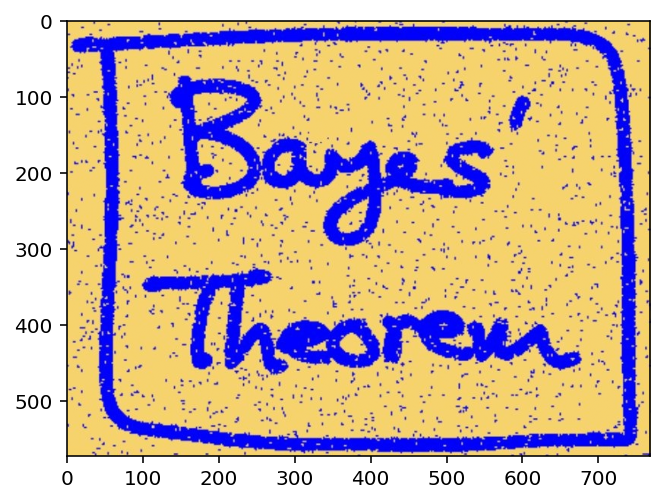

In [11]:
plt.imshow(img/255)
plt.show()

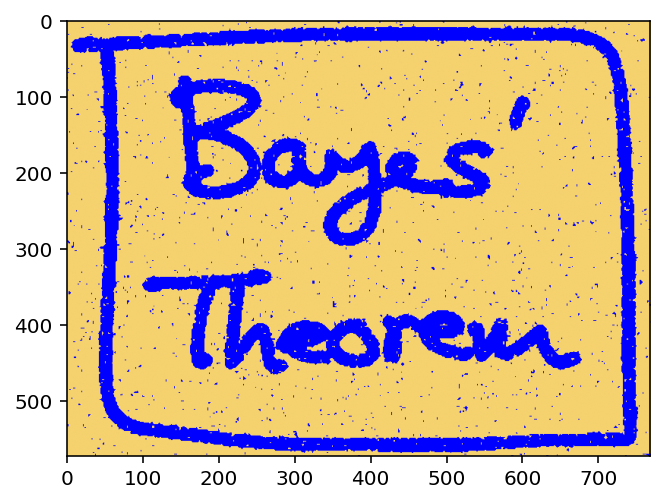

In [10]:
pairWiseCost = (1 - np.eye(nLabels)) * 0.5
mLambda = 10
labels = pygco.cut_general_graph(edges, mLambda*edgeWeights, unaryCosts, pairWiseCost)
output = formImg(img, labels)
plt.imshow(output/255)
plt.show()

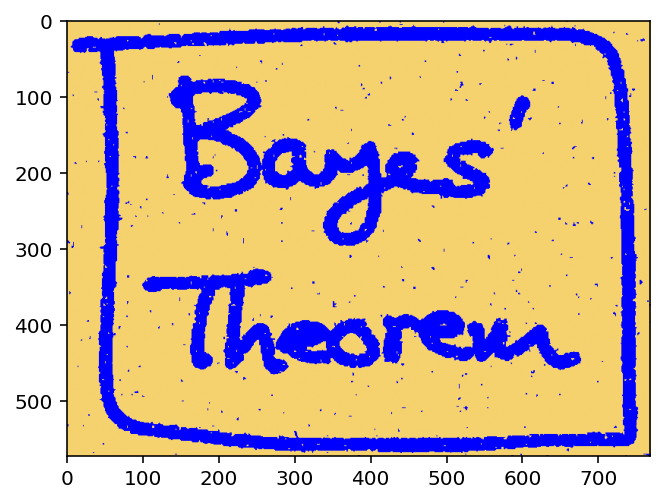

In [14]:
mLambda = 50
labels = pygco.cut_general_graph(edges, mLambda*edgeWeights, unaryCosts, pairWiseCost)
output = formImg(img, labels)
plt.imshow(output/255)
plt.show()

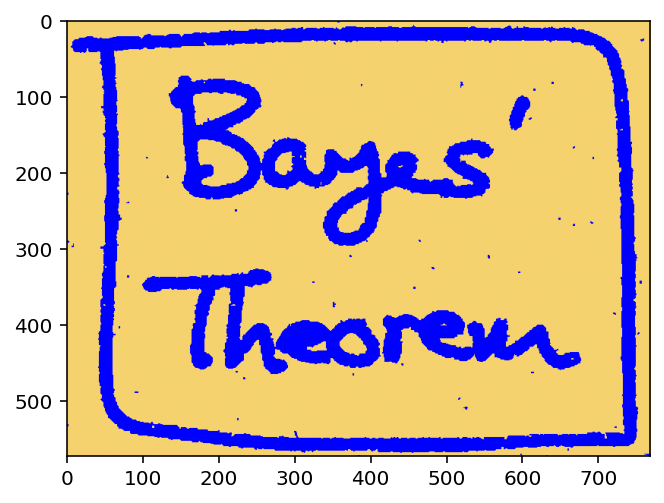

In [15]:
mLambda = 100
labels = pygco.cut_general_graph(edges, mLambda*edgeWeights, unaryCosts, pairWiseCost)
output = formImg(img, labels)
plt.imshow(output/255)
plt.show()

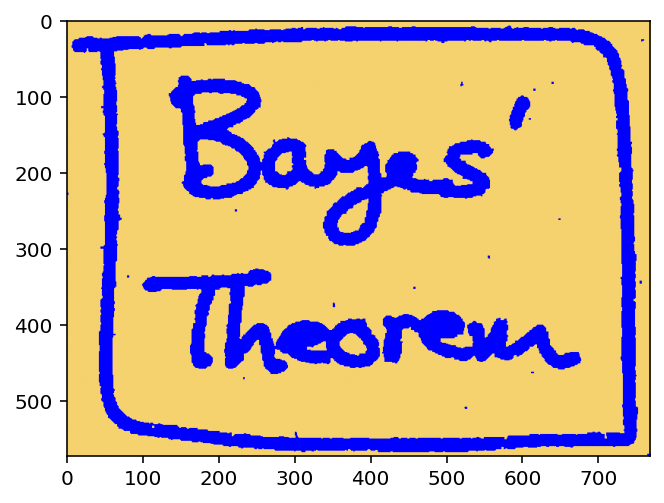

In [16]:
mLambda = 150
labels = pygco.cut_general_graph(edges, mLambda*edgeWeights, unaryCosts, pairWiseCost)
output = formImg(img, labels)
plt.imshow(output/255)
plt.show()

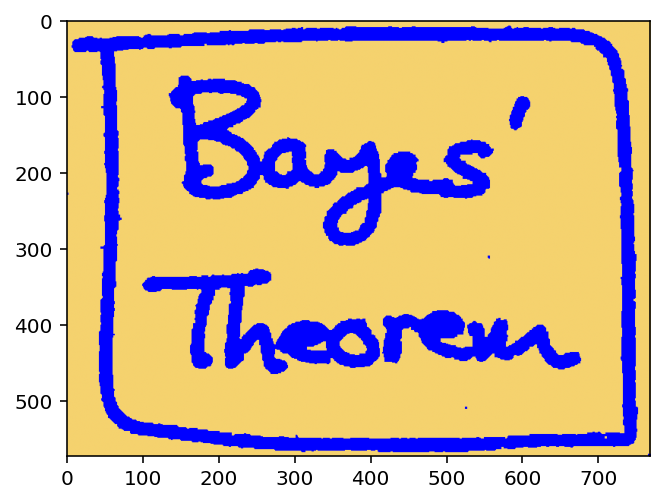

In [17]:
mLambda = 200
labels = pygco.cut_general_graph(edges, mLambda*edgeWeights, unaryCosts, pairWiseCost)
output = formImg(img, labels)
plt.imshow(output/255)
plt.show()

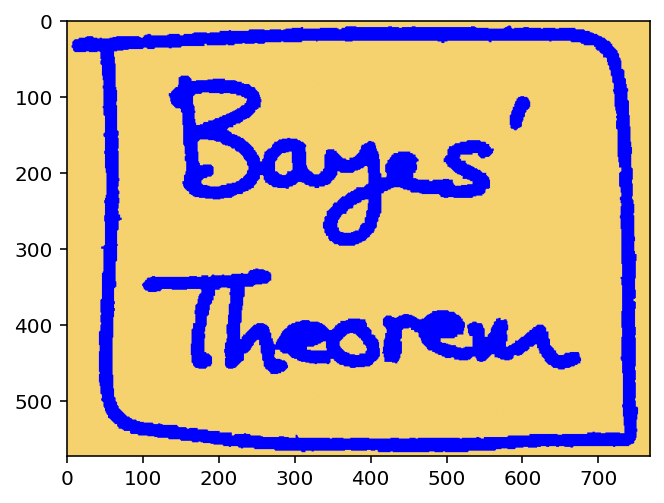

In [18]:
mLambda = 250
labels = pygco.cut_general_graph(edges, mLambda*edgeWeights, unaryCosts, pairWiseCost)
output = formImg(img, labels)
plt.imshow(output/255)
plt.show()

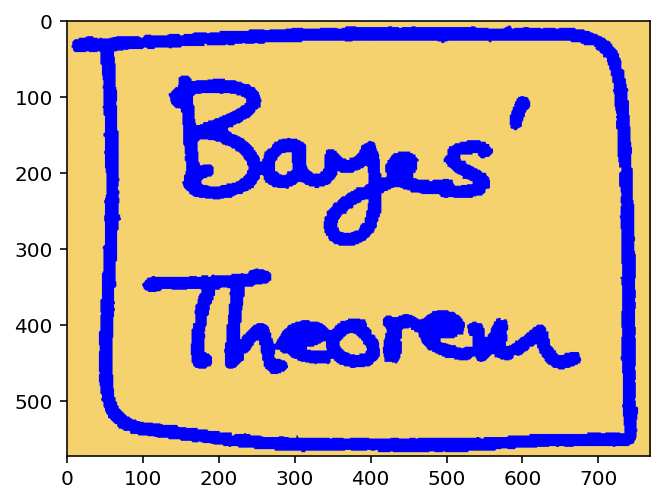

In [19]:
mLambda = 300
labels = pygco.cut_general_graph(edges, mLambda*edgeWeights, unaryCosts, pairWiseCost)
output = formImg(img, labels)
plt.imshow(output/255)
plt.show()

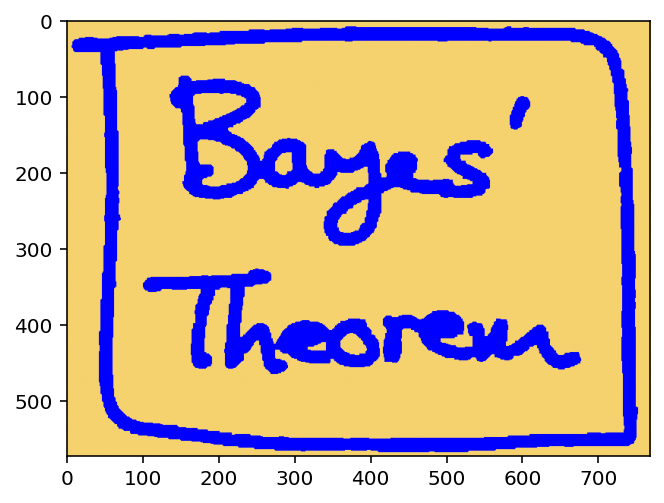

In [20]:
mLambda = 500
labels = pygco.cut_general_graph(edges, mLambda*edgeWeights, unaryCosts, pairWiseCost)
output = formImg(img, labels)
plt.imshow(output/255)
plt.show()

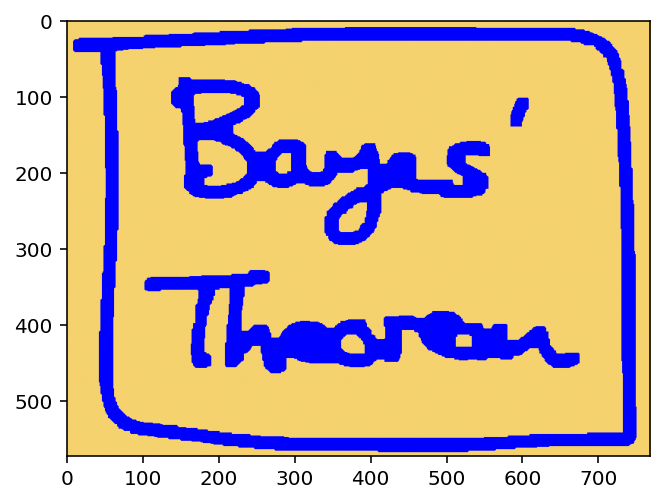

In [24]:
mLambda = 2500
labels = pygco.cut_general_graph(edges, mLambda*edgeWeights, unaryCosts, pairWiseCost)
output = formImg(img, labels)
plt.imshow(output/255)
plt.show()

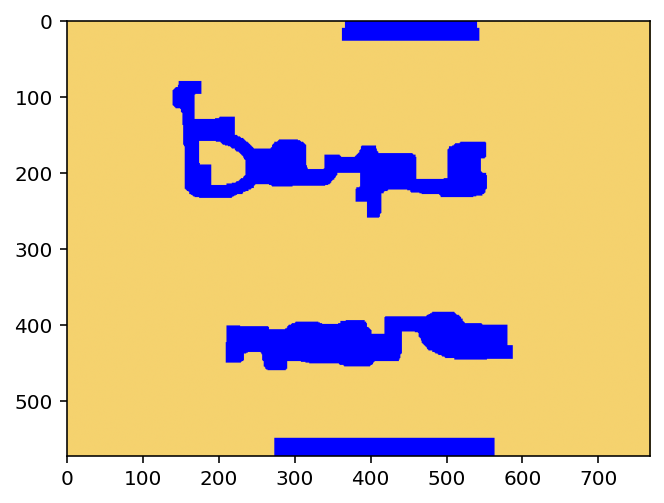

In [25]:
mLambda = 5000
labels = pygco.cut_general_graph(edges, mLambda*edgeWeights, unaryCosts, pairWiseCost)
output = formImg(img, labels)
plt.imshow(output/255)
plt.show()